# Event-Related VASO

This is the analysis code for the event-ralted VASO project. It should cover all the steps from the DCM to BIDS conversion until the final plots.

The steps involve:
1. conversion from DCM tpo bids with heudiconv
1.1. If EPI anatomy [Chai et al.](https://www.sciencedirect.com/science/article/pii/S1053811921007291?via%3Dihub) was acquired, process anatomical data.
2. make event files
3. making two derivatives branches (one for V1 and one for S1)
4. Do the motion correction for each of them separately (with motion masks centered on the regions of interest)
5. truncate the data to get rid of the upper and lower half for the V1 and S1 data, respectivelty
6. extract event related averages 
6.1. for blocks
6.2. for events
6.3. for layers

In [ ]:
import numpy as np
import glob
import nibabel as nb
import pandas as pd
import matplotlib.pyplot as plt
from nilearn import plotting
import seaborn as sns
from scipy.interpolate import interp1d
import os
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

## 1. BIDS conversion

I did the BIDS conversion for sub-05 06 and 07 already. Therefore, I will show it here for sub-08. Unfortunately, the code here cannot be run from within the notebook but has to be copied to the terminal.

In [ ]:
%%bash

docker run --rm -it -v /media/sebastian/Data/EVENTRELATED_PILOT/rawData:/base nipy/heudiconv:latest -d /base/DICOM/sub-{subject}/ses-{session}/*.IMA -o /base/Nifti/ -f convertall -s 08 -ss 001 -c none -g accession_number --overwrite
cp /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/.heudiconv/08/info/dicominfo_ses-001.tsv /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/code/sub-08_dicominfo_ses-001.tsv
docker run --rm -it -v /media/sebastian/Data/EVENTRELATED_PILOT/rawData:/base nipy/heudiconv:latest -d /base/DICOM/sub-{subject}/ses-{session}/*.IMA -o /base/Nifti/ -f /base/Nifti/code/heudiconv_heuristic_sub-08.py -s 08 -ss 001 -c dcm2niix -g accession_number -b --overwrite

In [10]:
root = '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti'
os.system(f'mkdir -p {root}/derivatives/sub-09/ses-001/v1Focus')
os.system(f'mkdir -p {root}/derivatives/sub-09/ses-001/s1Focus')

0

## 2. Make event Files

In [1]:
import numpy as np
import pandas as pd
import re
import nipype.interfaces.fsl as fsl
import glob

220113-17:01:44,12 nipype.utils WARNING:
	 A newer version (1.7.0) of nipy/nipype is available. You are using 1.6.1


In [ ]:
subs = ['05', '06', '07', '08']
dataDir = '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/'

for sub in subs:

    # check number of blockStim runs
    nrBlockStim = len(glob.glob(dataDir + f'sub-{sub}/ses-001/func/sub-{sub}_ses-001_task-blockStim_run-00*_cbv.nii.gz'))

    for n in range(1,nrBlockStim+1):

        logFile = pd.read_csv(f'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-{sub}/ses-001/events/sub{sub}_sess001_30sOnOff_run%s.log'%(n), usecols=[0])

        for index, row in logFile.iterrows():
            if re.search('Keypress: 5', str(row)):
                firstVolRow = index
                break


        ColNames = ['startTime', 'type', 'event']

        logFile = pd.read_csv(f'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-{sub}/ses-001/events/sub{sub}_sess001_30sOnOff_run%s.log'%(n), sep = '\t',skiprows=firstVolRow, names = ColNames)



        stimStart = []
        stimStop = []

        for index, row in logFile.iterrows():
            if re.search('stimulation started', logFile['event'][index]):
                stimStart.append(logFile['startTime'][index])
            if re.search('stimulation stopped', logFile['event'][index]):
                stimStop.append(logFile['startTime'][index])


        durs = np.asarray(stimStop) - np.asarray(stimStart)


        design = pd.DataFrame({'startTime': stimStart, 'duration': durs, 'mod' : np.ones(len(durs))})
        np.savetxt(r'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-%s/ses-001/events/sub-%s_ses-001_task-blockStim_run-00%s.txt'%(sub, sub, n), design.values, fmt='%1.2f')

    # check number of eventStim runs
    nrEventStim = len(glob.glob(dataDir + f'sub-{sub}/ses-001/func/sub-{sub}_ses-001_task-eventStim_run-00*_cbv.nii.gz'))


    for n in range(1,nrEventStim+1):

        logFile = pd.read_csv(f'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-{sub}/ses-001/events/sub{sub}_sess001_EventRelated5Fingers_run%s.log'%(n), usecols=[0])

        for index, row in logFile.iterrows():
            if re.search('Keypress: 5', str(row)):
                firstVolRow = index
                break


        ColNames = ['startTime', 'type', 'event']

        logFile = pd.read_csv(f'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-{sub}/ses-001/events/sub{sub}_sess001_EventRelated5Fingers_run{n}.log',sep = '\t',skiprows=firstVolRow, names = ColNames)



        stimStart = []
        stimStop = []

        for index, row in logFile.iterrows():
            if re.search('visual stimulation started', logFile['event'][index]):
                stimStart.append(logFile['startTime'][index])
            if re.search('visual stimulation stopped', logFile['event'][index]):
                stimStop.append(logFile['startTime'][index])


        durs = np.asarray(stimStop) - np.asarray(stimStart)


        design = pd.DataFrame({'startTime': stimStart, 'duration': durs, 'mod' : np.ones(len(durs))})
        np.savetxt(r'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-%s/ses-001/events/sub-%s_ses-001_task-eventStim_run-00%s.txt'%(sub, sub, n), design.values, fmt='%1.2f')




    # cp -r /media/sebastian/Data/s1anfunco_backup/s1_anfunco_analysis_04-05-2021/sub16/func/vaso/stimulation/run1/VASO.feat/reg .
    # cp mean_func.nii.gz reg/standard.nii.gz


## 3. Make two branches

In the derivatives folde, make a branch for V1 and S1 separately.

In [1]:
%%bash


for sub in 10
# for sub in 05 06 07
do
for focus in s1 v1
do
mkdir -p '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-'$sub'/ses-001/'$focus'Focus/'

done
done

In [ ]:
%%bash


# for sub in 08
for sub in 05 06 07
do

cd '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-'$sub'/ses-001/v1Focus/'
cp oldAnalysis/*reference.nii .
cp oldAnalysis/*confounds.nii .
cp -r oldAnalysis/motionParameters .

cd '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-'$sub'/ses-001/s1Focus/'
cp mocoToEachRun/*reference.nii .
cp mocoToEachRun/*confounds.nii .
cp -r mocoToEachRun/motionParameters .


done

## 4. Preprocess data in the two branches


### 4.1 Do motion correction separately

Here, I also get rid of the noise scans

In [4]:
%%bash



# for sub in 05 06 07 08
for sub in 10
do
for focus in v1 s1

do
echo ""
echo ""
echo ""
echo ""
echo 'processing sub-'$sub''

# mkdir '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-'$sub'/ses-001/'$focus'Focus/'
cd '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-'$sub'/ses-001/'$focus'Focus/'

declare -a runs=('/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-'$sub'/ses-001/func/*.nii.gz')
echo $runs

echo 'Found '${#runs[@]}' run(s) for sub-'$sub''

for run in $runs
do
echo 'processing run '$run''

# define basename for output files
base=`basename $run _cbv.nii.gz`

###########################################
###### parameters that are not used  ######
###########################################

ITK_GLOBAL_DEFAULT_NUMBER_OF_THREADS=8
export ITK_GLOBAL_DEFAULT_NUMBER_OF_THREADS
tr=1
basevol=1000 # ANTs indexing

mkdir -p motionParameters/nn_motion/${base}
mkdir -p motionParameters/n_motion/${base}


###########################################
####### preparig odd and even images ######
###########################################

#for classical Magentom VASO sequences
3dcalc -a $run'[0..$(2)]' -expr 'a' -prefix ${base}_notnulled.nii -overwrite
3dcalc -a $run'[1..$(2)]' -expr 'a' -prefix ${base}_nulled.nii -overwrite


###########################################
####### Do MOCO on notnulled  #############
###########################################

n_vols=`PrintHeader ${base}_notnulled.nii | grep Dimens | cut -d ',' -f 4 | cut -d ']' -f 1`

# Here I say that the last two volumes should be ignored later
n_vols=$((n_vols-2))



echo "seperating $n_vols time steps to save RAM"
ImageMath 4 vol_.nii TimeSeriesDisassemble ${base}_notnulled.nii # vol_1000.nii, vol_1001.nii ...
cp vol_1003.nii vol_1000.nii # removing steady state effects
cp vol_1004.nii vol_1001.nii
cp vol_1005.nii vol_1002.nii
3dMean -prefix ${base}_nn_reference.nii vol_1004.nii vol_1005.nii # there is no overwrite here, in case of multiple series
nthvol=$(($basevol + $n_vols - 1)) # Zero indexing
echo "doing the alignemt"
for i in $(eval echo "{$basevol..$nthvol}");
do
antsRegistration \
--dimensionality 3 \
--float 1 \
--collapse-output-transforms 1 \
--output [ vol_${i}_,vol_${i}_Warped.nii.gz,vol_${i}_InverseWarped.nii.gz ] \
--interpolation BSpline[2] \
--use-histogram-matching 1 \
--winsorize-image-intensities [ 0.005,0.995 ] \
-x ''$focus'Moma.nii' \
--initial-moving-transform [ ${base}_nn_reference.nii,vol_${i}.nii,1 ] \
--transform Rigid[ 0.1 ] \
--metric MI[ ${base}_nn_reference.nii,vol_${i}.nii,1,32,Regular,0.25 ] \
--convergence [ 250x100,1e-6,10 ] \
--shrink-factors 2x1 \
--smoothing-sigmas 1x0vox

done

echo "reassembling the time points"
ImageMath 4 ${base}_moco_notnulled.nii TimeSeriesAssemble $tr 0 vol_*_Warped.nii.gz
mv vol_*.nii motionParameters/nn_motion/${base}
mv vol_*_0GenericAffine.mat motionParameters/nn_motion/${base}
mv vol_*_1Warp.nii.gz motionParameters/nn_motion/${base}
mv vol_*_1InverseWarp.nii.gz motionParameters/nn_motion/${base}
mv vol_*_InverseWarped.nii.gz motionParameters/nn_motion/${base}
mv vol_*_Warped.nii.gz motionParameters/nn_motion/${base}


###########################################
####### Do MOCO on nulled  ################
###########################################

n_vols=`PrintHeader ${base}_nulled.nii | grep Dimens | cut -d ',' -f 4 | cut -d ']' -f 1`

echo "seperating $n_vols time steps to save RAM"
ImageMath 4 vol_.nii TimeSeriesDisassemble ${base}_nulled.nii # vol_1000.nii, vol_1001.nii ...
cp vol_1003.nii vol_1000.nii # removing steady state effects
cp vol_1004.nii vol_1001.nii
cp vol_1005.nii vol_1002.nii
3dMean -prefix ${base}_n_reference.nii vol_1004.nii vol_1005.nii # there is no overwrite here, in case of multiple series
nthvol=$(($basevol + $n_vols - 1)) # Zero indexing
echo "doing the alignemt"
for i in $(eval echo "{$basevol..$nthvol}");
do
antsRegistration \
--dimensionality 3 \
--float 1 \
--collapse-output-transforms 1 \
--output [ vol_${i}_,vol_${i}_Warped.nii.gz,vol_${i}_InverseWarped.nii.gz ] \
--interpolation BSpline[2] \
--use-histogram-matching 1 \
--winsorize-image-intensities [ 0.005,0.995 ] \
-x ''$focus'Moma.nii' \
--initial-moving-transform [ ${base}_n_reference.nii,vol_${i}.nii,1 ] \
--transform Rigid[ 0.1 ] \
--metric MI[ ${base}_n_reference.nii,vol_${i}.nii,1,32,Regular,0.25 ] \
--convergence [ 250x100,1e-6,10 ] \
--shrink-factors 2x1 \
--smoothing-sigmas 1x0vox

done
echo "reassembling the time points"
ImageMath 4 ${base}_moco_nulled.nii TimeSeriesAssemble $tr 0 vol_*_Warped.nii.gz
mv vol_*.nii motionParameters/n_motion/${base}
mv vol_*_0GenericAffine.mat motionParameters/n_motion/${base}
mv vol_*_1Warp.nii.gz motionParameters/n_motion/${base}
mv vol_*_1InverseWarp.nii.gz motionParameters/n_motion/${base}
mv vol_*_InverseWarped.nii.gz motionParameters/n_motion/${base}
mv vol_*_Warped.nii.gz motionParameters/n_motion/${base}


##############################
#### fsl_motion_outliers  ####
##############################

fsl_motion_outliers -i ${base}_nulled.nii -o ${base}_nulled_confounds.txt
fsl_motion_outliers -i ${base}_notnulled.nii -o ${base}_notnulled_confounds.txt

done
done
done





processing sub-10
/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-10/ses-001/func/sub-10_ses-001_task-blockStim_run-001_cbv.nii.gz /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-10/ses-001/func/sub-10_ses-001_task-blockStim_run-002_cbv.nii.gz /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-10/ses-001/func/sub-10_ses-001_task-eventStimRandom_run-001_cbv.nii.gz /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-10/ses-001/func/sub-10_ses-001_task-eventStimRandom_run-002_cbv.nii.gz /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-10/ses-001/func/sub-10_ses-001_task-eventStim_run-001_cbv.nii.gz /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-10/ses-001/func/sub-10_ses-001_task-eventStim_run-002_cbv.nii.gz /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-10/ses-001/func/sub-10_ses-001_task-eventStim_run-003_cbv.nii.gz
Found 1 run(s) for sub-10
processing run /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/su

++ 3dcalc: AFNI version=AFNI_21.1.07 (May 11 2021) [64-bit]
++ Authored by: A cast of thousands
++ Output dataset ./sub-10_ses-001_task-blockStim_run-001_notnulled.nii
++ 3dcalc: AFNI version=AFNI_21.1.07 (May 11 2021) [64-bit]
++ Authored by: A cast of thousands
++ Output dataset ./sub-10_ses-001_task-blockStim_run-001_nulled.nii
++ 3dMean: AFNI version=AFNI_21.1.07 (May 11 2021) [64-bit]
*+ WARNING:   If you are performing spatial transformations on an oblique dset,
  such as /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-10/ses-001/v1Focus/vol_1004.nii,
  or viewing/combining it with volumes of differing obliquity,
  you should consider running: 
     3dWarp -deoblique 
  on this and  other oblique datasets in the same session.
 See 3dWarp -help for details.
++ Oblique dataset:/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-10/ses-001/v1Focus/vol_1004.nii is 44.400005 degrees from plumb.
++ Oblique dataset:/media/sebastian/Data/EVENTREL

In [5]:
%%bash

imageTypes=("n" "nn")

for sub in 10
# for sub in 05 06 07 08

do

# for focus in s1
for focus in v1 s1

do
echo ""
echo ""
echo ""
echo ""
echo 'processing sub-'$sub''

declare -a runs=('/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-'$sub'/ses-001/func/*.nii.gz')
echo $runs

echo 'Found '${#runs[@]}' run(s) for sub-'$sub''

for run in $runs
do
echo 'processing run '$run''

# define basename for output files
base=`basename $run _cbv.nii.gz`



cd '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-'$sub'/ses-001/'$focus'Focus/'

n_vols=`PrintHeader ${base}_moco_notnulled.nii | grep Dimens | cut -d ',' -f 4 | cut -d ']' -f 1`
num=$((n_vols + 1000))

echo $num

for imageType in "${imageTypes[@]}"
do

cd '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-'$sub'/ses-001/'$focus'Focus/motionParameters/'$imageType'_motion/'${base}''

for (( k=1000; k<$num; k++ ))
do
ConvertTransformFile \
3 \
'vol_'$k'_0GenericAffine.mat' \
'vol_'$k'_0GenericAffine_af.mat' \
--convertToAffineType


c3d_affine_tool \
-ref '../../../'${base}'_'$imageType'_reference.nii' \
-src 'vol_'$k'.nii' \
-itk 'vol_'$k'_0GenericAffine_af.mat' -ras2fsl \
-o 'vol_'$k'_0GenericAffine_FSL.mat' \
-info-full
done

done

done

done

done

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [85]:
import itertools
from IPython.display import clear_output

import numpy as np
import glob
import pandas as pd
import os


root = '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti'


modalities = ["n", 'nn']
modalitiesDict = {'n': 'VASO', 'nn': 'BOLD'}

for sub in ['sub-09']:
    
    runs = sorted(glob.glob(f'{root}/{sub}/ses-00*/func/{sub}_ses-00*_task-*_run-00*_cbv.nii.gz'))

    sessions = []
    for run in runs:
        
        if 'ses-001' in run:
            if not any('ses-001' in s for s in sessions):
                sessions.append('ses-001')
        if 'ses-002' in run:
            if not any('ses-002' in s for s in sessions):
                sessions.append('ses-002')

In [86]:
sessions

['ses-001', 'ses-002']

In [87]:
import itertools
from IPython.display import clear_output

import numpy as np
import glob
import pandas as pd
import os


root = '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti'


modalities = ["n", 'nn']
modalitiesDict = {'n': 'VASO', 'nn': 'BOLD'}

for sub in ['sub-09']:
    
    runsAll = sorted(glob.glob(f'{root}/{sub}/ses-00*/func/{sub}_ses-00*_task-*_run-00*_cbv.nii.gz'))

    sessions = []
    for run in runsAll:
        
        if 'ses-001' in run:
            if not any('ses-001' in s for s in sessions):
                sessions.append('ses-001')
        if 'ses-002' in run:
            if not any('ses-002' in s for s in sessions):
                sessions.append('ses-002')
                
    for ses in sessions:
        
        runs = sorted(glob.glob(f'{root}/{sub}/{ses}/func/{sub}_ses-00*_task-*_run-00*_cbv.nii.gz'))
        
        for focus in ['s1Focus', 'v1Focus']:    

            lstsubMot = []
            lstsubMot_Nme = []
            lstTR_sub = []
            sub_list = []
            modalityList = []
            runsList = []
            focusList = []



            for run in runs:

                base = os.path.basename(run).rsplit('.', 2)[0][:-4]
                print(base)


                for modality in modalities:
                    affinemats = sorted(glob.glob(f'{root}/derivatives/{sub}/{ses}/{focus}/motionParameters/{modality}_motion/{base}/vol_*_0GenericAffine_FSL.mat'))
                    print(len(affinemats))

                    volids=[]
                    for n in range(len(affinemats)):
                        volids.append(n+1000)

                    for volid in volids:

                        # Current mats
                        currMats = f'{root}/derivatives/{sub}/{ses}/{focus}/motionParameters/{modality}_motion/{base}/vol_{volid}_0GenericAffine_FSL.mat'

                        tmp = fsl.AvScale(all_param=True,mat_file=currMats);

                        tmpReadout = tmp.run();

                        # Get the rotations (in rads) and translations (in mm) per volume

                        aryTmpMot = list(itertools.chain.from_iterable([tmpReadout.outputs.translations,tmpReadout.outputs.rot_angles]));




                        # Save the roation and translations
                        lstsubMot.append(aryTmpMot)
                        lstTR_sub.append([int(volid)+1-1000 for i in range(6)])
                        lstsubMot_Nme.append([f'TX {modalitiesDict[modality]}',f'TY {modalitiesDict[modality]}',f'TZ {modalitiesDict[modality]}',f'RX {modalitiesDict[modality]}',f'RY {modalitiesDict[modality]}',f'RZ {modalitiesDict[modality]}'])
                        sub_list.append([str(sub) for i in range(6)])
                        modalityList.append([str(modalitiesDict[modality]) for i in range(6)])
                        runsList.append([str(f'{base}') for i in range(6)])
                        focusList.append([str(focus) for i in range(6)])


                clear_output(wait=True)
                print(f'Done with {base}')

            aryCurr = np.array(lstsubMot)
            aryCurr_Ses =  aryCurr.reshape((aryCurr.size,-1))
            aryCurr_TR = np.array(lstTR_sub)
            aryCurr_TR_Ses = aryCurr_TR.reshape((aryCurr_TR.size,-1))
            aryCurr_Nme = np.array(lstsubMot_Nme)
            aryCurr_Nme_Ses = aryCurr_Nme.reshape((aryCurr_Nme.size,-1))
            aryIdx = np.arange(1,len(aryCurr_Nme_Ses)+1)

            aryCurr_mod = np.array(modalityList)
            aryCurr_mod = aryCurr_mod.reshape((aryCurr_mod.size,-1))

            aryCurr_subname = np.array(sub_list)
            aryCurr_subs =  aryCurr_subname.reshape((aryCurr_subname.size,-1))

            aryCurr_runsList = np.array(runsList)
            aryCurr_runs =  aryCurr_runsList.reshape((aryCurr_runsList.size,-1))

            aryCurr_focusList = np.array(focusList)
            aryCurr_focus =  aryCurr_focusList.reshape((aryCurr_focusList.size,-1))


            data_dict = {
                'subject': aryCurr_subs[:,0],
                'Time/TR': aryCurr_TR_Ses[:,0],
                'Motion_Name': aryCurr_Nme_Ses[:,0],
                'Motion': aryCurr_Ses[:,0],
                'idx':aryIdx,
                'modality': aryCurr_mod[:,0],
                'run': aryCurr_runs[:,0],
                'focus': aryCurr_focus[:,0]}

            pd_ses = pd.DataFrame(data=data_dict)
            pd_ses.to_csv(f'{root}/derivatives/{sub}/{ses}/{focus}/motionParameters/{sub}_motionParameters.csv', index=False)

Done with sub-09_ses-002_task-eventStimVisOnly_run-004


### inspect motion traces

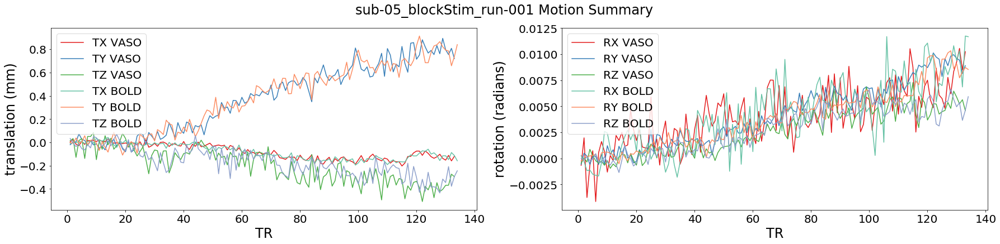

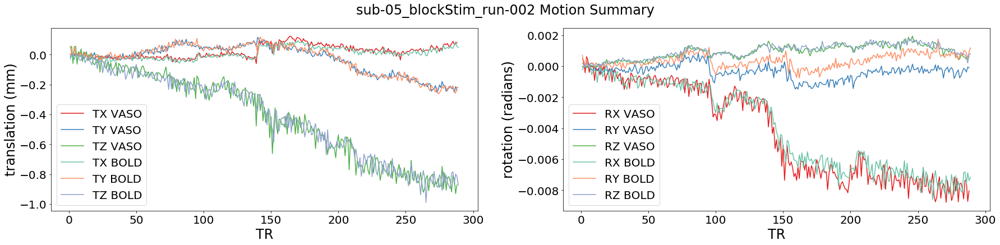

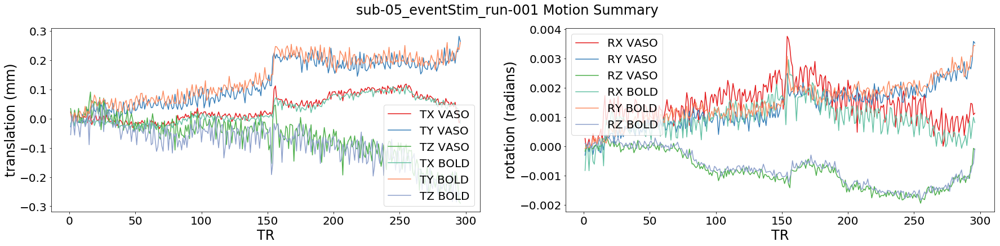

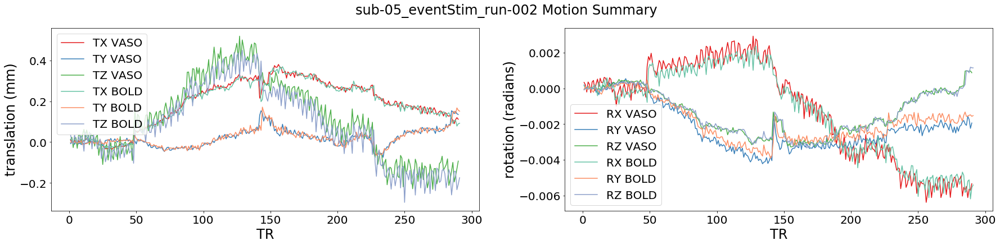

KeyboardInterrupt: 

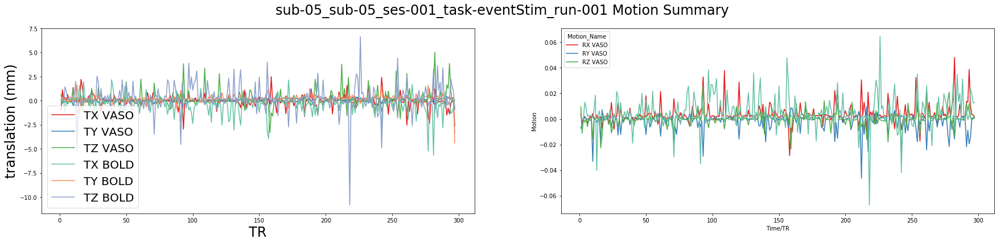

In [95]:
# Load dataFrames
subs = ['sub-05', 'sub-06', 'sub-07','sub-08','sub-09', 'sub-10']

for sub in subs:
    
    runsAll = sorted(glob.glob(f'{root}/{sub}/ses-00*/func/{sub}_ses-00*_task-*_run-00*_cbv.nii.gz'))

    sessions = []
    for run in runsAll:
        
        if 'ses-001' in run:
            if not any('ses-001' in s for s in sessions):
                sessions.append('ses-001')
        if 'ses-002' in run:
            if not any('ses-002' in s for s in sessions):
                sessions.append('ses-002')
                
    for ses in sessions:
        
        for focus in ['v1Focus', 's1Focus']:

            motionData = pd.read_csv(f'{root}/derivatives/{sub}/{ses}/{focus}/motionParameters/{sub}_motionParameters.csv')

            for run in motionData['run'].unique():

                motionData_rot_VASO = motionData.loc[(motionData['run']==run)&(motionData['Motion_Name'].str.contains("R") == 1)&(motionData['subject']==sub)&(motionData['modality']=='VASO')].dropna()
                motionData_trans_VASO = motionData.loc[(motionData['run']==run)&(motionData['Motion_Name'].str.contains("T") == 1)&(motionData['subject']==sub)&(motionData['modality']=='VASO')].dropna()

                motionData_rot_BOLD = motionData.loc[(motionData['run']==run)&(motionData['Motion_Name'].str.contains("R") == 1)&(motionData['subject']==sub)&(motionData['modality']=='BOLD')].dropna()
                motionData_trans_BOLD = motionData.loc[(motionData['run']==run)&(motionData['Motion_Name'].str.contains("T") == 1)&(motionData['subject']==sub)&(motionData['modality']=='BOLD')].dropna()


                fig, axes = plt.subplots(1, 2,sharex=True,figsize=(30,6))
                plt.suptitle(f'{sub}_{run} Motion Summary', fontsize=24)


                sns.lineplot(ax=axes[0], x='Time/TR',y='Motion',data=motionData_trans_VASO.iloc[:-3,:] ,hue='Motion_Name', palette = 'Set1')
                sns.lineplot(ax=axes[0], x='Time/TR',y='Motion',data=motionData_trans_BOLD.iloc[:-3,:],hue='Motion_Name', palette = 'Set2')


                axes[0].set_ylabel("translation (mm)", fontsize=24)
                axes[0].legend(fontsize=20)

                axes[0].set_xlabel("TR", fontsize=24)

                sns.lineplot(ax=axes[1], x='Time/TR',y='Motion',data=motionData_rot_VASO.iloc[:-3,:],hue='Motion_Name', palette = 'Set1')
                sns.lineplot(ax=axes[1], x='Time/TR',y='Motion',data=motionData_rot_BOLD.iloc[:-3,:],hue='Motion_Name', palette = 'Set2')


                axes[1].set_xlabel("TR", fontsize=24)
                axes[1].set_ylabel("rotation (radians)", fontsize=24)
                axes[1].legend(fontsize=20)

                axes[0].tick_params(axis='both', labelsize=20)
                axes[1].tick_params(axis='both', labelsize=20)

                plt.savefig(f'{root}/derivatives/{sub}/{ses}/{focus}/motionParameters/{run}_motion.jpg', bbox_inches = 'tight', pad_inches = 0)
                plt.show()

### Convert to Framewise Displacements

To have a summary of the framewise motion, we can compute framewise displacements. This will be a criterion to exclude individual trials in later stages

In [83]:
import os
modalities = ["n", 'nn']
modalitiesDict = {'n': 'VASO', 'nn': 'BOLD'}


sub_FD = []
timepoints = []
subjects=[]
mods = []
runList = []
subs = ['sub-05', 'sub-06', 'sub-07','sub-08','sub-09', 'sub-10']
# subs = ['sub-09']

for sub in subs:
    runs = sorted(glob.glob(f'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/{sub}/ses-00*/func/{sub}_ses-00*_task-*_run-00*_cbv.nii.gz'))

    for focus in ['v1Focus']:
        for run in runs:

            base = os.path.basename(run).rsplit('.', 2)[0][:-4]
            print(base)        
            
            if 'ses-001' in base:
                ses='ses-001'
            if 'ses-002' in base:
                ses='ses-002'
                
            pd_ses = pd.read_csv(f'{root}/{sub}/{ses}/{focus}/motionParameters/{sub}_motionParameters.csv')
            pd_ses['run'] = sub + f'_{ses}_task-' + pd_ses['run'].astype(str)


            for modality in modalities:

                TX = pd_ses['Motion'].loc[(pd_ses['run'].str.contains(base) == 1)&(pd_ses['Motion_Name'].str.contains("TX") == 1)&(pd_ses['subject']==sub)&(pd_ses['modality']==modalitiesDict[modality])].tolist()
                TY = pd_ses['Motion'].loc[(pd_ses['run'].str.contains(base) == 1)&(pd_ses['Motion_Name'].str.contains("TY") == 1)&(pd_ses['subject']==sub)&(pd_ses['modality']==modalitiesDict[modality])].tolist()
                TZ = pd_ses['Motion'].loc[(pd_ses['run'].str.contains(base) == 1)&(pd_ses['Motion_Name'].str.contains("TZ") == 1)&(pd_ses['subject']==sub)&(pd_ses['modality']==modalitiesDict[modality])].tolist()

                RX = pd_ses['Motion'].loc[(pd_ses['run'].str.contains(base) == 1)&(pd_ses['Motion_Name'].str.contains("RX") == 1)&(pd_ses['subject']==sub)&(pd_ses['modality']==modalitiesDict[modality])].tolist()
                RY = pd_ses['Motion'].loc[(pd_ses['run'].str.contains(base) == 1)&(pd_ses['Motion_Name'].str.contains("RY") == 1)&(pd_ses['subject']==sub)&(pd_ses['modality']==modalitiesDict[modality])].tolist()
                RZ = pd_ses['Motion'].loc[(pd_ses['run'].str.contains(base) == 1)&(pd_ses['Motion_Name'].str.contains("RZ") == 1)&(pd_ses['subject']==sub)&(pd_ses['modality']==modalitiesDict[modality])].tolist()

                for n in range(len(TX)-4):
                    FD_trial = abs(TX[n]-TX[n+1])+abs(TY[n]-TY[n+1])+abs(TZ[n]-TZ[n+1])+abs((50*RX[n])-(50*RX[n+1]))+abs((50*RY[n])-(50*RY[n+1]))+abs((50*RZ[n])-(50*RZ[n+1]))
                    sub_FD.append(FD_trial)
                    timepoints.append(n)
                    subjects.append(sub)
                    mods.append(modalitiesDict[modality])
                    runList.append(base)


        FDs = pd.DataFrame({'subject':subjects, 'volume':timepoints, 'FD':sub_FD, 'modality': mods, 'run': runList})
        FDs.to_csv(f'{root}/{sub}/{ses}/{focus}/motionParameters/{sub}_FDs.csv', index=False)

sub-05_ses-001_task-blockStim_run-001
sub-05_ses-001_task-blockStim_run-002
sub-05_ses-001_task-eventStim_run-001
sub-05_ses-001_task-eventStim_run-002
sub-06_ses-001_task-blockStim_run-001
sub-06_ses-001_task-blockStim_run-002
sub-06_ses-001_task-eventStim_run-001
sub-06_ses-001_task-eventStim_run-002
sub-06_ses-001_task-eventStim_run-003
sub-06_ses-001_task-eventStim_run-004
sub-07_ses-001_task-blockStim_run-001
sub-07_ses-001_task-blockStim_run-002
sub-07_ses-001_task-eventStim_run-001
sub-07_ses-001_task-eventStim_run-002
sub-07_ses-001_task-eventStim_run-003
sub-07_ses-001_task-eventStim_run-004
sub-08_ses-001_task-blockStim_run-001
sub-08_ses-001_task-blockStim_run-002
sub-08_ses-001_task-eventStim_run-001
sub-08_ses-001_task-eventStim_run-002
sub-08_ses-001_task-eventStim_run-003
sub-08_ses-001_task-eventStim_run-004
sub-09_ses-001_task-blockStimLongTR_run-001
sub-09_ses-001_task-blockStimLongTR_run-002
sub-09_ses-001_task-blockStimVisOnly_run-001
sub-09_ses-001_task-blockStimVi

### Inspect motion

In [ ]:
events = pd.read_csv(f'{root}/{sub}/ses-001/events/{base}.txt', sep = ' ', names = ['start','duration','trialType'])[:-1]
tr=1.3088939024390243
            

for i, row in events.iterrows():


    onset = round(row['start']/tr)
    # Do the same for the offset
    offset = round(onset + row['duration']/tr)


    # truncate motion data to event
    tmp = FDs.loc[(FDs['volume']>=(onset-2)/2)&(FDs['volume']<=(offset+2)/2)&(FDs['run'].str.contains(f'{base}[-17:]'))]


    if not (tmp['FD']>=2).any():

        layerEventResults[focus][sub][base][modality][f'layer {j}'][f'trial {i}'] = np.mean((((data[:, :, :, int(onset-4):int(offset+ 8)][layerRoi.astype(bool)]) / mask_mean)- 1) * 100,axis=0)
        includedTrials.append(f'trial {i}')



sub-05


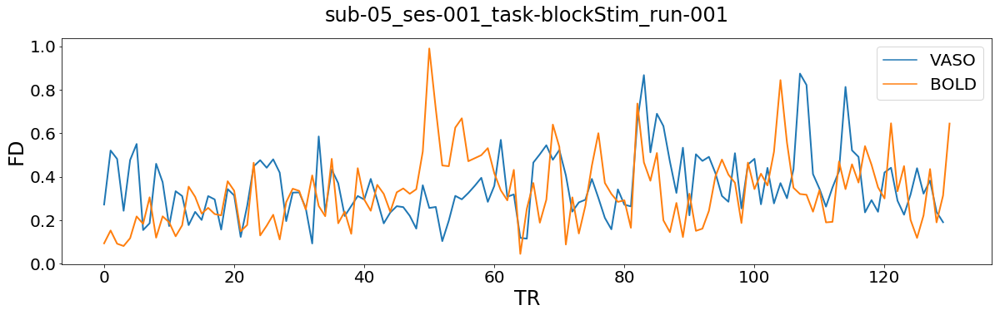

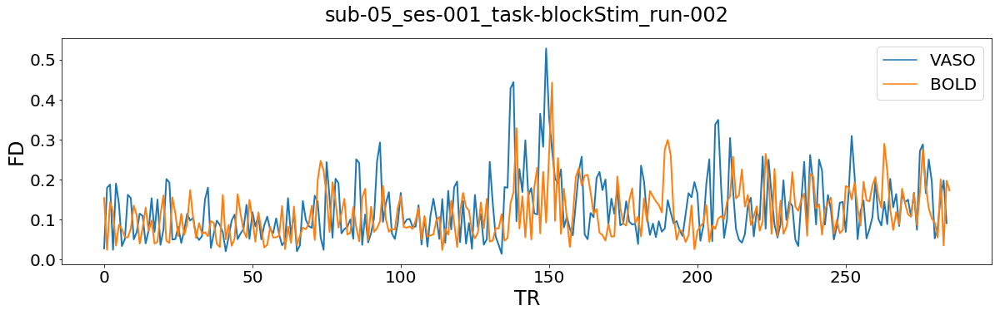

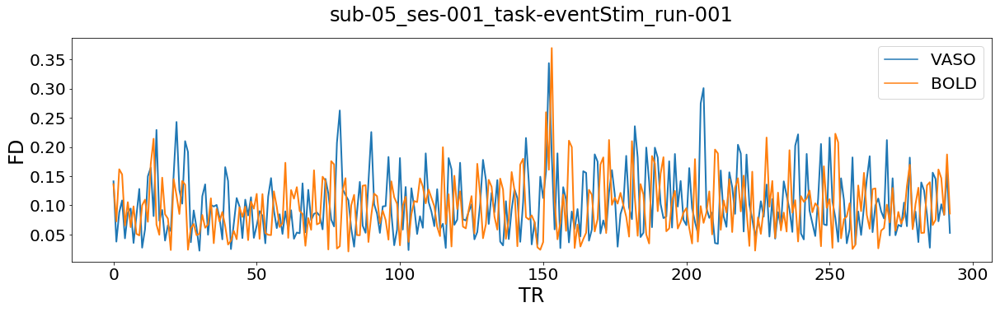

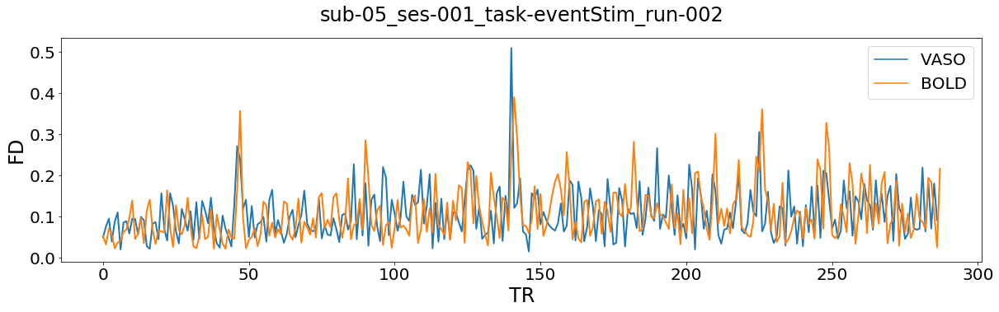

sub-06


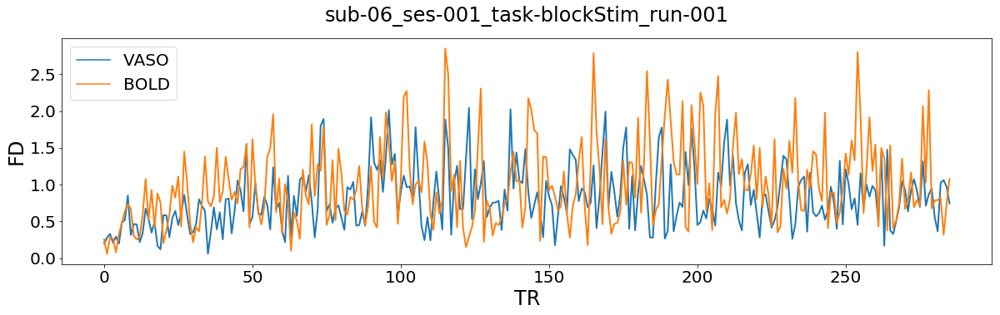

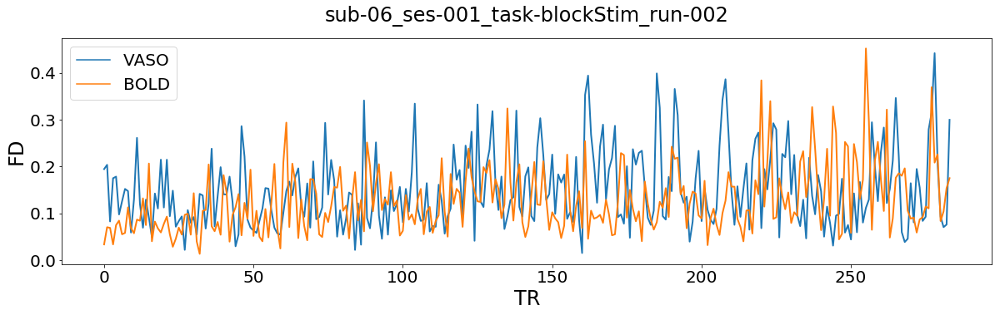

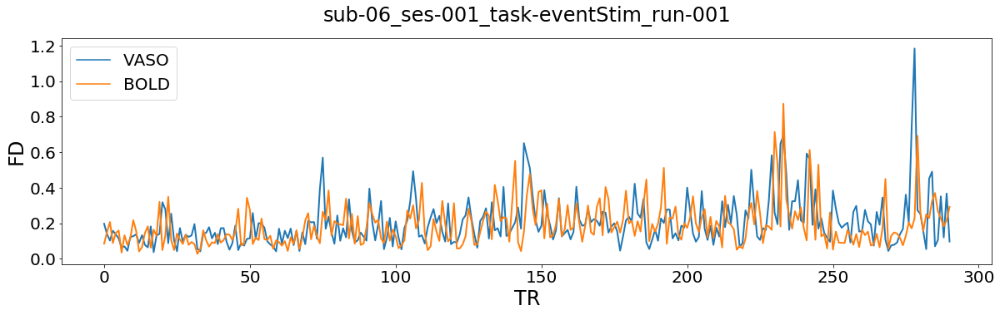

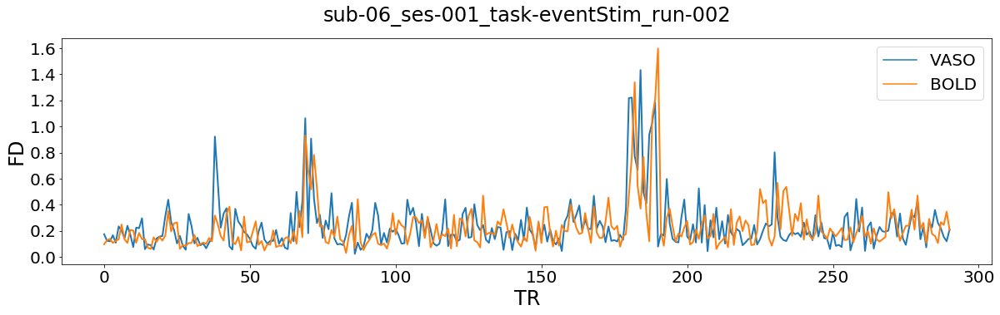

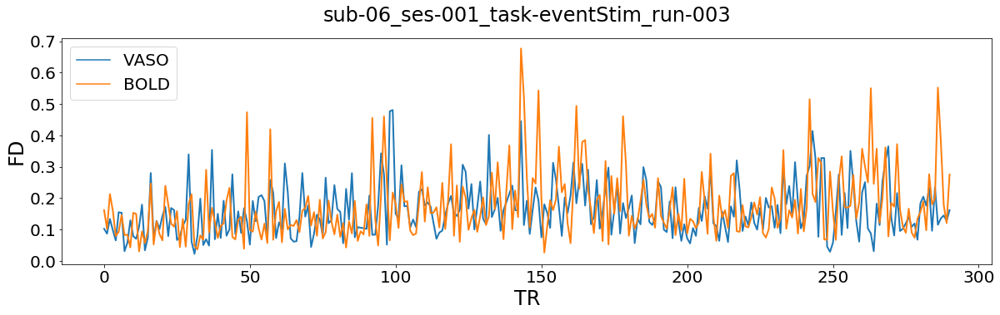

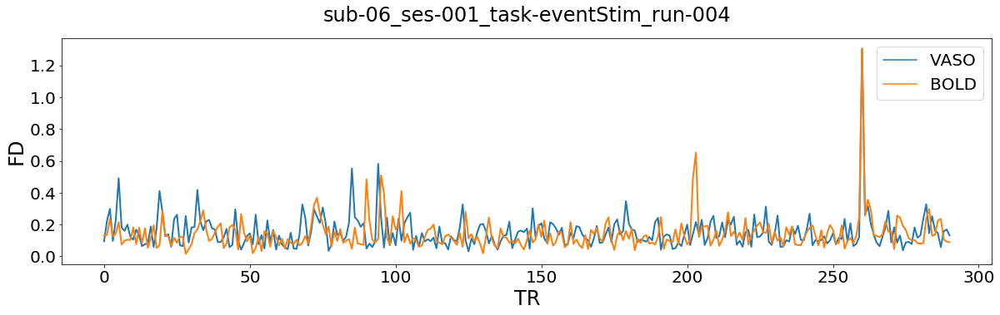

sub-07


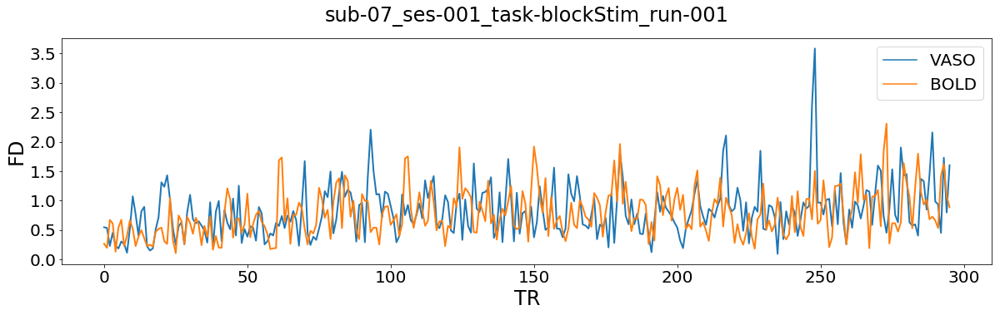

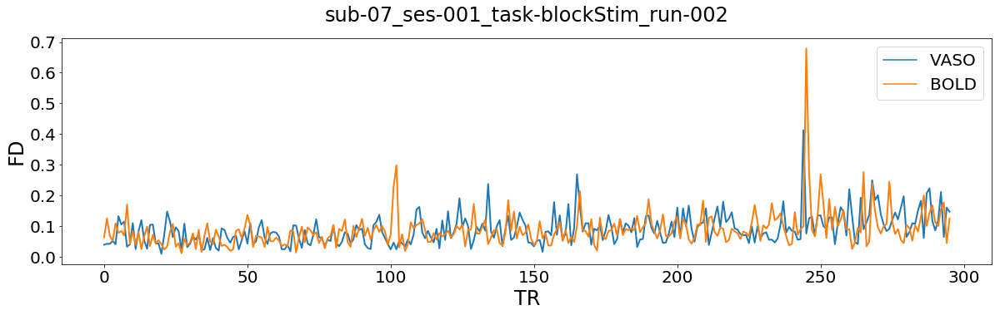

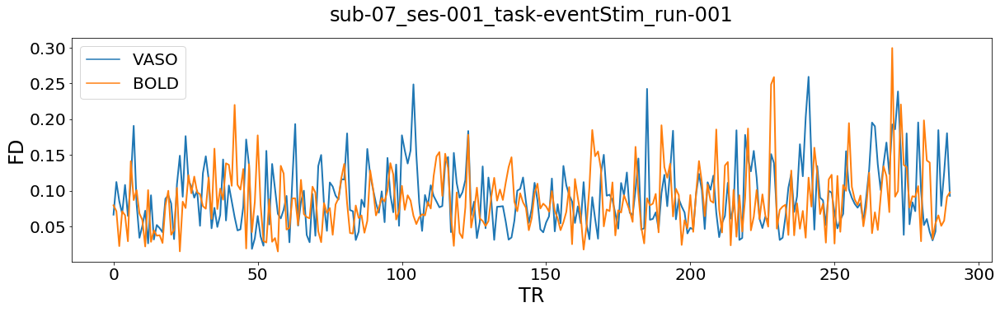

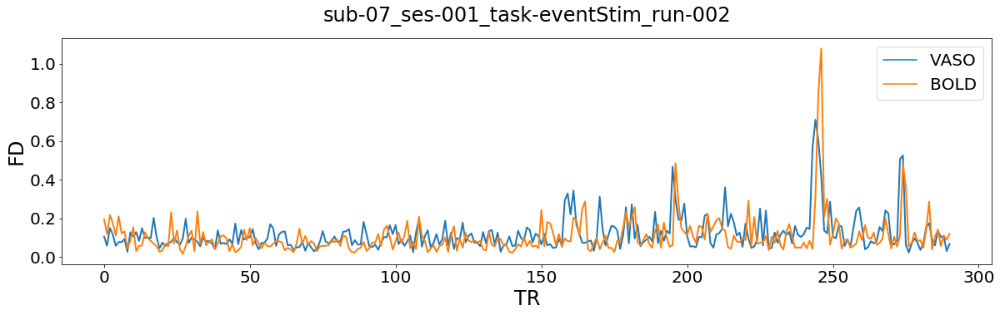

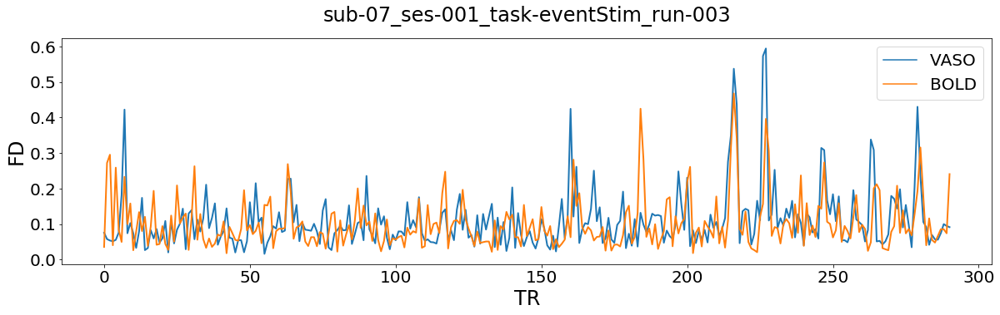

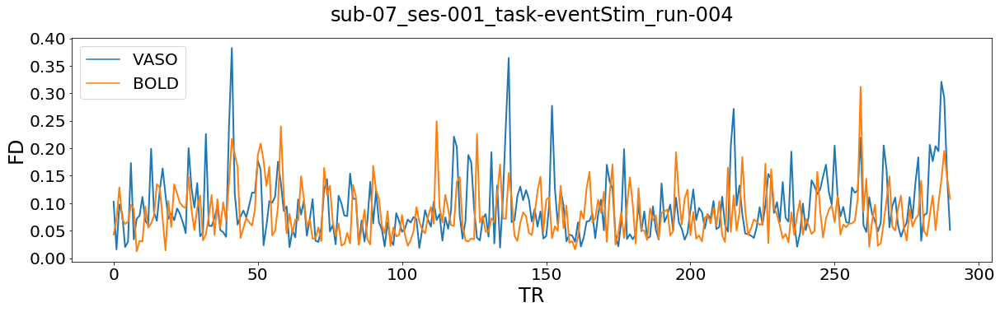

sub-08


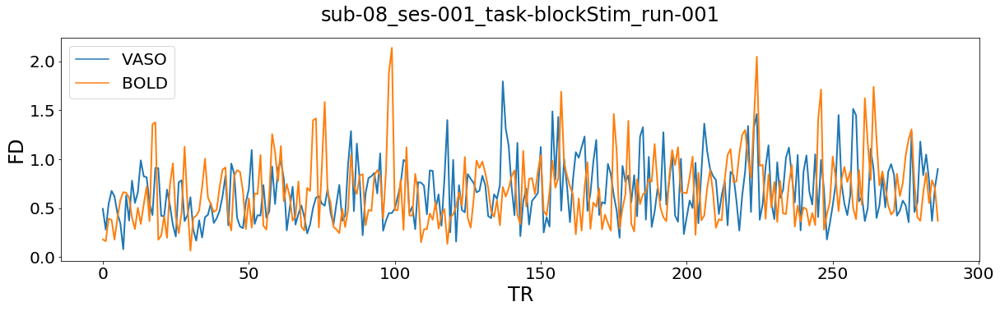

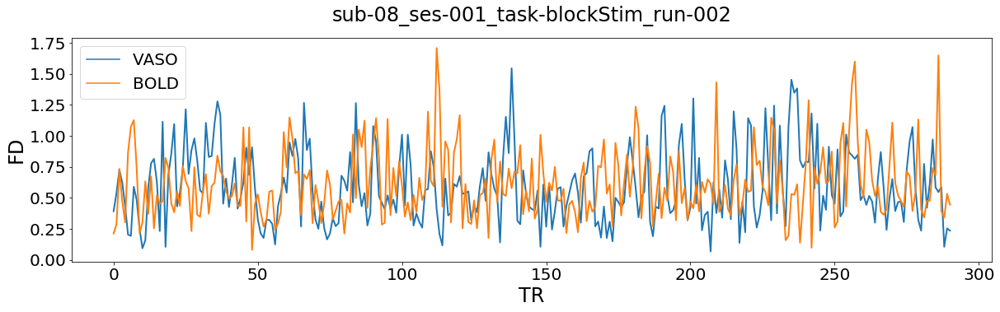

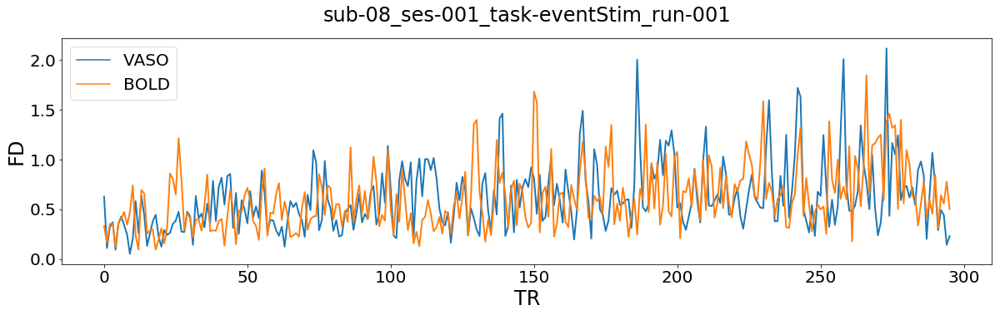

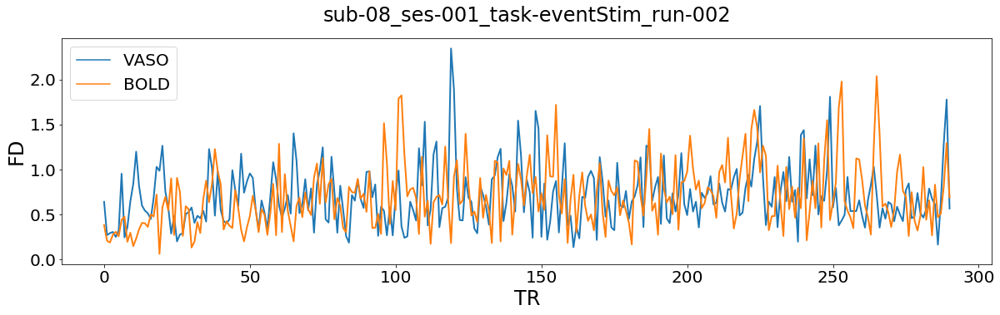

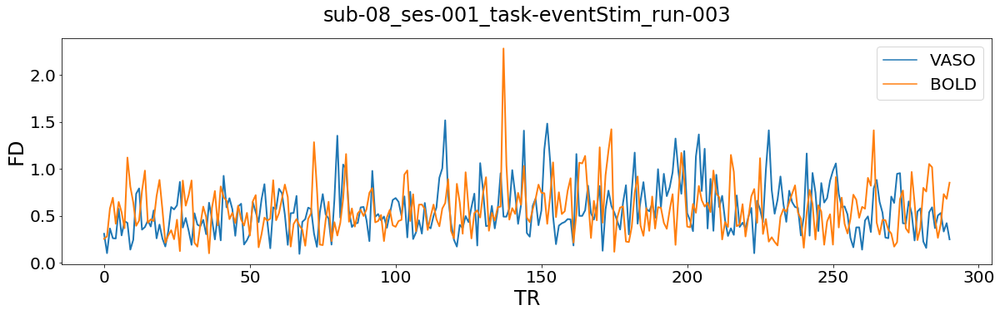

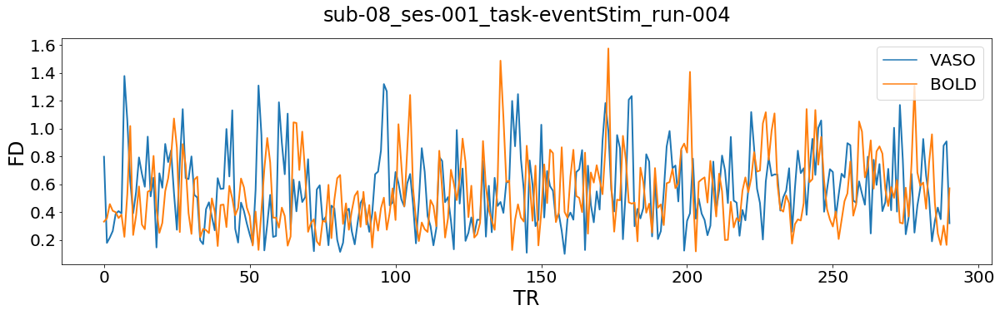

sub-09


FileNotFoundError: [Errno 2] File b'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-09/ses-001/v1Focus/motionParameters/sub-09_FDs.csv' does not exist: b'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-09/ses-001/v1Focus/motionParameters/sub-09_FDs.csv'

In [75]:
subs = ['sub-05', 'sub-06', 'sub-07','sub-08','sub-09', 'sub-10']
# subs = ['sub-05']
tr=1.3088939024390243*2
root = '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives'
focus = ['s1Focus', 'v1Focus']

for sub in subs:
    print(sub)

    runs = sorted(glob.glob(f'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/{sub}/*/func/{sub}_*_task-*-00*_cbv.nii.gz'))

    
    for run in runs:

        base = os.path.basename(run).rsplit('.', 2)[0][:-4]
        
        if 'ses-001' in base:
            ses='ses-001'
            
        if 'ses-002' in base:
            ses='ses-002'
        

        
        if 'Random' in base:
            continue
                
                
        events = pd.read_csv(f'{root}/{sub}/{ses}/events/{base}.txt', sep = ' ', names = ['start','duration','trialType'])[:-1]

    
        for focus in ['v1Focus']:

            data = pd.read_csv(f'{root}/{sub}/{ses}/{focus}/motionParameters/{sub}_FDs.csv')



            FDs = data.loc[data['run']==base]

            fix = plt.figure(figsize=(20,5))
            sns.lineplot(data=FDs, x='volume', y='FD',hue='modality',linewidth = 2)


#             for i, row in events.iterrows():



#                 onset = round(row['start']/tr)
#                 # Do the same for the offset
#                 offset = round(onset + row['duration']/tr)

#                 tmp = FDs.loc[(FDs['volume']>=(onset-2))&(FDs['volume']<=(offset+2))]

#                 if (tmp['FD']>=2).any():

#                     plt.axvspan(onset, (offset), color='red', alpha=0.2, lw=0)

#                 if not (tmp['FD']>=2).any():

#                     plt.axvspan(onset, (offset), color='green', alpha=0.2, lw=0)

            plt.ylabel('FD', fontsize=24)
            plt.xlabel('TR', fontsize=24)
            plt.title(f"{base}", fontsize=24, pad=20)
            plt.legend(fontsize=20)


            plt.xticks(fontsize=20)
            plt.yticks(fontsize=20)
            plt.savefig(f'{root}/{sub}/{ses}/{focus}/motionParameters/{base}_FDs_noBars.png')
            plt.show()

### 4.x create mean T1w image

In [190]:
import ants
import glob
import nibabel as nb
import numpy as np

subs = ['sub-05', 'sub-06', 'sub-07', 'sub-10']

for sub in subs:
    print(sub)
    for focus in ['v1Focus', 's1Focus']:
        print(focus)

        outFolder = f'{root}/{sub}/ses-001/{focus}'

        imgs = sorted(glob.glob(f'{outFolder}/{sub}_ses-0*T1w.nii'))

        imgDims = nb.load(imgs[0]).get_fdata().shape
        newImage = np.zeros(imgDims)


        for img in imgs:
            img2 = nb.load(img).get_fdata()
            newImage = np.add(newImage, img2)


        newImage = np.divide(newImage, len(imgs))
        ni_img = nb.Nifti1Image(newImage, nb.load(imgs[0]).affine)
        nb.save(ni_img, outFolder+ f'/{sub}_ses-001_T1w_average.nii')


sub-05
v1Focus
s1Focus
sub-06
v1Focus
s1Focus
sub-07
v1Focus
s1Focus
sub-10
v1Focus
s1Focus


### 4.2 Register runs to mean T1w

In [226]:
%%bash



# for sub in 05 06 07 08
for sub in 10
do
for focus in v1

do
echo ""
echo ""
echo ""
echo ""
echo 'processing sub-'$sub''

# mkdir '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-'$sub'/ses-001/'$focus'Focus/'
cd '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-'$sub'/ses-001/'$focus'Focus/'

declare -a runs=('/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-'$sub'/ses-001/func/*.nii.gz')
#echo $runs

#echo 'Found '${#runs[@]}' run(s) for sub-'$sub''

for run in $runs
do

# define basename for output files
base=`basename $run _cbv.nii.gz`
echo 'processing run '$base''





antsRegistration \
--verbose 1 \
--dimensionality 3  \
--float 0  \
--collapse-output-transforms 1  \
--interpolation BSpline[5] \
--output [${base}_registered1_,${base}_registered1_Warped.nii,1]  \
--use-histogram-matching 0  \
--winsorize-image-intensities [0.005,0.995]  \
--initial-moving-transform /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-10/ses-001/v1Focus/initial_matrix.txt \
--transform SyN[0.1,3,0]  \
--metric MI['/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-10/ses-001/v1Focus/sub-10_ses-001_T1w_average.nii', '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-10/ses-001/v1Focus/'${base}'_T1w.nii',1,2]  \
--convergence [60x10,1e-6,10]  \
--shrink-factors 2x1  \
--smoothing-sigmas 1x0vox  \




done
done
done





processing sub-10
processing run sub-10_ses-001_task-blockStim_run-001
All_Command_lines_OK
Using double precision for computations.
The composite transform comprises the following transforms (in order): 
  1. /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-10/ses-001/v1Focus/initial_matrix.txt (type = MatrixOffsetTransformBase)
  number of levels = 2
  fixed image: /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-10/ses-001/v1Focus/sub-10_ses-001_T1w_average.nii
  moving image: /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-10/ses-001/v1Focus/sub-10_ses-001_task-blockStim_run-001_T1w.nii
Dimension = 3
Number of stages = 1
Use Histogram Matching false
Winsorize image intensities true
Lower quantile = 0.005
Upper quantile = 0.995
Stage 1 State
   Image metric = Mattes
     Fixed image = Image (0x559e3179bf00)
  RTTI typeinfo:   itk::Image<double, 3u>
  Reference Count: 2
  Modified Time: 1269
  Debug: Off
  Object 

In [237]:
for sub in ['sub-10']:
    print(sub)

    runs = sorted(glob.glob(f'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/{sub}/ses-001/func/{sub}_ses-001_task-*-00*_cbv.nii.gz'))

    for run in runs:

        base = os.path.basename(run).rsplit('.', 2)[0][:-4]
        print(base)
        
        fixed = ants.image_read(f'{root}/{sub}/ses-001/v1Focus/{sub}_ses-001_T1w_average.nii')
        moving = ants.image_read(f'{root}/{sub}/ses-001/v1Focus/{base}_T1w.nii')
        
        test = ants.registration(fixed, moving, type_of_transform='SyN', initial_transform=None, 
                                 outprefix='', mask=None, grad_step=0.2, flow_sigma=3, total_sigma=0, 
                                 aff_metric='mattes', aff_sampling=32, syn_metric='mattes', 
                                 syn_sampling=32, reg_iterations=(40, 20, 0), verbose=False)
        
        test1 = scipy.io.loadmat('/tmp/tmpohoczajt0GenericAffine.mat')
        print(test1)

sub-10
sub-10_ses-001_task-blockStim_run-001
{'AffineTransform_float_3_3': array([[ 9.9863964e-01],
       [ 3.6779784e-03],
       [ 3.1220459e-03],
       [-3.8591676e-04],
       [ 9.6890074e-01],
       [-1.8794866e-02],
       [-1.5148676e-03],
       [-1.8655395e-02],
       [ 9.6427977e-01],
       [ 1.3828743e-01],
       [ 1.9890863e-01],
       [ 4.9293184e-01]], dtype=float32), 'fixed': array([[ 0.9443596],
       [45.471973 ],
       [-5.758053 ]], dtype=float32)}
sub-10_ses-001_task-blockStim_run-002
{'AffineTransform_float_3_3': array([[ 9.9863964e-01],
       [ 3.6779784e-03],
       [ 3.1220459e-03],
       [-3.8591676e-04],
       [ 9.6890074e-01],
       [-1.8794866e-02],
       [-1.5148676e-03],
       [-1.8655395e-02],
       [ 9.6427977e-01],
       [ 1.3828743e-01],
       [ 1.9890863e-01],
       [ 4.9293184e-01]], dtype=float32), 'fixed': array([[ 0.9443596],
       [45.471973 ],
       [-5.758053 ]], dtype=float32)}
sub-10_ses-001_task-eventStimRandom_run-001
{

In [233]:
test

{'warpedmovout': ANTsImage (RIA)
 	 Pixel Type : float (float32)
 	 Components : 1
 	 Dimensions : (150, 50, 16)
 	 Spacing    : (0.875, 0.875, 0.88)
 	 Origin     : (-62.8361, 57.007, -27.8194)
 	 Direction  : [ 1.      0.      0.      0.     -0.6997  0.7145  0.      0.7145  0.6997],
 'warpedfixout': ANTsImage (RIA)
 	 Pixel Type : float (float32)
 	 Components : 1
 	 Dimensions : (150, 50, 16)
 	 Spacing    : (0.875, 0.875, 0.88)
 	 Origin     : (-62.8361, 57.007, -27.8194)
 	 Direction  : [ 1.      0.      0.      0.     -0.6997  0.7145  0.      0.7145  0.6997],
 'fwdtransforms': ['/tmp/tmpohoczajt1Warp.nii.gz',
  '/tmp/tmpohoczajt0GenericAffine.mat'],
 'invtransforms': ['/tmp/tmpohoczajt0GenericAffine.mat',
  '/tmp/tmpohoczajt1InverseWarp.nii.gz']}

In [235]:
test1 = scipy.io.loadmat('/tmp/tmpohoczajt0GenericAffine.mat')

In [236]:
test1

{'AffineTransform_float_3_3': array([[ 9.9863964e-01],
        [ 3.6779784e-03],
        [ 3.1220459e-03],
        [-3.8591676e-04],
        [ 9.6890074e-01],
        [-1.8794866e-02],
        [-1.5148676e-03],
        [-1.8655395e-02],
        [ 9.6427977e-01],
        [ 1.3828743e-01],
        [ 1.9890863e-01],
        [ 4.9293184e-01]], dtype=float32), 'fixed': array([[ 0.9443596],
        [45.471973 ],
        [-5.758053 ]], dtype=float32)}

In [ ]:
ants.registration(fixed, moving, type_of_transform='SyN', initial_transform=None, outprefix='', mask=None, grad_step=0.2, flow_sigma=3, total_sigma=0, aff_metric='mattes', aff_sampling=32, syn_metric='mattes', syn_sampling=32, reg_iterations=(40, 20, 0), verbose=False, **kwargs)[source]

In [ ]:
{root}/{sub}/ses-001/v1Focus/{sub}_ses-001_T1w_average.nii

### 4.x multiply matrices

In [229]:
import scipy

test = scipy.io.loadmat('/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-10/ses-001/v1Focus/sub-10_ses-001_task-eventStimRandom_run-002_registered1_0GenericAffine.mat')
test2 = scipy.io.loadmat('/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-10/ses-001/v1Focus/sub-10_ses-001_task-eventStim_run-001_registered1_0GenericAffine.mat')

In [230]:
test['AffineTransform_double_3_3'] == test2['AffineTransform_double_3_3']

array([[ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True],
       [ True]])

In [223]:
test2

{'AffineTransform_double_3_3': array([[ 1.00990889e+00],
        [-1.52039915e-01],
        [-2.12249636e-02],
        [ 1.53423543e-01],
        [ 9.70467702e-01],
        [ 1.81118821e-01],
        [-9.58326984e-03],
        [-2.01211387e-01],
        [ 9.99680210e-01],
        [-4.02137483e+00],
        [ 2.23915722e+01],
        [-7.12942191e+00]]), 'fixed': array([[0.],
        [0.],
        [0.]])}

### 4.2 Truncate data to upper and lower parts

In [7]:
%%bash

# for sub in 05 06 07 08

for sub in 10
do
echo ""
echo ""
echo ""
echo ""
echo 'processing sub-'$sub''

cd /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-$sub/ses-001/v1Focus/



declare -a runs=('/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-'$sub'/ses-001/func/*.nii.gz')
echo $runs

echo 'Found '${#runs[@]}' run(s) for sub-'$sub''

for run in $runs
do
echo 'processing run '$run''

# define basename for output files
base=`basename $run _cbv.nii.gz`

fslroi ${base}_moco_nulled.nii ${base}_moco_nulled_trunc.nii.gz 0 150 0 50 0 16
fslroi ${base}_moco_notnulled.nii ${base}_moco_notnulled_trunc.nii.gz 0 150 0 50 0 16

done
done

# for sub in 05 06 07 08
# for sub in 05 06 07
for sub in 10
do
echo ""
echo ""
echo ""
echo ""
echo 'processing sub-'$sub''

cd /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-$sub/ses-001/s1Focus/


declare -a runs=('/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-'$sub'/ses-001/func/*.nii.gz')
echo $runs

echo 'Found '${#runs[@]}' run(s) for sub-'$sub''

for run in $runs
do
echo 'processing run '$run''

# define basename for output files
base=`basename $run _cbv.nii.gz`

fslroi ${base}_moco_nulled.nii ${base}_moco_nulled_trunc.nii.gz 0 150 80 70 0 16
fslroi ${base}_moco_notnulled.nii ${base}_moco_notnulled_trunc.nii.gz 0 150 80 70 0 16

done
done






processing sub-10
/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-10/ses-001/func/sub-10_ses-001_task-blockStim_run-001_cbv.nii.gz /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-10/ses-001/func/sub-10_ses-001_task-blockStim_run-002_cbv.nii.gz /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-10/ses-001/func/sub-10_ses-001_task-eventStimRandom_run-001_cbv.nii.gz /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-10/ses-001/func/sub-10_ses-001_task-eventStimRandom_run-002_cbv.nii.gz /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-10/ses-001/func/sub-10_ses-001_task-eventStim_run-001_cbv.nii.gz /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-10/ses-001/func/sub-10_ses-001_task-eventStim_run-002_cbv.nii.gz /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-10/ses-001/func/sub-10_ses-001_task-eventStim_run-003_cbv.nii.gz
Found 1 run(s) for sub-10
processing run /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/su

### 4.3 Do BOCO on both parts

In [112]:
%%bash


# for sub in 05 06 07
for sub in 09
do
# for focus in v1 s1
for focus in v1
do

echo ""
echo ""
echo ""
echo ""
echo 'processing sub-'$sub''

cd '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-'$sub'/ses-001/'$focus'Focus/'

declare -a runs=('/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-'$sub'/ses-001/func/*.nii.gz')
echo $runs

echo 'Found '${#runs[@]}' run(s) for sub-'$sub''

for run in $runs
do
echo 'processing run '$run''

# define basename for output files
base=`basename $run _cbv.nii.gz`


##################################################
#### Temporal upsampling so VASO matches BOLD ####
##################################################

# echo "temporal upsampling and shifting happens now"
# 3dUpsample -overwrite  -datum short -prefix ${base}_Nulled_intemp.nii -n 2 -input ${base}_moco_nulled_trunc.nii.gz
# 3dUpsample -overwrite  -datum short -prefix ${base}_BOLD_intemp.nii   -n 2 -input ${base}_moco_notnulled_trunc.nii.gz

# ##for Magentom clasical VASO sequence
# NumVol=`3dinfo -nv ${base}_Nulled_intemp.nii`
# 3dTcat -overwrite -prefix ${base}_Nulled_intemp.nii ${base}_Nulled_intemp.nii'[0]' ${base}_Nulled_intemp.nii'[0..'`expr $NumVol - 2`']'

# echo "I am correcting for the proper TR in the header"
# 3drefit -TR 1.3088939024390243 ${base}_BOLD_intemp.nii
# 3drefit -TR 1.3088939024390243 ${base}_Nulled_intemp.nii

# # echo "I am correcting for the proper TR in the header"
# # 3drefit -TR 1.8088995169082127 'sub-09_ses-001_task-blockStimLongTR_run-001_BOLD_intemp.nii'
# # 3drefit -TR 1.8088995169082127 'sub-09_ses-001_task-blockStimLongTR_run-001_Nulled_intemp.nii'

# # 3drefit -TR 1.8088995169082127 'sub-09_ses-001_task-blockStimLongTR_run-002_BOLD_intemp.nii'
# # 3drefit -TR 1.8088995169082127 'sub-09_ses-001_task-blockStimLongTR_run-002_Nulled_intemp.nii'


# echo "BOLD correction happens now"
# LN_BOCO -Nulled ${base}_Nulled_intemp.nii -BOLD ${base}_BOLD_intemp.nii -output ${base}

# echo "calculating Mean and tSNR maps"
# 3dTstat -mean -prefix ${base}_mean_nulled.nii ${base}_moco_nulled_trunc.nii.gz -overwrite
# 3dTstat -mean -prefix ${base}_mean_notnulled.nii ${base}_moco_notnulled_trunc.nii.gz -overwrite


# echo "calculating T1 in EPI space"
# 3dTcat -prefix combined.nii  ${base}_moco_nulled_trunc.nii.gz ${base}_moco_notnulled_trunc.nii.gz -overwrite
# 3dTstat -cvarinv -overwrite  -prefix ${base}_T1w.nii combined.nii
# rm combined.nii

# echo "curtosis and skew"
# LN_SKEW -input ${base}_BOLD_intemp.nii
# LN_SKEW -input ${base}_VASO_LN.nii


# fslmaths ${base}_VASO_LN.nii -mul 100 ${base}_VASO.nii.gz -odt short
fslmaths ${base}_BOLD_intemp.nii -mul 1 ${base}_BOLD.nii.gz -odt short


done
done
done





processing sub-09
/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-09/ses-001/func/sub-09_ses-001_task-blockStimLongTR_run-001_cbv.nii.gz /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-09/ses-001/func/sub-09_ses-001_task-blockStimLongTR_run-002_cbv.nii.gz /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-09/ses-001/func/sub-09_ses-001_task-blockStim_run-001_cbv.nii.gz /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-09/ses-001/func/sub-09_ses-001_task-blockStim_run-002_cbv.nii.gz /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-09/ses-001/func/sub-09_ses-001_task-blockStimVisOnly_run-001_cbv.nii.gz /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-09/ses-001/func/sub-09_ses-001_task-blockStimVisOnly_run-002_cbv.nii.gz
Found 1 run(s) for sub-09
processing run /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-09/ses-001/func/sub-09_ses-001_task-blockStimLongTR_run-001_cbv.nii.gz
processing run /media/sebastian/Data/

### 4.4 Average eventStim runs

For the subjects for which we acquired 4 eventStim runs, we can average the A and B runs respectively. For this, we need to make the number of volumes equal.

In [130]:
root

'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti'

In [134]:
# for sub in subs[-1:]:
for focus in ['v1', 's1']:
    for sub in ['sub-09']:
        print(sub)
        for task in ['blockStimVisOnly', 'blockStim', 'blockStimLongTR']:

            runs = sorted(glob.glob(f'{root}/{sub}/ses-001/func/{sub}_ses-001_task-{task}_run-00*_cbv.nii.gz'))

            minVols = 1000

            for run in runs:
                base = os.path.basename(run).rsplit('.', 2)[0][:-4]
                print(base)

                data = nb.load(f'{root}/derivatives/{sub}/ses-001/{focus}Focus/{base}_moco_nulled_trunc.nii.gz').get_fdata()

                if data.shape[-1] < minVols:
                    minVols = data.shape[-1]


            for modality in ['nulled', 'notnulled']:

                data1 = nb.load(f'{root}/derivatives/{sub}/ses-001/{focus}Focus/{sub}_ses-001_task-{task}_run-001_moco_{modality}_trunc.nii.gz').get_fdata()
                data2= nb.load(f'{root}/derivatives/{sub}/ses-001/{focus}Focus/{sub}_ses-001_task-{task}_run-002_moco_{modality}_trunc.nii.gz').get_fdata()
                header = nb.load(f'{root}/derivatives/{sub}/ses-001/{focus}Focus/{sub}_ses-001_task-{task}_run-001_moco_{modality}_trunc.nii.gz')



                data1time = data1[:,:,:,:minVols-4]
                data2time = data2[:,:,:,:minVols-4]
                avg = ((data2time+data1time)/2)

                new_img = nb.Nifti1Image(avg, header.affine, header.header)
                new_img.to_filename(f'{root}/derivatives/{sub}/ses-001/{focus}Focus/{sub}_ses-001_task-{task}_run-avg_moco_{modality}_trunc.nii.gz')

sub-09
sub-09_ses-001_task-blockStimVisOnly_run-001
sub-09_ses-001_task-blockStimVisOnly_run-002
sub-09_ses-001_task-blockStim_run-001
sub-09_ses-001_task-blockStim_run-002
sub-09_ses-001_task-blockStimLongTR_run-001
sub-09_ses-001_task-blockStimLongTR_run-002
sub-09
sub-09_ses-001_task-blockStimVisOnly_run-001
sub-09_ses-001_task-blockStimVisOnly_run-002
sub-09_ses-001_task-blockStim_run-001
sub-09_ses-001_task-blockStim_run-002
sub-09_ses-001_task-blockStimLongTR_run-001
sub-09_ses-001_task-blockStimLongTR_run-002


In [ ]:
for sub in subs[-1:]:
    print(sub)
    runs = sorted(glob.glob(f'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/{sub}/ses-001/func/{sub}_ses-001_task-event*_run-00*_cbv.nii.gz'))
    if len(runs) < 3:
        continue
    for focus in ['v1', 's1']:
        for combination in ['13', '24']:
            os.system(f'mkdir -p {root}/{sub}/ses-001/{focus}Focus/avg{combination}')

            for imageType in ['nulled', 'notnulled']:
                data1 = nb.load(f'{root}/{sub}/ses-001/{focus}Focus/{sub}_ses-001_task-eventStim_run-00{combination[0]}_moco_{imageType}_trunc.nii.gz').get_fdata()
                data2 = nb.load(f'{root}/{sub}/ses-001/{focus}Focus/{sub}_ses-001_task-eventStim_run-00{combination[1]}_moco_{imageType}_trunc.nii.gz').get_fdata()
                header = nb.load(f'{root}/{sub}/ses-001/{focus}Focus/{sub}_ses-001_task-eventStim_run-00{combination[0]}_moco_{imageType}_trunc.nii.gz')
                if data1.shape[-1] < data2.shape[-1]:
                    minTimePoints = data1.shape[-1]
                else:
                    minTimePoints = data2.shape[-1]


                data1time = data1[:,:,:,:minTimePoints]
                data2time = data2[:,:,:,:minTimePoints]
                avg = ((data2time+data1time)/2)

                new_img = nb.Nifti1Image(avg, header.affine, header.header)
                new_img.to_filename(f'{root}/{sub}/ses-001/{focus}Focus/avg{combination}/moco_{imageType}_trunc.nii.gz')

### 4.5 Run BOCO on averaged eventStim runs

In [150]:
%%bash


# for sub in 06 07
for sub in 09
do
for focus in v1 s1
do

echo ""
echo ""
echo ""
echo ""
echo 'processing sub-sub-'$sub''

for task in blockStimVisOnly blockStim
do

cd '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-'$sub'/ses-001/'$focus'Focus/'

##################################################
#### Temporal upsampling so VASO matches BOLD ####
##################################################



echo "temporal upsampling and shifting happens now"
3dUpsample -overwrite  -datum short -prefix 'sub-'$sub'_ses-001_task-'$task'_run-avg_Nulled_intemp.nii.gz' -n 2 -input 'sub-'$sub'_ses-001_task-'$task'_run-avg_moco_nulled_trunc.nii.gz'
3dUpsample -overwrite  -datum short -prefix 'sub-'$sub'_ses-001_task-'$task'_run-avg_BOLD_intemp.nii.gz'   -n 2 -input 'sub-'$sub'_ses-001_task-'$task'_run-avg_moco_notnulled_trunc.nii.gz'

# ##for Magentom clasical VASO sequence
NumVol=`3dinfo -nv 'sub-'$sub'_ses-001_task-'$task'_run-avg_Nulled_intemp.nii.gz'`
3dTcat -overwrite -prefix 'sub-'$sub'_ses-001_task-'$task'_run-avg_Nulled_intemp.nii.gz' 'sub-'$sub'_ses-001_task-'$task'_run-avg_Nulled_intemp.nii.gz''[0]' 'sub-'$sub'_ses-001_task-'$task'_run-avg_Nulled_intemp.nii.gz''[0..'`expr $NumVol - 2`']'

echo "I am correcting for the proper TR in the header"
3drefit -TR 1.3088939024390243 'sub-'$sub'_ses-001_task-'$task'_run-avg_BOLD_intemp.nii.gz'
3drefit -TR 1.3088939024390243 'sub-'$sub'_ses-001_task-'$task'_run-avg_Nulled_intemp.nii.gz'

echo "BOLD correction happens now"
LN_BOCO -Nulled 'sub-'$sub'_ses-001_task-'$task'_run-avg_Nulled_intemp.nii.gz' -BOLD 'sub-'$sub'_ses-001_task-'$task'_run-avg_BOLD_intemp.nii.gz'

# nii "calculating Mean and tSNR maps"
# 3dTstat -mean -prefix mean_nulled.nii.gz moco_nulled.nii.gz -overwrite
# 3dTstat -mean -prefix mean_notnulled.nii.gz moco_notnulled.nii.gz -overwrite
# 3dTstat  -overwrite -mean  -prefix BOLD.Mean.nii.gz BOLD_intemp.nii.gz'[1..$]'
# 3dTstat  -overwrite -cvarinv  -prefix BOLD.tSNR.nii.gz BOLD_intemp.nii.gz'[1..$]'
# 3dTstat  -overwrite -mean  -prefix VASO.Mean.nii.gz VASO_LN.nii.gz'[1..$]'
# 3dTstat  -overwrite -cvarinv -prefix VASO.tSNR.nii.gz VASO_LN.nii.gz'[1..$]'

echo "calculating T1 in EPI space"
3dTcat -prefix combined.nii.gz  'sub-'$sub'_ses-001_task-'$task'_run-avg_moco_nulled_trunc.nii.gz' 'sub-'$sub'_ses-001_task-'$task'_run-avg_moco_notnulled_trunc.nii.gz' -overwrite
3dTstat -cvarinv -overwrite  -prefix 'sub-'$sub'_ses-001_task-'$task'_run-avg_T1w.nii.gz' combined.nii.gz
rm combined.nii.gz
#3dcalc -a mean_nulled.nii.gz -b mean_notnulled.nii.gz -expr 'abs(b-a)/(a+b)' -prefix T1w.nii.gz -overwrite

echo "curtosis and skew"
#LN_SKEW -timeseries BOLD.nii.gz
#LN_SKEW -timeseries VASO_LN.nii.gz


fslmaths 'sub-'$sub'_ses-001_task-'$task'_run-avg_VASO_LN.nii' -mul 100 'sub-'$sub'_ses-001_task-'$task'_run-avg_VASO.nii.gz' -odt short

done

for task in blockStimLongTR
do

cd '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-'$sub'/ses-001/'$focus'Focus/'

##################################################
#### Temporal upsampling so VASO matches BOLD ####
##################################################



# echo "temporal upsampling and shifting happens now"
# 3dUpsample -overwrite  -datum short -prefix 'sub-'$sub'_ses-001_task-'$task'_run-avg_Nulled_intemp.nii.gz' -n 2 -input 'sub-'$sub'_ses-001_task-'$task'_run-avg_moco_nulled_trunc.nii.gz'
# 3dUpsample -overwrite  -datum short -prefix 'sub-'$sub'_ses-001_task-'$task'_run-avg_BOLD_intemp.nii.gz'   -n 2 -input 'sub-'$sub'_ses-001_task-'$task'_run-avg_moco_notnulled_trunc.nii.gz'

##for Magentom clasical VASO sequence
NumVol=`3dinfo -nv 'sub-'$sub'_ses-001_task-'$task'_run-avg_Nulled_intemp.nii.gz'`
3dTcat -overwrite -prefix 'sub-'$sub'_ses-001_task-'$task'_run-avg_Nulled_intemp.nii.gz' 'sub-'$sub'_ses-001_task-'$task'_run-avg_Nulled_intemp.nii.gz''[0]' 'sub-'$sub'_ses-001_task-'$task'_run-avg_Nulled_intemp.nii.gz''[0..'`expr $NumVol - 2`']'

# echo "I am correcting for the proper TR in the header"
3drefit -TR 1.8088995169082127 'sub-09_ses-001_task-'$task'_run-avg_BOLD_intemp.nii.gz'
3drefit -TR 1.8088995169082127 'sub-09_ses-001_task-'$task'_run-avg_Nulled_intemp.nii.gz'

echo "BOLD correction happens now"
LN_BOCO -Nulled 'sub-'$sub'_ses-001_task-'$task'_run-avg_Nulled_intemp.nii.gz' -BOLD 'sub-'$sub'_ses-001_task-'$task'_run-avg_BOLD_intemp.nii.gz' -output 'sub-'$sub'_ses-001_task-'$task'_run-avg'

# echo "calculating Mean and tSNR maps"
# 3dTstat -mean -prefix mean_nulled.nii.gz moco_nulled.nii.gz -overwrite
# 3dTstat -mean -prefix mean_notnulled.nii.gz moco_notnulled.nii.gz -overwrite
# 3dTstat  -overwrite -mean  -prefix BOLD.Mean.nii.gz BOLD_intemp.nii.gz'[1..$]'
# 3dTstat  -overwrite -cvarinv  -prefix BOLD.tSNR.nii.gz BOLD_intemp.nii.gz'[1..$]'
# 3dTstat  -overwrite -mean  -prefix VASO.Mean.nii.gz VASO_LN.nii.gz'[1..$]'
# 3dTstat  -overwrite -cvarinv -prefix VASO.tSNR.nii.gz VASO_LN.nii.gz'[1..$]'

echo "calculating T1 in EPI space"
3dTcat -prefix combined.nii.gz  'sub-'$sub'_ses-001_task-'$task'_run-avg_moco_nulled_trunc.nii.gz' 'sub-'$sub'_ses-001_task-'$task'_run-avg_moco_notnulled_trunc.nii.gz' -overwrite
3dTstat -cvarinv -overwrite  -prefix 'sub-'$sub'_ses-001_task-'$task'_run-avg_T1w.nii.gz' combined.nii.gz
rm combined.nii.gz
#3dcalc -a mean_nulled.nii.gz -b mean_notnulled.nii.gz -expr 'abs(b-a)/(a+b)' -prefix T1w.nii.gz -overwrite

echo "curtosis and skew"
#LN_SKEW -timeseries BOLD.nii.gz
#LN_SKEW -timeseries VASO_LN.nii.gz


fslmaths 'sub-'$sub'_ses-001_task-'$task'_run-avg_VASO_LN.nii' -mul 100 'sub-'$sub'_ses-001_task-'$task'_run-avg_VASO.nii.gz' -odt short



done

done
done






processing sub-sub-09
temporal upsampling and shifting happens now
I am correcting for the proper TR in the header
BOLD correction happens now
LAYNII v2.0.0          
Compiled for Linux 64  
LN_BOCO

    File name: sub-09_ses-001_task-blockStimVisOnly_run-avg_Nulled_intemp.nii.gz
    Image details: 150 X | 50 Y | 16 Z | 572 T 
    Voxel size = 0.875 x 0.875 x 0.88
    Datatype = 4

    File name: sub-09_ses-001_task-blockStimVisOnly_run-avg_BOLD_intemp.nii.gz
    Image details: 150 X | 50 Y | 16 Z | 572 T 
    Voxel size = 0.875 x 0.875 x 0.88
    Datatype = 4

    !!!Warning!!! Input nifti header contains scl_scale=0.
    Make sure to check the resulting output image.

    Writing output as:
      VASO_LN
  Finished.
calculating T1 in EPI space
curtosis and skew
temporal upsampling and shifting happens now
I am correcting for the proper TR in the header
BOLD correction happens now
LAYNII v2.0.0          
Compiled for Linux 64  
LN_BOCO

    File name: sub-09_ses-001_task-blockStim

++ 3dUpsample: AFNI version=AFNI_21.1.07 (May 11 2021) [64-bit]
++ Authored by: RWCox
*+ WARNING:   If you are performing spatial transformations on an oblique dset,
  such as /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-09/ses-001/v1Focus/sub-09_ses-001_task-blockStimVisOnly_run-avg_moco_nulled_trunc.nii.gz,
  or viewing/combining it with volumes of differing obliquity,
  you should consider running: 
     3dWarp -deoblique 
  on this and  other oblique datasets in the same session.
 See 3dWarp -help for details.
++ Oblique dataset:/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-09/ses-001/v1Focus/sub-09_ses-001_task-blockStimVisOnly_run-avg_moco_nulled_trunc.nii.gz is 42.900002 degrees from plumb.
++ 3dUpsample: AFNI version=AFNI_21.1.07 (May 11 2021) [64-bit]
++ Authored by: RWCox
*+ WARNING:   If you are performing spatial transformations on an oblique dset,
  such as /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives

In [ ]:
%%bash


# for sub in 06 07
for sub in 08
do
for focus in v1 s1
do

echo ""
echo ""
echo ""
echo ""
echo 'processing sub-'$sub''

for combination in 13 24
do

cd '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-'$sub'/ses-001/'$focus'Focus/avg'$combination''

##################################################
#### Temporal upsampling so VASO matches BOLD ####
##################################################

echo "temporal upsampling and shifting happens now"
3dUpsample -overwrite  -datum short -prefix Nulled_intemp.nii.gz -n 2 -input moco_nulled_trunc.nii.gz
3dUpsample -overwrite  -datum short -prefix BOLD_intemp.nii.gz   -n 2 -input moco_notnulled_trunc.nii.gz

##for Magentom clasical VASO sequence
NumVol=`3dinfo -nv Nulled_intemp.nii.gz`
3dTcat -overwrite -prefix Nulled_intemp.nii.gz Nulled_intemp.nii.gz'[0]' Nulled_intemp.nii.gz'[0..'`expr $NumVol - 2`']'

echo "I am correcting for the proper TR in the header"
3drefit -TR 1.3088939024390243 BOLD_intemp.nii.gz
3drefit -TR 1.3088939024390243 Nulled_intemp.nii.gz

echo "BOLD correction happens now"
LN_BOCO -Nulled Nulled_intemp.nii.gz -BOLD BOLD_intemp.nii.gz

nii "calculating Mean and tSNR maps"
3dTstat -mean -prefix mean_nulled.nii.gz moco_nulled.nii.gz -overwrite
3dTstat -mean -prefix mean_notnulled.nii.gz moco_notnulled.nii.gz -overwrite
# 3dTstat  -overwrite -mean  -prefix BOLD.Mean.nii.gz BOLD_intemp.nii.gz'[1..$]'
# 3dTstat  -overwrite -cvarinv  -prefix BOLD.tSNR.nii.gz BOLD_intemp.nii.gz'[1..$]'
# 3dTstat  -overwrite -mean  -prefix VASO.Mean.nii.gz VASO_LN.nii.gz'[1..$]'
# 3dTstat  -overwrite -cvarinv -prefix VASO.tSNR.nii.gz VASO_LN.nii.gz'[1..$]'

echo "calculating T1 in EPI space"
3dTcat -prefix combined.nii.gz  moco_nulled_trunc.nii.gz moco_notnulled_trunc.nii.gz -overwrite
3dTstat -cvarinv -overwrite  -prefix T1w.nii.gz combined.nii.gz
rm combined.nii.gz
#3dcalc -a mean_nulled.nii.gz -b mean_notnulled.nii.gz -expr 'abs(b-a)/(a+b)' -prefix T1w.nii.gz -overwrite

echo "curtosis and skew"
#LN_SKEW -timeseries BOLD.nii.gz
#LN_SKEW -timeseries VASO_LN.nii.gz


fslmaths VASO_LN.nii -mul 100 VASO.nii.gz -odt short

done
done
done


## 5 GLM Analysis

### 5.1 Prepare GLM

In [16]:
# Set this to the directory all of the sub### directories live in
root = '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives'
# subs = ['sub-05', 'sub-06', 'sub-07', 'sub-08']
subs = ['sub-10']

# Set this to the directory where you'll dump all the fsf files
# May want to make it a separate directory, because you can delete them all o
#   once Feat runs
fsfDir = f"{root}/designFiles"

modalities = {'BOLD':'1', 'VASO':'-1'}

for sub in subs:
    for modality in modalities:
        print(modality)
        print(modalities[modality])
        runs = sorted(glob.glob(f'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/{sub}/ses-001/func/{sub}_ses-001_task-*_run-00*_cbv.nii.gz'))

        for run in runs:
            
            base = os.path.basename(run).rsplit('.', 2)[0][:-4]
            print(base)
            eventFile = f'{root}/{sub}/ses-001/events/{base}.txt'
            
            

            actualData = f'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/{sub}/ses-001/v1Focus/{base}_{modality}.nii.gz'
            
            runData = nb.load(actualData)
            tr = str(runData.header.get_zooms()[-1])
            
            runData = runData.get_fdata()
            nrVolumes = str(runData.shape[-1])
            print(nrVolumes)

            
            for focus in ['v1', 's1']:
                subFolder = f'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/{sub}/ses-001/{focus}Focus'

                replacements = {'INFILE':f'{subFolder}/{base}_{modality}', 'OUTFOLDER': f'{subFolder}/{base}_{modality}', 'EVENTFILE': eventFile, 'CONTRASTVALUE': modalities[modality], 'NRVOLUMES': nrVolumes, 'meanTR': tr}



                with open(f"{fsfDir}/designTemplate.fsf") as infile:
                    with open(f"{fsfDir}/{base}_{modality}_{focus}Focus.fsf", 'w') as outfile:
                        for line in infile:
                            for src, target in replacements.items():
                                line = line.replace(src, target)
                            outfile.write(line)
  
  

BOLD
1
sub-10_ses-001_task-blockStim_run-001
576
sub-10_ses-001_task-blockStim_run-002
586
sub-10_ses-001_task-eventStimRandom_run-001
166
sub-10_ses-001_task-eventStimRandom_run-002
580
sub-10_ses-001_task-eventStim_run-001
586
sub-10_ses-001_task-eventStim_run-002
582
sub-10_ses-001_task-eventStim_run-003
582
VASO
-1
sub-10_ses-001_task-blockStim_run-001
580
sub-10_ses-001_task-blockStim_run-002
588
sub-10_ses-001_task-eventStimRandom_run-001
168
sub-10_ses-001_task-eventStimRandom_run-002
582
sub-10_ses-001_task-eventStim_run-001
590
sub-10_ses-001_task-eventStim_run-002
584
sub-10_ses-001_task-eventStim_run-003
584


### 5.2 Run first level GLMs

In [17]:
import glob
import os

subs = ['sub-10']

root = '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives'
fsfDir = f"{root}/designFiles"

for sub in subs:
    feats = sorted(glob.glob(f'{fsfDir}/{sub}_*Stim_*.fsf'))
    for feat1, feat2 in zip(feats[::2],feats[1::2]):
        print(f'1: {feat1}')
        print(f'2: {feat2}')
        os.system(f'feat {feat1} & feat {feat2}')

1: /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/designFiles/sub-10_ses-001_task-blockStim_run-001_BOLD_s1Focus.fsf
2: /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/designFiles/sub-10_ses-001_task-blockStim_run-001_BOLD_v1Focus.fsf
1: /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/designFiles/sub-10_ses-001_task-blockStim_run-001_VASO_s1Focus.fsf
2: /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/designFiles/sub-10_ses-001_task-blockStim_run-001_VASO_v1Focus.fsf
1: /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/designFiles/sub-10_ses-001_task-blockStim_run-002_BOLD_s1Focus.fsf
2: /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/designFiles/sub-10_ses-001_task-blockStim_run-002_BOLD_v1Focus.fsf
1: /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/designFiles/sub-10_ses-001_task-blockStim_run-002_VASO_s1Focus.fsf
2: /media/sebastian/Data/EVENTRELATED_PIL

In [161]:
import glob
import os

# subs = ['sub-05', 'sub-08']

root = '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives'
fsfDir = f"{root}/designFiles"

for sub in subs:
    feats = sorted(glob.glob(f'{fsfDir}/{sub}_*event*.fsf'))
    for feat1, feat2 in zip(feats[::2],feats[1::2]):
        print(feat1)
        print(feat2)
#         os.system(f'feat {feat}')

### 5.4 Prepare second level GLMs

In [18]:
featFolders = sorted(glob.glob(f'{root}/*/ses-001/*Focus/*.feat'))
include = []

for folder in featFolders:
    if not os.path.exists(f'{folder}/reg/standard.nii.gz'):
        include.append(folder)

In [ ]:
include = []

for folder in featFolders:
    if not os.path.exists(f'{folder}/reg/standard.nii.gz'):
        include.append(folder)

In [19]:
%%bash -s "{" ".join(include)}" 

for folder in $1
do
cd $folder
mkdir reg
cp $FSLDIR/etc/flirtsch/ident.mat reg/example_func2standard.mat
cp mean_func.nii.gz reg/standard.nii.gz

done

### 5.4 Run second level GLMs

## 6. Prepare layering

### 6.1 Upsample timecourses and statistical maps

In [226]:
%%bash


# for sub in 05 06 07 08 09
for sub in 09
do
echo ""
echo ""
echo ""
echo ""
echo 'processing sub-'$sub''

declare -a runs=('/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-'$sub'/ses-001/func/*blockStim*.nii.gz')
echo $runs

echo 'Found '${#runs[@]}' run(s) for sub-'$sub''

for focus in v1
do

cd '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-'$sub'/ses-001/'$focus'Focus/'

for run in $runs
do
echo 'processing run '$run''

# define basename for output files
base=`basename $run _cbv.nii.gz`


delta_x=$(3dinfo -di ''${base}'_T1w.nii')
delta_y=$(3dinfo -dj ''${base}'_T1w.nii')
delta_z=$(3dinfo -dk ''${base}'_T1w.nii')
sdelta_x=$(echo "((sqrt($delta_x * $delta_x) / 5))"|bc -l)
sdelta_y=$(echo "((sqrt($delta_y * $delta_y) / 5))"|bc -l)
sdelta_z=$(echo "((sqrt($delta_z * $delta_z) / 1))"|bc -l)


# 3dresample -dxyz $sdelta_x $sdelta_y $sdelta_z -rmode Cu -overwrite -prefix ''${base}'_T1w_scaled.nii.gz' -input ''${base}'_T1w.nii'
# 3dresample -dxyz $sdelta_x $sdelta_y $sdelta_z -rmode Cu -overwrite -prefix ''${base}'_VASO.feat/stats/zstat1_scaled.nii.gz' -input ''${base}'_VASO.feat/stats/zstat1.nii.gz'
# 3dresample -dxyz $sdelta_x $sdelta_y $sdelta_z -rmode Cu -overwrite -prefix ''${base}'_BOLD.feat/stats/zstat1_scaled.nii.gz' -input ''${base}'_BOLD.feat/stats/zstat1.nii.gz'


3dresample -dxyz $sdelta_x $sdelta_y $sdelta_z -rmode Cu -overwrite -prefix ''${base}'_BOLD_scaled.nii' -input ''${base}'_BOLD.nii.gz'
# 3dresample -dxyz $sdelta_x $sdelta_y $sdelta_z -rmode Cu -overwrite -prefix ''${base}'_VASO_scaled.nii' -input ''${base}'_VASO.nii.gz'
done
done
done


Process is terminated.


In [ ]:
delta_x=$(3dinfo -di ''${base}'_T1w.nii')
delta_y=$(3dinfo -dj ''${base}'_T1w.nii')
delta_z=$(3dinfo -dk ''${base}'_T1w.nii')
sdelta_x=$(echo "((sqrt($delta_x * $delta_x) / 5))"|bc -l)
sdelta_y=$(echo "((sqrt($delta_y * $delta_y) / 5))"|bc -l)
sdelta_z=$(echo "((sqrt($delta_z * $delta_z) / 1))"|bc -l)


3dresample -dxyz $sdelta_x $sdelta_y $sdelta_z -rmode Cu -overwrite -prefix ''${base}'_T1w_scaled.nii.gz' -input ''${base}'_T1w.nii'
# 3dresample -dxyz $sdelta_x $sdelta_y $sdelta_z -rmode Cu -overwrite -prefix ''${base}'_VASO.feat/stats/zstat1_scaled.nii.gz' -input ''${base}'_VASO.feat/stats/zstat1.nii.gz'
# 3dresample -dxyz $sdelta_x $sdelta_y $sdelta_z -rmode Cu -overwrite -prefix ''${base}'_BOLD.feat/stats/zstat1_scaled.nii.gz' -input ''${base}'_BOLD.feat/stats/zstat1.nii.gz'


3dresample -dxyz $sdelta_x $sdelta_y $sdelta_z -rmode Cu -overwrite -prefix ''${base}'_BOLD_scaled.nii' -input ''${base}'_BOLD.nii'
3dresample -dxyz $sdelta_x $sdelta_y $sdelta_z -rmode Cu -overwrite -prefix ''${base}'_VASO_scaled.nii' -input ''${base}'_VASO.nii.gz'

### 5.3 Draw masks

Based on the GLM results of the blockStim, we can now draw masks. 

### 5.4 Generate Layers

In [274]:
for sub in ['sub-05', 'sub-06', 'sub-07', 'sub-08', 'sub-10']:
    print(sub)
    runs = sorted(glob.glob(f'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/{sub}/ses-001/func/{sub}_ses-001_task-*_run-00*_cbv.nii.gz'))

    for focus in ['v1Focus', 's1Focus']:
        print(focus)
        
        maskFolder = f'{root}/{sub}/ses-001/{focus}/{sub}_masks'

        for run in runs:
            
            base = os.path.basename(run).rsplit('.', 2)[0][:-4]
            print(base)
            
            for nrLayers in [3, 11]:
                os.system(f'LN2_LAYERS -rim {maskFolder}/{base}_rim.nii.gz -nr_layers {nrLayers} -output {maskFolder}/{base}_{nrLayers}layers')
                
                

sub-05
v1Focus
sub-05_ses-001_task-blockStim_run-001
sub-05_ses-001_task-blockStim_run-002
sub-05_ses-001_task-eventStim_run-001
sub-05_ses-001_task-eventStim_run-002
s1Focus
sub-05_ses-001_task-blockStim_run-001
sub-05_ses-001_task-blockStim_run-002
sub-05_ses-001_task-eventStim_run-001
sub-05_ses-001_task-eventStim_run-002
sub-06
v1Focus
sub-06_ses-001_task-blockStim_run-001
sub-06_ses-001_task-blockStim_run-002
sub-06_ses-001_task-eventStim_run-001
sub-06_ses-001_task-eventStim_run-002
sub-06_ses-001_task-eventStim_run-003
sub-06_ses-001_task-eventStim_run-004
s1Focus
sub-06_ses-001_task-blockStim_run-001
sub-06_ses-001_task-blockStim_run-002
sub-06_ses-001_task-eventStim_run-001
sub-06_ses-001_task-eventStim_run-002
sub-06_ses-001_task-eventStim_run-003
sub-06_ses-001_task-eventStim_run-004
sub-07
v1Focus
sub-07_ses-001_task-blockStim_run-001
sub-07_ses-001_task-blockStim_run-002
sub-07_ses-001_task-eventStim_run-001
sub-07_ses-001_task-eventStim_run-002
sub-07_ses-001_task-eventSt

In [14]:
def find_roi_box(array):

    smallestx = 1000
    largestx = 0

    smallesty = 1000
    largesty = 0

    smallestz = 1000
    largestz = 0

    for n in range(array.shape[-1]):
        for i in range(array.shape[-2]):
            indexes = np.nonzero(array[:,i,n])[0]


            if indexes.size != 0:

                if indexes[0] < smallestx:
                    smallestx=indexes[0]
                if indexes[-1] > largestx:
                    largestx=indexes[-1]

                if n < smallestz:
                    smallestz=n
                if n > largestz:
                    largestz=n


        for i in range(array.shape[0]):
            indexes = np.nonzero(array[i,:,n])[0]


            if indexes.size != 0:

                if indexes[0] < smallesty:
                    smallesty=indexes[0]
                if indexes[-1] > largesty:
                    largesty=indexes[-1]

    x_idx_range = slice(smallestx-1, largestx+1)
    y_idx_range = slice(smallesty-1, largesty+1)
    z_idx_range = slice(smallestz-1, largestz+1)

    return (x_idx_range, y_idx_range, z_idx_range)

In [235]:
# for sub in ['sub-05', 'sub-06', 'sub-07', 'sub-08', 'sub-10']:
for sub in ['sub-10']:
    print(sub)
    ses = 'ses-001'
#     if sub == 'sub-09':
#         ses = 'ses-002'
    runs = sorted(glob.glob(f'{root}/{sub}/{ses}/func/{sub}_ses-00*_task-*Random_run-00*_cbv.nii.gz'))

    for focus in ['v1Focus']:
#     for focus in ['v1Focus']:

        print(focus)
        
        maskFolder = f'{root}/derivatives/{sub}/{ses}/{focus}/{sub}_masks'

        for run in runs:
            
            base = os.path.basename(run).rsplit('.', 2)[0][:-4]
            print(base)
            
            
            # find box around mask
            try:
                rimFile = sorted(glob.glob(f'{maskFolder}/{base}_rim*'))[0]
                box = find_roi_box(nb.load(rimFile).get_fdata())
            except:
                print('no rim found')
                continue
                
            for modality in ['BOLD', 'VASO']:
                data = nb.load(f'{root}/derivatives/{sub}/{ses}/{focus}/{base}_{modality}_scaled.nii')
                dataArr = np.asarray(data.dataobj[box[0], box[1], box[2]])
                
                
                ni_img = nb.Nifti1Image(dataArr, data.affine, data.header)
            
                newFile = f'{root}/derivatives/{sub}/{ses}/{focus}/{base}_{modality}_slice.nii'  
        
            
                       
                nb.save(ni_img, newFile)

sub-10
v1Focus
sub-10_ses-001_task-eventStimRandom_run-001
sub-10_ses-001_task-eventStimRandom_run-002


In [346]:
%%bash


# for sub in 05 06 07
for sub in 09
do
# for focus in v1 s1
for focus in v1
do

echo ""
echo ""
echo ""
echo ""
echo 'processing sub-'$sub''

cd '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-'$sub'/ses-002/'$focus'Focus/'

declare -a runs=('/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-'$sub'/ses-002/func/*.nii.gz')
echo $runs

echo 'Found '${#runs[@]}' run(s) for sub-'$sub''

for run in $runs
do
echo 'processing run '$run''

# define basename for output files
base=`basename $run _cbv.nii.gz`



fslmaths ${base}_VASO_LN.nii -mul 100 ${base}_VASO.nii.gz -odt short
fslmaths ${base}_BOLD_intemp.nii -mul 1 ${base}_BOLD.nii.gz -odt short


done
done
done





processing sub-09
/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-09/ses-002/func/sub-09_ses-002_task-blockStimVisOnly_run-001_cbv.nii.gz /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-09/ses-002/func/sub-09_ses-002_task-blockStimVisOnly_run-002_cbv.nii.gz /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-09/ses-002/func/sub-09_ses-002_task-eventStimVisOnly_run-001_cbv.nii.gz /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-09/ses-002/func/sub-09_ses-002_task-eventStimVisOnly_run-002_cbv.nii.gz /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-09/ses-002/func/sub-09_ses-002_task-eventStimVisOnly_run-003_cbv.nii.gz /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-09/ses-002/func/sub-09_ses-002_task-eventStimVisOnly_run-004_cbv.nii.gz
Found 1 run(s) for sub-09
processing run /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/sub-09/ses-002/func/sub-09_ses-002_task-blockStimVisOnly_run-001_cbv.nii.gz
processing run /medi

## 6. Extract Event-Related Averages

From the masks we just created, we can now extract event-related averages for the block- and event-wise stimulation. This will help us to characterize the response.

### 6.1 For Blocks

In [4]:
import numpy as np
import glob
import nibabel as nb
import pandas as pd
import matplotlib.pyplot as plt
from nilearn import plotting
import seaborn as sns
from scipy.interpolate import interp1d
import os
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

/home/sebastian/.local/lib/python3.7/site-packages/nilearn/datasets/__init__.py:96: FutureWarning: Fetchers from the nilearn.datasets module will be updated in version 0.9 to return python strings instead of bytes and Pandas dataframes instead of Numpy arrays.
  "Numpy arrays.", FutureWarning)


In [116]:
subs = ['sub-05', 'sub-06', 'sub-07', 'sub-08','sub-09', 'sub-10']


root = '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti'

numberOfRuns = 2
modalities = ['BOLD', 'VASO']

blockResults = {}
for focus in ['s1Focus', 'v1Focus']:

    blockResults[focus] = {}
    for sub in subs:
        print(sub)
        blockResults[focus][sub] = {}
        
        
        runsAll = sorted(glob.glob(f'{root}/{sub}/ses-00*/func/{sub}_ses-00*_task-blockStim_run-00*_cbv.nii.gz'))

        sessions = []
        for run in runsAll:

            if 'ses-001' in run:
                if not any('ses-001' in s for s in sessions):
                    sessions.append('ses-001')
            if 'ses-002' in run:
                if not any('ses-002' in s for s in sessions):
                    sessions.append('ses-002')
        
        
        for ses in sessions:
            
            runs = sorted(glob.glob(f'{root}/{sub}/{ses}/func/{sub}_ses-001_task-blockStim_run-00*_cbv.nii.gz'))

            
            
            for run in runs:

                base = os.path.basename(run).rsplit('.', 2)[0][:-4]
                blockResults[focus][sub][base] = {}
                try:
                    box = find_roi_box(nb.load(f'{root}/derivatives/{sub}/ses-001/{focus}/{sub}_masks/{base}_rim.nii.gz').get_fdata())
                except:
                    box = find_roi_box(nb.load(f'{root}/derivatives/{sub}/ses-001/{focus}/{sub}_masks/{base}_rim.nii').get_fdata())


                for modality in modalities:
                    blockResults[focus][sub][base][modality] = {}

                    print(f'processing {base}')

                    run = f'{root}/derivatives/{sub}/{ses}/{focus}/{base}_{modality}_slice.nii'
                    mask = nb.load(f'{root}/derivatives/{sub}/{ses}/{focus}/{sub}_masks/{base}_3layers_layers_equidist.nii')
                    mask = np.asarray(mask.dataobj[box[0], box[1], box[2]])



                    Nii = nb.load(run)
                    # As before, get the data as an array.
                    data = Nii.get_fdata()[:,:,:,:-2]
                    # load the nifty-header to get some meta-data.
                    header = Nii.header

                    # As the number of volumes which is the 4th position of
                    # get_shape. This seems to be unused so I will comment it out to check.
                    # nr_volumes = int(header.get_data_shape()[3])

                    # Or the TR, which is the 4th position of get_zooms().
                    tr = header.get_zooms()[3]

                     # Get scan duration in s
                    runTime = data.shape[-1]*tr

                    events = pd.read_csv(f'{root}/derivatives/{sub}/{ses}/events/{base}.txt', sep = ' ', names = ['start','duration','trialType'])

                    # Load information on run-wise motion
                    FDs = pd.read_csv(f'{root}/derivatives/{sub}/{ses}/v1Focus/motionParameters/{sub}_FDs.csv')



                    for i, row in events.iterrows():

                        onset = round(row['start']/tr)
                        # Do the same for the offset
                        offset = round(onset + row['duration']/tr)

                        # check whether trial is fully there
                        if offset > data.shape[3]:
                            break

                        # Because we want the % signal-change, we need the mean
                        # of the voxel we are looking at. This is done with
                        # some fancy matrix operations.
                        mask_mean = np.mean(data[:, :, :]
                                            [mask.astype(bool)])

                        # truncate motion data to event
                        tmp = FDs.loc[(FDs['volume']>=(onset-2)/2)&(FDs['volume']<=(offset+2)/2)&(FDs['run'].str.contains(f'{base}'))]

                        if not (tmp['FD']>=2).any():
                            blockResults[focus][sub][base][modality][f'trial {i}'] = np.mean((((data[:, :, :, int(onset-4):int(offset+ 8)][mask.astype(bool)]) / mask_mean)- 1) * 100,axis=0)



sub-05
processing sub-05_ses-001_task-blockStim_run-001
processing sub-05_ses-001_task-blockStim_run-001
processing sub-05_ses-001_task-blockStim_run-002
processing sub-05_ses-001_task-blockStim_run-002
sub-06
processing sub-06_ses-001_task-blockStim_run-001
processing sub-06_ses-001_task-blockStim_run-001
processing sub-06_ses-001_task-blockStim_run-002
processing sub-06_ses-001_task-blockStim_run-002
sub-07
processing sub-07_ses-001_task-blockStim_run-001
processing sub-07_ses-001_task-blockStim_run-001
processing sub-07_ses-001_task-blockStim_run-002
processing sub-07_ses-001_task-blockStim_run-002
sub-08
processing sub-08_ses-001_task-blockStim_run-001
processing sub-08_ses-001_task-blockStim_run-001
processing sub-08_ses-001_task-blockStim_run-002
processing sub-08_ses-001_task-blockStim_run-002
sub-09
processing sub-09_ses-001_task-blockStim_run-001
processing sub-09_ses-001_task-blockStim_run-001
processing sub-09_ses-001_task-blockStim_run-002
processing sub-09_ses-001_task-blo

/home/sebastian/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/sebastian/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/home/sebastian/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:154: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


processing sub-08_ses-001_task-blockStim_run-001
processing sub-08_ses-001_task-blockStim_run-001
processing sub-08_ses-001_task-blockStim_run-002
processing sub-08_ses-001_task-blockStim_run-002
sub-09
processing sub-09_ses-001_task-blockStim_run-001
processing sub-09_ses-001_task-blockStim_run-001
processing sub-09_ses-001_task-blockStim_run-002
processing sub-09_ses-001_task-blockStim_run-002
sub-10
processing sub-10_ses-001_task-blockStim_run-001
processing sub-10_ses-001_task-blockStim_run-001
processing sub-10_ses-001_task-blockStim_run-002
processing sub-10_ses-001_task-blockStim_run-002


In [120]:
subList = []
dataList = []
xList = []
modalityList = []
trialList = []
runList = []
focusList = []

for focus in ['s1Focus', 'v1Focus']:

    for sub in subs:
        print(sub)
        runs = sorted(glob.glob(f'{root}/{sub}/ses-001/func/{sub}_ses-001_task-blockStim_run-00*_cbv.nii.gz'))


        for run in runs:

            base = os.path.basename(run).rsplit('.', 2)[0][:-4]
            print(base)


            for modality in modalities:

                subTrials = []
                for key, value in blockResults[focus][sub][base][modality].items():
                    subTrials.append(key)

                for trial in subTrials:

                    for n in range(len(blockResults[focus][sub][base][modality][trial])):

                        if modality == "BOLD":
                            dataList.append(blockResults[focus][sub][base][modality][trial][n])

                        if modality == "VASO":
                            dataList.append(-blockResults[focus][sub][base][modality][trial][n])

                        modalityList.append(modality)
                        trialList.append(trial)
                        runList.append(base)
                        xList.append(n)
                        subList.append(sub)
                        focusList.append(focus)


blockData = pd.DataFrame({'subject': subList,'x':xList, 'data': dataList, 'modality': modalityList, 'trial': trialList, 'run':runList, 'focus': focusList})

sub-05
sub-05_ses-001_task-blockStim_run-001
sub-05_ses-001_task-blockStim_run-002
sub-06
sub-06_ses-001_task-blockStim_run-001
sub-06_ses-001_task-blockStim_run-002
sub-07
sub-07_ses-001_task-blockStim_run-001
sub-07_ses-001_task-blockStim_run-002
sub-08
sub-08_ses-001_task-blockStim_run-001
sub-08_ses-001_task-blockStim_run-002
sub-09
sub-09_ses-001_task-blockStim_run-001
sub-09_ses-001_task-blockStim_run-002
sub-10
sub-10_ses-001_task-blockStim_run-001
sub-10_ses-001_task-blockStim_run-002
sub-05
sub-05_ses-001_task-blockStim_run-001
sub-05_ses-001_task-blockStim_run-002
sub-06
sub-06_ses-001_task-blockStim_run-001
sub-06_ses-001_task-blockStim_run-002
sub-07
sub-07_ses-001_task-blockStim_run-001
sub-07_ses-001_task-blockStim_run-002
sub-08
sub-08_ses-001_task-blockStim_run-001
sub-08_ses-001_task-blockStim_run-002
sub-09
sub-09_ses-001_task-blockStim_run-001
sub-09_ses-001_task-blockStim_run-002
sub-10
sub-10_ses-001_task-blockStim_run-001
sub-10_ses-001_task-blockStim_run-002


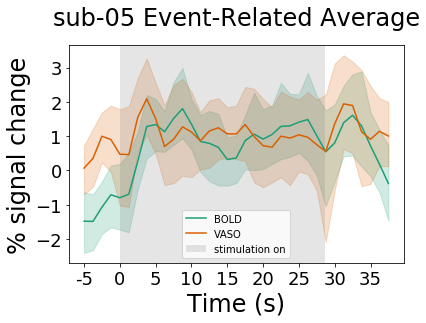

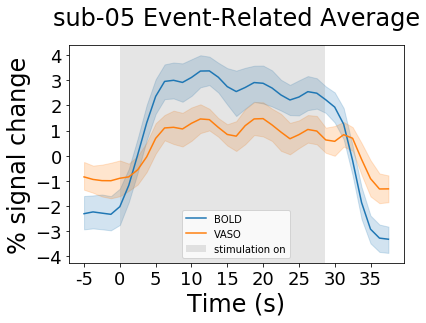

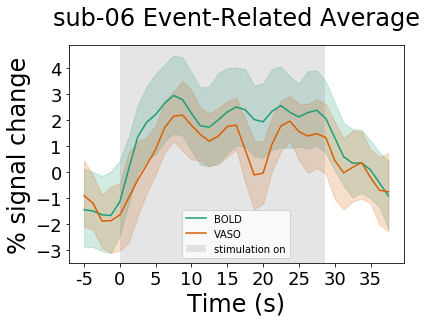

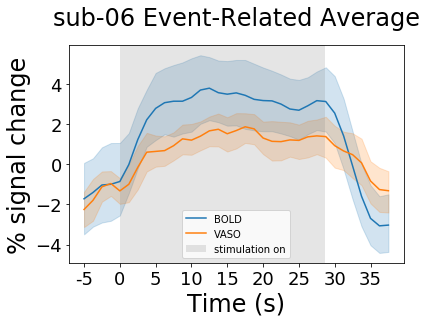

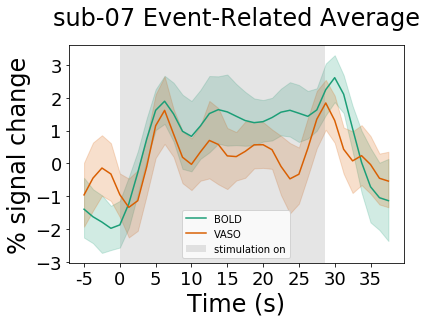

...

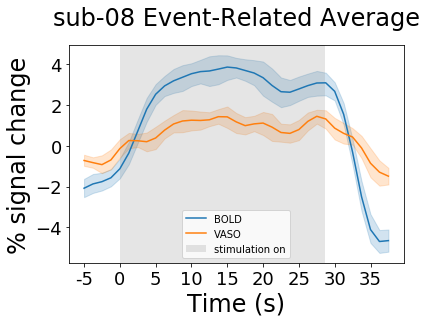

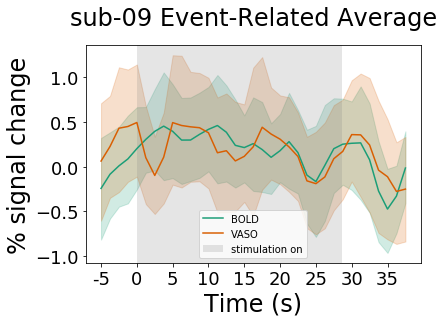

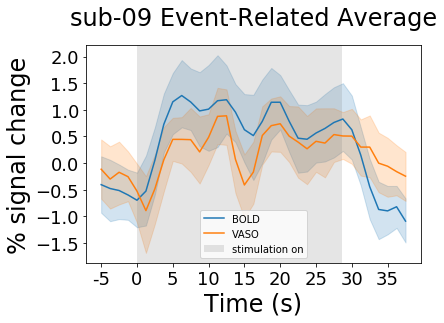

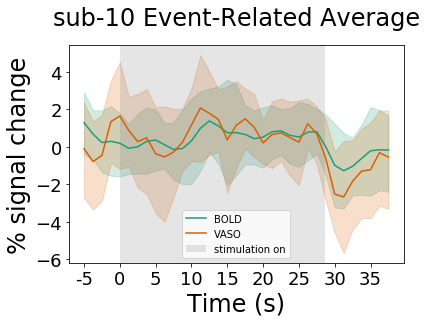

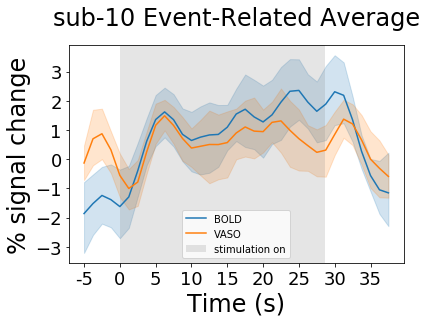

In [152]:
for sub in subs:
    for focus, cmap in zip(['s1Focus', 'v1Focus'],['Dark2', 'tab10']):
        sns.lineplot(data=blockData.loc[(blockData['subject']==sub)&(blockData['focus']==focus)], x='x', y='data', hue='modality', palette = cmap)


        plt.axvspan(4, 4+(30/tr), color='grey', alpha=0.2, lw=0, label = 'stimulation on')
        plt.ylabel('% signal change', fontsize=24)
        plt.xlabel('Time (s)', fontsize=24)
        plt.title(f"{sub} Event-Related Average", fontsize=24, pad=20)
        plt.legend(loc='lower center')


        values = (np.linspace(-4,len(blockResults[focus]['sub-08']['sub-08_ses-001_task-blockStim_run-002']['BOLD']['trial 1'])-4,10)*tr).round().astype(int)
        spacing = np.arange(0,len(blockResults[focus]['sub-08']['sub-08_ses-001_task-blockStim_run-002']['BOLD']['trial 1']),4)

        plt.xticks(spacing,values, fontsize=18)
        plt.yticks(fontsize=18)
        plt.savefig(f'{root}/{sub}_{focus}_BlockResults.png', bbox_inches = "tight")
        plt.show()

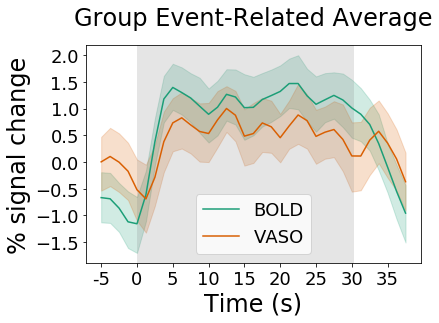

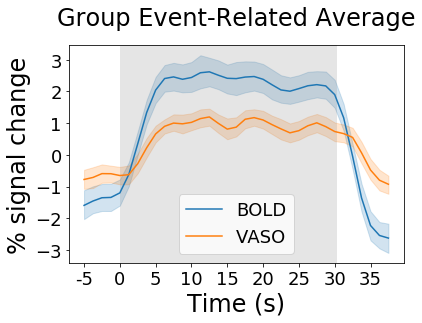

In [151]:
for focus, cmap in zip(['s1Focus', 'v1Focus'],['Dark2', 'tab10']):
    sns.lineplot(data=blockData.loc[blockData['focus']==focus], x='x', y='data', hue='modality', palette = cmap)


    plt.axvspan(4, 4+(30/tr)+tr, color='grey', alpha=0.2, lw=0)
    plt.ylabel('% signal change', fontsize=24)
    plt.xlabel('Time (s)', fontsize=24)
    plt.title(f"Group Event-Related Average", fontsize=24, pad=20)
    plt.legend(loc='lower center', fontsize=18)


    values = (np.linspace(-4,len(blockResults[focus]['sub-08']['sub-08_ses-001_task-blockStim_run-002']['BOLD']['trial 1'])-4,10)*tr).round().astype(int)
    spacing = np.arange(0,len(blockResults[focus]['sub-08']['sub-08_ses-001_task-blockStim_run-002']['BOLD']['trial 1']),4)

    plt.xticks(spacing,values, fontsize=18)
    plt.yticks(fontsize=18)
    plt.savefig(f'{root}/Group{focus}BlockResults.png', bbox_inches = "tight")
    plt.show()

### 6.2 For Events

In [221]:
root = '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti'

subs = ['sub-05', 'sub-06','sub-07','sub-08', 'sub-09','sub-10']
subs = ['sub-09','sub-10']

modalities = ['BOLD', 'VASO']


eventResults = {}

for focus, cmap in zip(['s1Focus', 'v1Focus'],['Dark2', 'tab10']):
# for focus, cmap in zip(['v1Focus'],['tab10']):

    eventResults[focus] = {}
    for sub in subs:
        print(sub)
        if (focus == 's1Focus' and sub == 'sub-09'):
            print(f'skipping {sub} for {focus}')
            continue
            
        eventResults[focus][sub] = {}

        runs = sorted(glob.glob(f'{root}/{sub}/ses-00*/func/{sub}_ses-00*_task-event*_run-00*_cbv.nii.gz'))

        for run in runs:

            base = os.path.basename(run).rsplit('.', 2)[0][:-4]
            print(base)
            if 'Random' in base:
                print(f'skipping randomised visotactile')
                continue
            
            if 'ses-001' in base:
                ses = 'ses-001'
            if 'ses-002' in base:
                ses = 'ses-002'
            
            eventResults[focus][sub][base] = {}
            
            try:
                box = find_roi_box(nb.load(f'{root}/derivatives/{sub}/{ses}/{focus}/{sub}_masks/{base}_rim.nii.gz').get_fdata())
            except:
                box = find_roi_box(nb.load(f'{root}/derivatives/{sub}/{ses}/{focus}/{sub}_masks/{base}_rim.nii').get_fdata())
            
            mask = nb.load(f'{root}/derivatives/{sub}/{ses}/{focus}/{sub}_masks/{base}_3layers_layers_equidist.nii')
            mask = np.asarray(mask.dataobj[box[0], box[1], box[2]])
            
            idx_layers = np.unique(mask.astype("int"))
            idx_layers = idx_layers[1:]

            for modality in modalities:
                print(modality)
                eventResults[focus][sub][base][modality] = {}

                skippedTrials = 0


                run = f'{root}/derivatives/{sub}/{ses}/{focus}/{base}_{modality}_slice.nii'

                Nii = nb.load(run)
                # As before, get the data as an array.
                data = Nii.get_fdata()[:,:,:,:-2]
                # load the nifty-header to get some meta-data.
                header = Nii.header

                # As the number of volumes which is the 4th position of
                # get_shape. This seems to be unused so I will comment it out to check.
                # nr_volumes = int(header.get_data_shape()[3])

                # Or the TR, which is the 4th position of get_zooms().
                tr = header.get_zooms()[3]

                 # Get scan duration in s
                runTime = data.shape[-1]*tr

                events = pd.read_csv(f'{root}/derivatives/{sub}/{ses}/events/{base}.txt', sep = ' ', names = ['start','duration','trialType'])[:-1]

                # Load information on run-wise motion
                FDs = pd.read_csv(f'{root}/derivatives/{sub}/{ses}/v1Focus/motionParameters/{sub}_FDs.csv')

                # Because we want the % signal-change, we need the mean
                # of the voxel we are looking at. This is done with
                # some fancy matrix operations.
                
                
                
                for i, row in events.iterrows():

                    onset = round(row['start']/tr)
                    # Do the same for the offset
                    offset = round(onset + row['duration']/tr)

                    # check whether trial is fully there
                    if offset > data.shape[3]:
                        break

                    # Because we want the % signal-change, we need the mean
                    # of the voxel we are looking at. This is done with
                    # some fancy matrix operations.
                    mask_mean = np.mean(data[:, :, :]
                                        [mask.astype(bool)])

                    # truncate motion data to event
                    tmp = FDs.loc[(FDs['volume']>=(onset-2)/2)&(FDs['volume']<=(offset+2)/2)&(FDs['run'].str.contains(f'{base}'))]

                    if not (tmp['FD']>=2).any():
                        eventResults[focus][sub][base][modality][f'trial {i}'] = np.mean((((data[:, :, :, int(onset-4):int(offset+ 8)][mask.astype(bool)]) / mask_mean)- 1) * 100,axis=0)

            

sub-05
sub-05_ses-001_task-eventStim_run-001
BOLD
VASO
sub-05_ses-001_task-eventStim_run-002
BOLD
VASO
sub-06
sub-06_ses-001_task-eventStim_run-001
BOLD
VASO
sub-06_ses-001_task-eventStim_run-002
BOLD
VASO
sub-06_ses-001_task-eventStim_run-003
BOLD
VASO
sub-06_ses-001_task-eventStim_run-004
BOLD
VASO
sub-07
sub-07_ses-001_task-eventStim_run-001
BOLD
VASO
sub-07_ses-001_task-eventStim_run-002
BOLD
VASO
sub-07_ses-001_task-eventStim_run-003
BOLD
VASO
sub-07_ses-001_task-eventStim_run-004
BOLD
VASO
sub-08
sub-08_ses-001_task-eventStim_run-001
BOLD
VASO
sub-08_ses-001_task-eventStim_run-002
BOLD
VASO
sub-08_ses-001_task-eventStim_run-003
BOLD
VASO
sub-08_ses-001_task-eventStim_run-004
BOLD
VASO
sub-09
skipping sub-09 for s1Focus
sub-10
sub-10_ses-001_task-eventStimRandom_run-001
skipping randomised visotactile
sub-10_ses-001_task-eventStimRandom_run-002
skipping randomised visotactile
sub-10_ses-001_task-eventStim_run-001
BOLD
VASO
sub-10_ses-001_task-eventStim_run-002
BOLD
VASO
sub-10_ses

In [285]:
# ### OLD


# subs = ['sub-05', 'sub-06', 'sub-07', 'sub-08','sub-09', 'sub-10']


# root = '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives'

# numberOfRuns = 2
# modalities = ['BOLD', 'VASO']

# eventResults = {}
# for focus in ['s1Focus', 'v1Focus']:
# # for focus in ['v1Focus']:

#     eventResults[focus] = {}
#     for sub in subs:
#         print(sub)
#         eventResults[focus][sub] = {}

#         runs = sorted(glob.glob(f'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/{sub}/ses-001/func/{sub}_ses-001_task-eventStim_run-00*_cbv.nii.gz'))

#         for run in runs:

#             base = os.path.basename(run).rsplit('.', 2)[0][:-4]
#             eventResults[focus][sub][base] = {}
            
#             box = find_roi_box(nb.load(f'{root}/{sub}/ses-001/{focus}/{sub}_masks/{base}_rim.nii.gz').get_fdata())



#             for modality in modalities:
#                 eventResults[focus][sub][base][modality] = {}

#                 print(f'processing {base}')

#                 run = f'{root}/{sub}/ses-001/{focus}/{base}_{modality}_slice.nii'
#                 mask = nb.load(f'{root}/{sub}/ses-001/{focus}/{sub}_masks/{base}_3layers_layers_equidist.nii')
#                 mask = np.asarray(mask.dataobj[box[0], box[1], box[2]])
                
                
                
#                 Nii = nb.load(run)
#                 # As before, get the data as an array.
#                 data = Nii.get_fdata()[:,:,:,:-2]
#                 # load the nifty-header to get some meta-data.
#                 header = Nii.header

#                 # As the number of volumes which is the 4th position of
#                 # get_shape. This seems to be unused so I will comment it out to check.
#                 # nr_volumes = int(header.get_data_shape()[3])

#                 # Or the TR, which is the 4th position of get_zooms().
#                 tr = header.get_zooms()[3]

#                  # Get scan duration in s
#                 runTime = data.shape[-1]*tr

#                 events = pd.read_csv(f'{root}/{sub}/ses-001/events/{base}.txt', sep = ' ', names = ['start','duration','trialType'])

#                 # Load information on run-wise motion
#                 FDs = pd.read_csv(f'{root}/{sub}/ses-001/v1Focus/motionParameters/{sub}_FDs.csv')



#                 for i, row in events.iterrows():

#                     onset = round(row['start']/tr)
#                     # Do the same for the offset
#                     offset = round(onset + row['duration']/tr)

#                     # check whether trial is fully there
#                     if offset > data.shape[3]:
#                         break

#                     # Because we want the % signal-change, we need the mean
#                     # of the voxel we are looking at. This is done with
#                     # some fancy matrix operations.
#                     mask_mean = np.mean(data[:, :, :]
#                                         [mask.astype(bool)])

#                     # truncate motion data to event
#                     tmp = FDs.loc[(FDs['volume']>=(onset-2)/2)&(FDs['volume']<=(offset+2)/2)&(FDs['run'].str.contains(f'{base}'))]

#                     if not (tmp['FD']>=2).any():
#                         eventResults[focus][sub][base][modality][f'trial {i}'] = np.mean((((data[:, :, :, int(onset-4):int(offset+ 8)][mask.astype(bool)]) / mask_mean)- 1) * 100,axis=0)

            

sub-05
processing sub-05_ses-001_task-eventStim_run-001
processing sub-05_ses-001_task-eventStim_run-001
processing sub-05_ses-001_task-eventStim_run-002
processing sub-05_ses-001_task-eventStim_run-002
sub-06
processing sub-06_ses-001_task-eventStim_run-001
processing sub-06_ses-001_task-eventStim_run-001
processing sub-06_ses-001_task-eventStim_run-002
processing sub-06_ses-001_task-eventStim_run-002
processing sub-06_ses-001_task-eventStim_run-003
processing sub-06_ses-001_task-eventStim_run-003
processing sub-06_ses-001_task-eventStim_run-004
processing sub-06_ses-001_task-eventStim_run-004
sub-07
processing sub-07_ses-001_task-eventStim_run-001
processing sub-07_ses-001_task-eventStim_run-001
processing sub-07_ses-001_task-eventStim_run-002
processing sub-07_ses-001_task-eventStim_run-002
processing sub-07_ses-001_task-eventStim_run-003
processing sub-07_ses-001_task-eventStim_run-003
processing sub-07_ses-001_task-eventStim_run-004
processing sub-07_ses-001_task-eventStim_run-004

In [222]:
subList = []
dataList = []
xList = []
modalityList = []
trialList = []
runList = []
layerList = []
focusList = []

layers = {'1':'deep','2':'middle','3':'superficial'}

# subs = ['sub-05']
for focus, cmap in zip(['s1Focus', 'v1Focus'],['Dark2', 'tab10']):
# for focus, cmap in zip(['v1Focus'],['tab10']):
    for sub in subs:
        print(sub)
        if (focus == 's1Focus' and sub == 'sub-09'):
            print(f'skipping {sub} for {focus}')
            continue
            
        runs = sorted(glob.glob(f'{root}/{sub}/ses-00*/func/{sub}_ses-00*_task-event*_run-00*_cbv.nii.gz'))

        for run in runs:

            base = os.path.basename(run).rsplit('.', 2)[0][:-4]
            print(base)
            if 'Random' in base:
                print(f'skipping randomised visotactile')
                continue
            
            if 'ses-001' in base:
                ses = 'ses-001'
            if 'ses-002' in base:
                ses = 'ses-002'
                
            for modality in modalities:
                print(modality)

                for j in range(1, 4):

                    subTrials = []
                    for key, value in eventResults[focus][sub][base][modality].items():
                        subTrials.append(key)

                    for trial in subTrials[:-1]:

                        for n in range(len(eventResults[focus][sub][base][modality][trial])):

                            if modality == "BOLD":
                                dataList.append(eventResults[focus][sub][base][modality][trial][n])

                            if modality == "VASO":
                                dataList.append(-eventResults[focus][sub][base][modality][trial][n])

                            modalityList.append(modality)
                            trialList.append(trial)
                            runList.append(base)
                            xList.append(n)
                            subList.append(sub)
                            layerList.append(layers[str(j)])
                            focusList.append(focus)


eventData = pd.DataFrame({'subject': subList,'x':xList, 'data': dataList, 'modality': modalityList, 'trial': trialList, 'run':runList, 'layer':layerList, 'focus': focusList})

sub-05
sub-05_ses-001_task-eventStim_run-001
BOLD
VASO
sub-05_ses-001_task-eventStim_run-002
BOLD
VASO
sub-06
sub-06_ses-001_task-eventStim_run-001
BOLD
VASO
sub-06_ses-001_task-eventStim_run-002
BOLD
VASO
sub-06_ses-001_task-eventStim_run-003
BOLD
VASO
sub-06_ses-001_task-eventStim_run-004
BOLD
VASO
sub-07
sub-07_ses-001_task-eventStim_run-001
BOLD
VASO
sub-07_ses-001_task-eventStim_run-002
BOLD
VASO
sub-07_ses-001_task-eventStim_run-003
BOLD
VASO
sub-07_ses-001_task-eventStim_run-004
BOLD
VASO
sub-08
sub-08_ses-001_task-eventStim_run-001
BOLD
VASO
sub-08_ses-001_task-eventStim_run-002
BOLD
VASO
sub-08_ses-001_task-eventStim_run-003
BOLD
VASO
sub-08_ses-001_task-eventStim_run-004
BOLD
VASO
sub-09
skipping sub-09 for s1Focus
sub-10
sub-10_ses-001_task-eventStimRandom_run-001
skipping randomised visotactile
sub-10_ses-001_task-eventStimRandom_run-002
skipping randomised visotactile
sub-10_ses-001_task-eventStim_run-001
BOLD
VASO
sub-10_ses-001_task-eventStim_run-002
BOLD
VASO
sub-10_ses

In [290]:
# OLD


## Event results created wih layers



# subList = []
# dataList = []
# xList = []
# modalityList = []
# trialList = []
# runList = []
# focusList = []

# for focus, cmap in zip(['s1Focus', 'v1Focus'],['Dark2', 'tab10']):
# # for focus, cmap in zip(['v1Focus'],['tab10']):
#     print(focus)
#     for sub in subs:
#         print(sub)

#         runs = sorted(glob.glob(f'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/{sub}/ses-001/func/{sub}_ses-001_task-eventStim_run-00*_cbv.nii.gz'))
#         for run in runs:

#             base = os.path.basename(run).rsplit('.', 2)[0][:-4]


#             for modality in modalities:

#                 subTrials = []
#                 for key, value in eventResults[focus][sub][base][modality].items():
#                     subTrials.append(key)

#                 for trial in subTrials[:-1]:

#                     for n in range(len(eventResults[focus][sub][base][modality][trial])):

#                         if modality == "BOLD":
#                             dataList.append(eventResults[focus][sub][base][modality][trial][n])

#                         if modality == "VASO":
#                             dataList.append(-eventResults[focus][sub][base][modality][trial][n])

#                         modalityList.append(modality)
#                         trialList.append(trial)
#                         runList.append(base)
#                         xList.append(n)
#                         subList.append(sub)
#                         focusList.append(focus)
        

# eventData = pd.DataFrame({'subject': subList,'x':xList, 'data': dataList, 'modality': modalityList, 'trial': trialList, 'run':runList, 'focus': focusList})

sub-05
sub-06
sub-07
sub-08
sub-10
sub-05
sub-06
sub-07
sub-08
sub-10


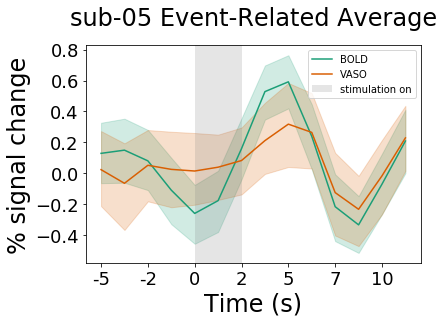

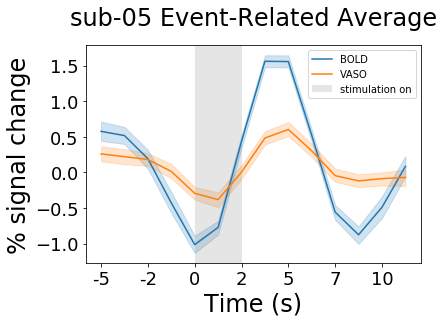

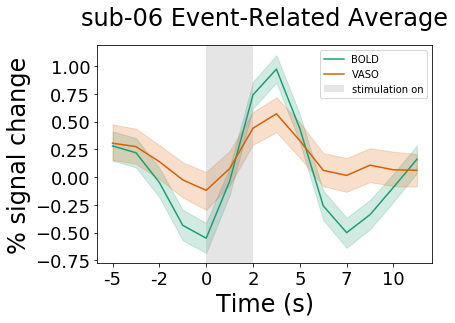

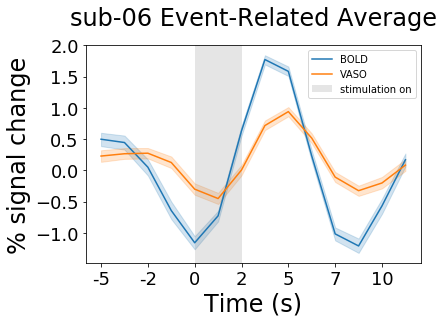

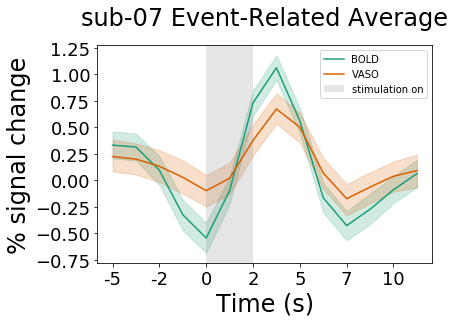

...

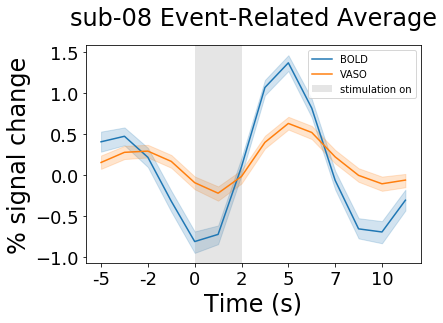

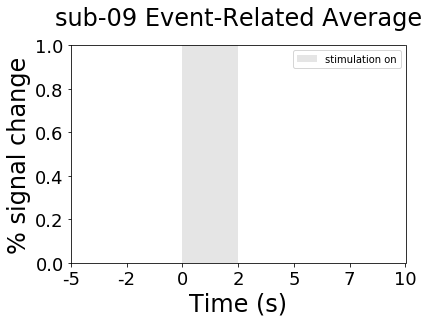

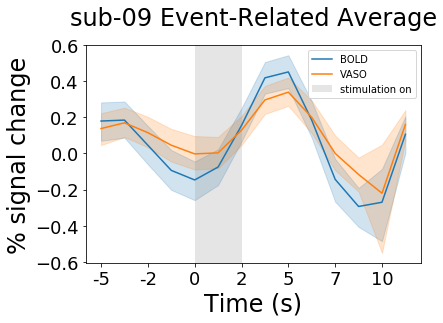

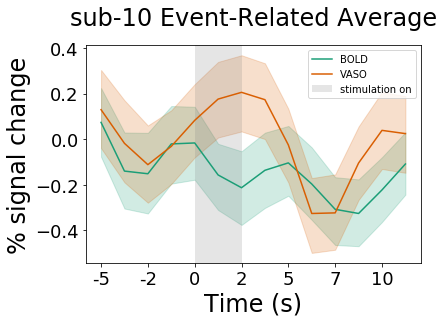

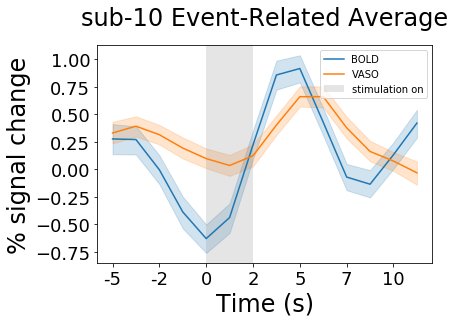

In [258]:
subs = ['sub-05', 'sub-06', 'sub-07', 'sub-08','sub-09', 'sub-10']

for sub in subs:
    for focus, cmap in zip(['s1Focus', 'v1Focus'],['Dark2', 'tab10']):
        sns.lineplot(data=eventData.loc[(eventData['subject']==sub)&(eventData['focus']==focus)], x='x', y='data', hue='modality', palette=cmap)


        plt.axvspan(4, 4+(2), color='grey', alpha=0.2, lw=0, label = 'stimulation on')
        plt.ylabel('% signal change', fontsize=24)
        plt.xlabel('Time (s)', fontsize=24)
        plt.title(f"{sub} Event-Related Average", fontsize=24, pad=20)
        plt.legend(loc='upper right')



        values = (np.arange(-4,len(eventResults[focus]['sub-08']['sub-08_ses-001_task-eventStim_run-002']['BOLD']['trial 1'])-4,2)*tr).astype(int)
        spacing = np.arange(0,len(eventResults[focus]['sub-08']['sub-08_ses-001_task-eventStim_run-002']['BOLD']['trial 1']),2)
        plt.xticks(spacing,values, fontsize=18)
        plt.yticks(fontsize=18)
        plt.savefig(f'{root}/{sub}_{focus}EventResults.png', bbox_inches = "tight")
        plt.show()

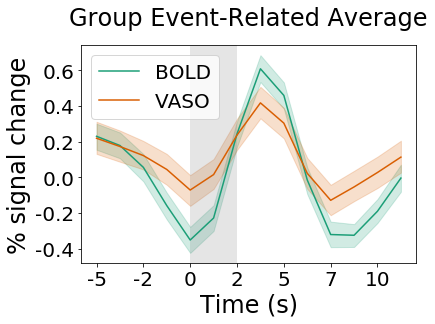

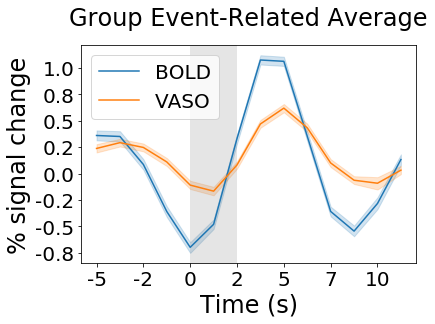

In [285]:
from matplotlib.ticker import FormatStrFormatter


for focus, cmap in zip(['s1Focus', 'v1Focus'],['Dark2', 'tab10']):
    fig, ax = plt.subplots()
    sns.lineplot(data=eventData.loc[eventData['focus']==focus], x='x', y='data', hue='modality', palette=cmap)


    plt.axvspan(4, 4+(2), color='grey', alpha=0.2, lw=0)
    plt.ylabel('% signal change', fontsize=24)
    plt.xlabel('Time (s)', fontsize=24)
    plt.title(f"Group Event-Related Average", fontsize=24, pad=20)
    plt.legend(loc='upper left', fontsize=20)



#     values = np.arange(-4,len(eventResults[focus]['sub-08']['sub-08_ses-001_task-eventStim_run-002']['BOLD']['trial 1'])-4,2)
#     spacing = np.arange(0,len(eventResults[focus]['sub-08']['sub-08_ses-001_task-eventStim_run-002']['BOLD']['trial 1']),2)
    
    values = (np.arange(-4,len(eventResults[focus]['sub-08']['sub-08_ses-001_task-eventStim_run-002']['BOLD']['trial 1'])-4,2)*tr).astype(int)
    spacing = np.arange(0,len(eventResults[focus]['sub-08']['sub-08_ses-001_task-eventStim_run-002']['BOLD']['trial 1']),2)

        
    
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
    plt.xticks(spacing,values, fontsize=20)
    plt.yticks(fontsize=20)
    plt.savefig(f'{root}/Group{focus}EventResultsFromLayers.png', bbox_inches = "tight")
    plt.show()

### 6.3 For Layers

In [166]:
root = '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti'

subs = ['sub-05', 'sub-06','sub-07','sub-08', 'sub-09','sub-10']
# subs = ['sub-09','sub-10']

modalities = ['BOLD', 'VASO']


layerEventResults = {}

for focus, cmap in zip(['s1Focus', 'v1Focus'],['Dark2', 'tab10']):
# for focus, cmap in zip(['v1Focus'],['tab10']):

    layerEventResults[focus] = {}
    for sub in subs:
        print(sub)
        if (focus == 's1Focus' and sub == 'sub-09'):
            print(f'skipping {sub} for {focus}')
            continue
            
        layerEventResults[focus][sub] = {}

        runs = sorted(glob.glob(f'{root}/{sub}/ses-00*/func/{sub}_ses-00*_task-event*_run-00*_cbv.nii.gz'))

        for run in runs:

            base = os.path.basename(run).rsplit('.', 2)[0][:-4]
            print(base)
            if 'Random' in base:
                print(f'skipping randomised visotactile')
                continue
            
            if 'ses-001' in base:
                ses = 'ses-001'
            if 'ses-002' in base:
                ses = 'ses-002'
            
            layerEventResults[focus][sub][base] = {}
            
            try:
                box = find_roi_box(nb.load(f'{root}/derivatives/{sub}/{ses}/{focus}/{sub}_masks/{base}_rim.nii.gz').get_fdata())
            except:
                box = find_roi_box(nb.load(f'{root}/derivatives/{sub}/{ses}/{focus}/{sub}_masks/{base}_rim.nii').get_fdata())
            mask = nb.load(f'{root}/derivatives/{sub}/{ses}/{focus}/{sub}_masks/{base}_3layers_layers_equidist.nii')
            mask = np.asarray(mask.dataobj[box[0], box[1], box[2]])
            
            idx_layers = np.unique(mask.astype("int"))
            idx_layers = idx_layers[1:]

            for modality in modalities:
                print(modality)
                layerEventResults[focus][sub][base][modality] = {}

                skippedTrials = 0


                run = f'{root}/derivatives/{sub}/{ses}/{focus}/{base}_{modality}_slice.nii'

                Nii = nb.load(run)
                # As before, get the data as an array.
                data = Nii.get_fdata()[:,:,:,:-2]
                # load the nifty-header to get some meta-data.
                header = Nii.header

                # As the number of volumes which is the 4th position of
                # get_shape. This seems to be unused so I will comment it out to check.
                # nr_volumes = int(header.get_data_shape()[3])

                # Or the TR, which is the 4th position of get_zooms().
                tr = header.get_zooms()[3]

                 # Get scan duration in s
                runTime = data.shape[-1]*tr

                events = pd.read_csv(f'{root}/derivatives/{sub}/{ses}/events/{base}.txt', sep = ' ', names = ['start','duration','trialType'])[:-1]

                # Load information on run-wise motion
                FDs = pd.read_csv(f'{root}/derivatives/{sub}/{ses}/v1Focus/motionParameters/{sub}_FDs.csv')

                # Because we want the % signal-change, we need the mean
                # of the voxel we are looking at. This is done with
                # some fancy matrix operations.

                for j in idx_layers:  # Compute bin averages

                    layerEventResults[focus][sub][base][modality][f'layer {j}'] = {}

                    layerRoi = mask == j



                    mask_mean = np.mean(data[:, :, :]
                                        [layerRoi.astype(bool)])

                    includedTrials = []

                    for i, row in events.iterrows():


                        onset = round(row['start']/tr)
                        # Do the same for the offset
                        offset = round(onset + row['duration']/tr)


                        # truncate motion data to event
                        tmp = FDs.loc[(FDs['volume']>=(onset-2)/2)&(FDs['volume']<=(offset+2)/2)&(FDs['run'].str.contains(f'{base}[-17:]'))]


                        if not (tmp['FD']>=2).any():

                            layerEventResults[focus][sub][base][modality][f'layer {j}'][f'trial {i}'] = np.mean((((data[:, :, :, int(onset-4):int(offset+ 8)][layerRoi.astype(bool)]) / mask_mean)- 1) * 100,axis=0)
                            includedTrials.append(f'trial {i}')



sub-05
sub-05_ses-001_task-eventStim_run-001
BOLD
VASO
sub-05_ses-001_task-eventStim_run-002
BOLD
VASO
sub-06
sub-06_ses-001_task-eventStim_run-001
BOLD
VASO
sub-06_ses-001_task-eventStim_run-002
BOLD
VASO
sub-06_ses-001_task-eventStim_run-003
BOLD
VASO
sub-06_ses-001_task-eventStim_run-004
BOLD
VASO
sub-07
sub-07_ses-001_task-eventStim_run-001
BOLD
VASO
sub-07_ses-001_task-eventStim_run-002
BOLD
VASO
sub-07_ses-001_task-eventStim_run-003
BOLD
VASO
sub-07_ses-001_task-eventStim_run-004
BOLD
VASO
sub-08
sub-08_ses-001_task-eventStim_run-001
BOLD
VASO
sub-08_ses-001_task-eventStim_run-002
BOLD
VASO
sub-08_ses-001_task-eventStim_run-003
BOLD
VASO
sub-08_ses-001_task-eventStim_run-004
BOLD
VASO
sub-09
skipping sub-09 for s1Focus
sub-10
sub-10_ses-001_task-eventStimRandom_run-001
skipping randomised visotactile
sub-10_ses-001_task-eventStimRandom_run-002
skipping randomised visotactile
sub-10_ses-001_task-eventStim_run-001
BOLD
VASO
sub-10_ses-001_task-eventStim_run-002
BOLD
VASO
sub-10_ses

In [172]:
subList = []
dataList = []
xList = []
modalityList = []
trialList = []
runList = []
layerList = []
focusList = []

layers = {'1':'deep','2':'middle','3':'superficial'}

# subs = ['sub-05']
for focus, cmap in zip(['s1Focus', 'v1Focus'],['Dark2', 'tab10']):
# for focus, cmap in zip(['v1Focus'],['tab10']):
    for sub in subs:
        print(sub)
        if (focus == 's1Focus' and sub == 'sub-09'):
            print(f'skipping {sub} for {focus}')
            continue
            
        runs = sorted(glob.glob(f'{root}/{sub}/ses-00*/func/{sub}_ses-00*_task-event*_run-00*_cbv.nii.gz'))

        for run in runs:

            base = os.path.basename(run).rsplit('.', 2)[0][:-4]
            print(base)
            if 'Random' in base:
                print(f'skipping randomised visotactile')
                continue
            
            if 'ses-001' in base:
                ses = 'ses-001'
            if 'ses-002' in base:
                ses = 'ses-002'
                
            for modality in modalities:
                print(modality)

                for j in range(1, 4):

                    subTrials = []
                    for key, value in layerEventResults[focus][sub][base][modality][f'layer {j}'].items():
                        subTrials.append(key)

                    for trial in subTrials[:-1]:

                        for n in range(len(layerEventResults[focus][sub][base][modality][f'layer {j}'][trial])):

                            if modality == "BOLD":
                                dataList.append(layerEventResults[focus][sub][base][modality][f'layer {j}'][trial][n])

                            if modality == "VASO":
                                dataList.append(-layerEventResults[focus][sub][base][modality][f'layer {j}'][trial][n])

                            modalityList.append(modality)
                            trialList.append(trial)
                            runList.append(base)
                            xList.append(n)
                            subList.append(sub)
                            layerList.append(layers[str(j)])
                            focusList.append(focus)


layerEventData = pd.DataFrame({'subject': subList,'x':xList, 'data': dataList, 'modality': modalityList, 'trial': trialList, 'run':runList, 'layer':layerList, 'focus': focusList})

sub-05
sub-05_ses-001_task-eventStim_run-001
BOLD
VASO
sub-05_ses-001_task-eventStim_run-002
BOLD
VASO
sub-06
sub-06_ses-001_task-eventStim_run-001
BOLD
VASO
sub-06_ses-001_task-eventStim_run-002
BOLD
VASO
sub-06_ses-001_task-eventStim_run-003
BOLD
VASO
sub-06_ses-001_task-eventStim_run-004
BOLD
VASO
sub-07
sub-07_ses-001_task-eventStim_run-001
BOLD
VASO
sub-07_ses-001_task-eventStim_run-002
BOLD
VASO
sub-07_ses-001_task-eventStim_run-003
BOLD
VASO
sub-07_ses-001_task-eventStim_run-004
BOLD
VASO
sub-08
sub-08_ses-001_task-eventStim_run-001
BOLD
VASO
sub-08_ses-001_task-eventStim_run-002
BOLD
VASO
sub-08_ses-001_task-eventStim_run-003
BOLD
VASO
sub-08_ses-001_task-eventStim_run-004
BOLD
VASO
sub-09
skipping sub-09 for s1Focus
sub-10
sub-10_ses-001_task-eventStimRandom_run-001
skipping randomised visotactile
sub-10_ses-001_task-eventStimRandom_run-002
skipping randomised visotactile
sub-10_ses-001_task-eventStim_run-001
BOLD
VASO
sub-10_ses-001_task-eventStim_run-002
BOLD
VASO
sub-10_ses

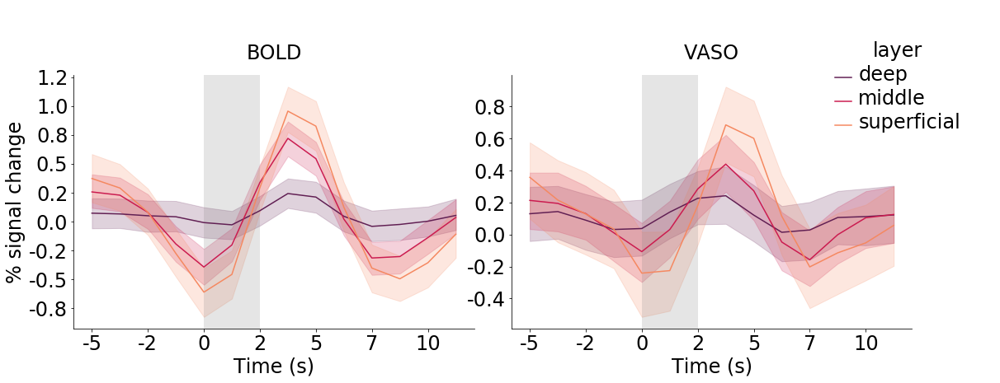

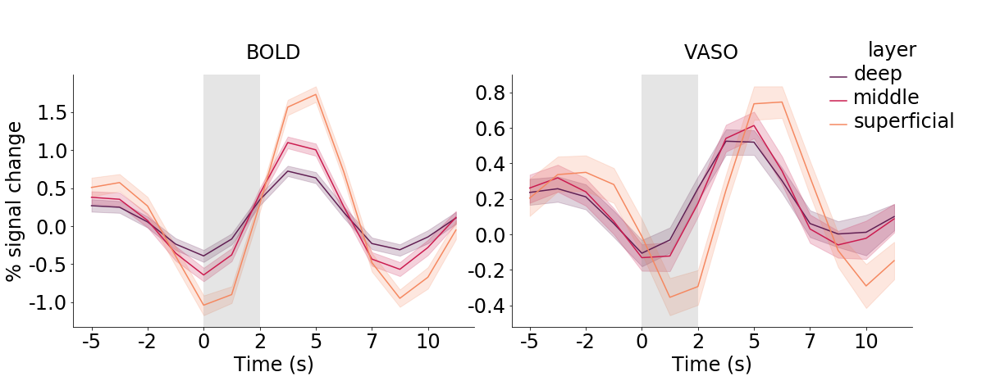

In [220]:

for focus, cmap in zip(['s1Focus', 'v1Focus'],['Dark2', 'tab10']):
# for focus, cmap in zip(['v1Focus'],['tab10']):
    
    g = sns.FacetGrid(layerEventData.loc[layerEventData['focus']==focus], col="modality", hue="layer", sharey=False, height= 5, aspect = 1.5,palette='rocket')
    g.map_dataframe(sns.lineplot, x="x", y="data")
    g.add_legend(bbox_to_anchor = (1, 1), borderaxespad = 0)
    
    
    g.axes[0,0].set_ylabel('% signal change', fontsize=24)

    g.axes[0,1].set_xlabel('Time (s)', fontsize=24)
    g.axes[0,0].set_xlabel('Time (s)', fontsize=24)


    g.axes[0,1].set_title('VASO', fontsize=24, pad=20)
    g.axes[0,0].set_title('BOLD', fontsize=24, pad=20)


    g.axes[0,0].axvspan(4, 4 + (2), color='grey', alpha=0.2, lw=0, label = 'stimulation on')
    g.axes[0,1].axvspan(4, 4 + (2), color='grey', alpha=0.2, lw=0, label = 'stimulation on')


    plt.setp(g._legend.get_title(), fontsize=24)
    plt.setp(g._legend.get_texts(), fontsize=24)



    values = (np.arange(-4,len(layerEventResults[focus]['sub-08']['sub-08_ses-001_task-eventStim_run-002']['BOLD'][f'layer {3}']['trial 1'])-4,2)*tr).astype(int)
    spacing = np.arange(0,len(layerEventResults[focus]['sub-08']['sub-08_ses-001_task-eventStim_run-002']['BOLD'][f'layer {3}']['trial 1']),2)

    
        
    g.axes[0,0].set_xticks(spacing)

    g.axes[0,0].set_xticklabels(values,fontsize=24)
    g.axes[0,1].set_xticklabels(values,fontsize=24)


    plt.setp(g.axes[0,0].get_yticklabels(), fontsize=24)
    plt.setp(g.axes[0,1].get_yticklabels(), fontsize=24)
    
    
    g.axes[0,0].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
    g.axes[0,1].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))


    g.savefig(f"{root}/eventResults{focus}LayersModalityVsLayers.png")
    plt.show()

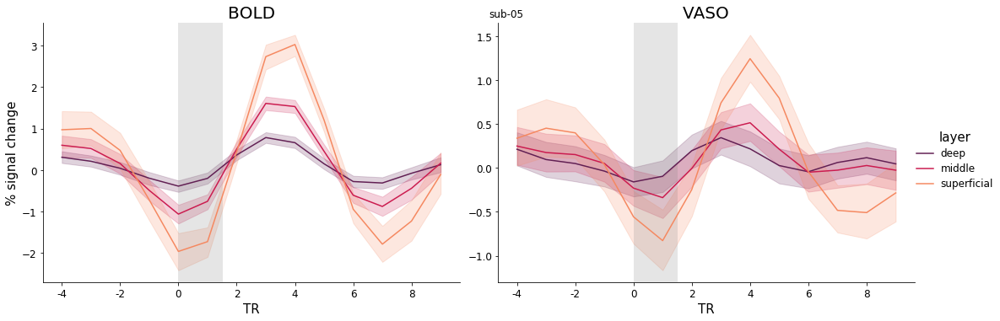

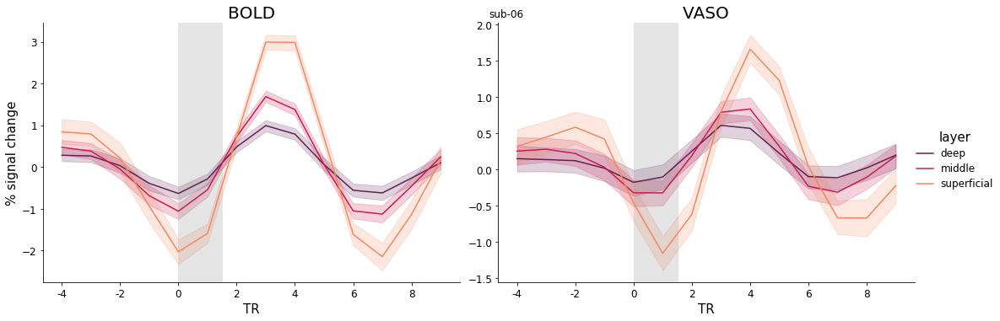

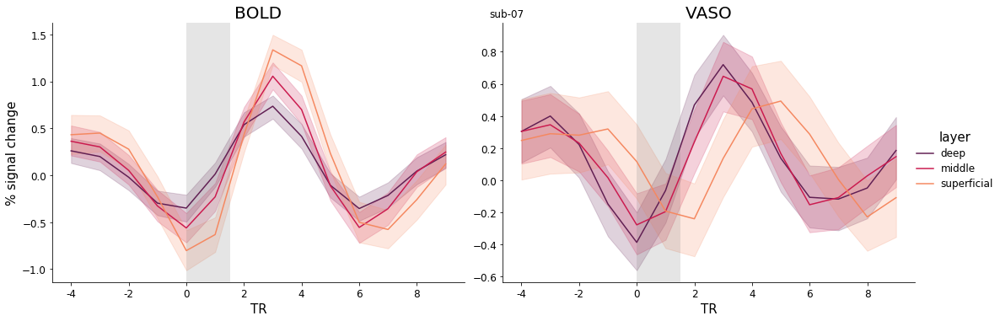

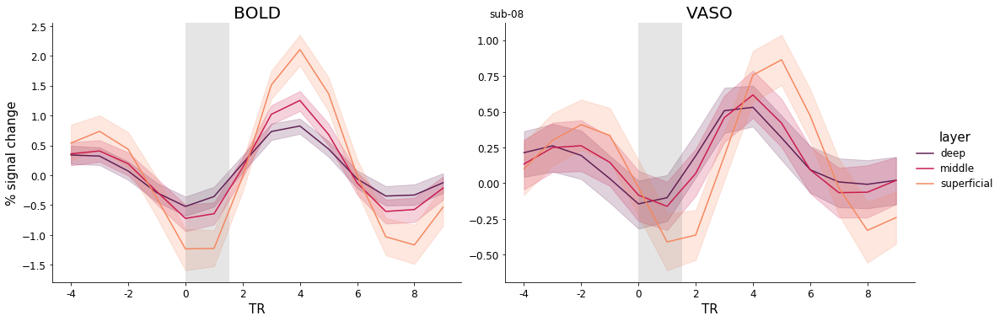

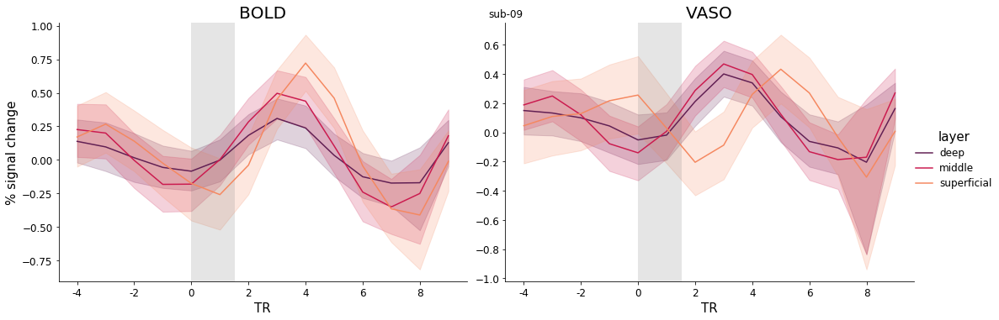

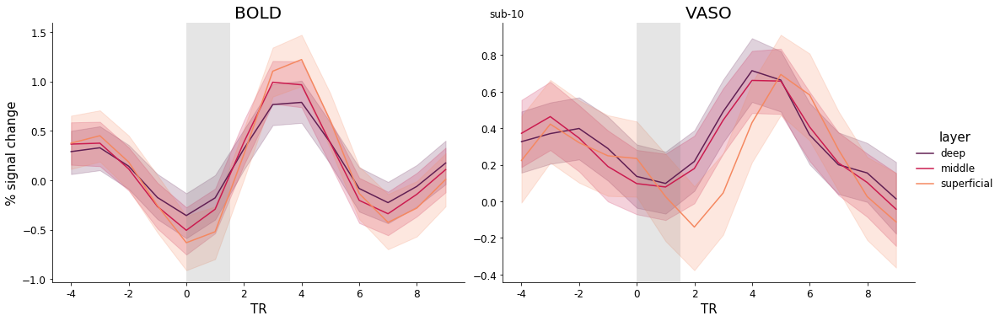

In [174]:
for sub in subs:
    tmp = layerEventData.loc[(layerEventData['subject']==sub)&(layerEventData['focus']=='v1Focus')]
    g = sns.FacetGrid(tmp, col="modality", hue="layer", sharey=False, height= 5, aspect = 1.5,palette='rocket')
    g.map_dataframe(sns.lineplot, x="x", y="data")
    g.add_legend()
    g.axes[0,0].set_ylabel('% signal change', fontsize=15)

    g.axes[0,1].set_xlabel('TR', fontsize=15)
    g.axes[0,0].set_xlabel('TR', fontsize=15)


    g.axes[0,1].set_title('VASO', fontsize=20)
    g.axes[0,0].set_title('BOLD', fontsize=20)


    g.axes[0,0].axvspan(4, 4 + (2/tr), color='grey', alpha=0.2, lw=0, label = 'stimulation on')
    g.axes[0,1].axvspan(4, 4 + (2/tr), color='grey', alpha=0.2, lw=0, label = 'stimulation on')


    plt.setp(g._legend.get_title(), fontsize=15)
    plt.setp(g._legend.get_texts(), fontsize=12)
    plt.suptitle(sub)
    
    values = np.arange(-4,len(layerEventResults['v1Focus']['sub-10']['sub-10_ses-001_task-eventStim_run-002']['BOLD'][f'layer {j}']['trial 1'])-4,2)
    spacing = np.arange(0,len(layerEventResults['v1Focus']['sub-10']['sub-10_ses-001_task-eventStim_run-002']['BOLD'][f'layer {j}']['trial 1']),2)

    g.axes[0,0].set_xticks(spacing)

    g.axes[0,0].set_xticklabels(values,fontsize=12)
    g.axes[0,1].set_xticklabels(values,fontsize=12)


    plt.setp(g.axes[0,0].get_yticklabels(), fontsize=12)
    plt.setp(g.axes[0,1].get_yticklabels(), fontsize=12)



    g.savefig(f"{root}/{sub}_eventResultsV1LayersModalityVsLayers.png")

### extract zscores

In [ ]:
        print(sub)
        if (focus == 's1Focus' and sub == 'sub-09'):
            print(f'skipping {sub} for {focus}')
            continue
            
        layerEventResults[focus][sub] = {}

        runs = sorted(glob.glob(f'{root}/{sub}/ses-00*/func/{sub}_ses-00*_task-event*_run-00*_cbv.nii.gz'))

        for run in runs:

            base = os.path.basename(run).rsplit('.', 2)[0][:-4]
            print(base)
            if 'Random' in base:
                print(f'skipping randomised visotactile')
                continue
            
            if 'ses-001' in base:
                ses = 'ses-001'
            if 'ses-002' in base:
                ses = 'ses-002'

In [282]:
subList = []
dataList = []
modalityList = []
layerList = []
stimTypeList = []
focusList = []

# layers = {'1':'deep','2':'middle','3':'superficial'}

# subs = ['sub-08']
subs = ['sub-05', 'sub-06', 'sub-07', 'sub-08','sub-09', 'sub-10']


for sub in subs:
    print(sub)
    
    if sub == 'sub-09':
        modalities = ['BOLD', 'VASO']
    elif sub == 'sub-10':
        modalities = ['BOLD', 'VASO']
    else:
        modalities = ['BOLD_intemp','VASO']
        
        
    for focus in ['v1Focus', 's1Focus']:
        print(focus)
        if (focus == 's1Focus' and sub == 'sub-09'):
            print(f'skipping {sub} for {focus}')
            continue

        for stimType in ['blockStim', 'eventStim']:

            runs = sorted(glob.glob(f'{root}/{sub}/ses-00*/func/{sub}_ses-00*_task-{stimType}*_run-00*_cbv.nii.gz'))

            for run in runs:

                base = os.path.basename(run).rsplit('.', 2)[0][:-4]
                print(base)


                if 'Random' in base:
                    print(f'skipping randomised visotactile')
                    continue

                if 'ses-001' in base:
                    ses = 'ses-001'
                if 'ses-002' in base:
                    ses = 'ses-002'



                try:
                    box = find_roi_box(nb.load(f'{root}/derivatives/{sub}/{ses}/{focus}/{sub}_masks/{base}_rim.nii.gz').get_fdata())
                except:
                    box = find_roi_box(nb.load(f'{root}/derivatives/{sub}/{ses}/{focus}/{sub}_masks/{base}_rim.nii').get_fdata())

                mask = nb.load(f'{root}/derivatives/{sub}/{ses}/{focus}/{sub}_masks/{base}_11layers_layers_equidist.nii')
                mask = np.asarray(mask.dataobj[box[0], box[1], box[2]])

                for modality in modalities:
                    data = nb.load(f'{root}/derivatives/{sub}/{ses}/{focus}/{base}_{modality}.feat/stats/zstat1_scaled.nii.gz')
                    data = np.asarray(data.dataobj[box[0], box[1], box[2]])

                    for j in range(1,12):  # Compute bin averages
                        layerRoi = mask == j
                        mask_mean = np.mean(data[layerRoi.astype(bool)])

                        subList.append(sub)
                        dataList.append(mask_mean)
                        modalityList.append(modality[:4])
                        layerList.append(j)
                        stimTypeList.append(stimType)
                        focusList.append(focus)



            
zscores = pd.DataFrame({'subject': subList, 'data': dataList, 'modality': modalityList, 'layer':layerList, 'stimType':stimTypeList, 'focus':focusList})

sub-05
v1Focus
sub-05_ses-001_task-blockStim_run-001
sub-05_ses-001_task-blockStim_run-002
sub-05_ses-001_task-eventStim_run-001
sub-05_ses-001_task-eventStim_run-002
s1Focus
sub-05_ses-001_task-blockStim_run-001
sub-05_ses-001_task-blockStim_run-002
sub-05_ses-001_task-eventStim_run-001
sub-05_ses-001_task-eventStim_run-002
sub-06
v1Focus
sub-06_ses-001_task-blockStim_run-001
sub-06_ses-001_task-blockStim_run-002
sub-06_ses-001_task-eventStim_run-001
sub-06_ses-001_task-eventStim_run-002
sub-06_ses-001_task-eventStim_run-003
sub-06_ses-001_task-eventStim_run-004
s1Focus
sub-06_ses-001_task-blockStim_run-001
sub-06_ses-001_task-blockStim_run-002
sub-06_ses-001_task-eventStim_run-001
sub-06_ses-001_task-eventStim_run-002
sub-06_ses-001_task-eventStim_run-003
sub-06_ses-001_task-eventStim_run-004
sub-07
v1Focus
sub-07_ses-001_task-blockStim_run-001
sub-07_ses-001_task-blockStim_run-002
sub-07_ses-001_task-eventStim_run-001
sub-07_ses-001_task-eventStim_run-002
sub-07_ses-001_task-eventSt

In [276]:
sub

'sub-09'

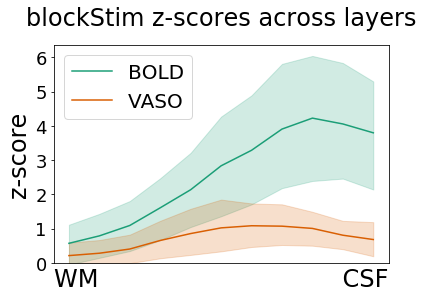

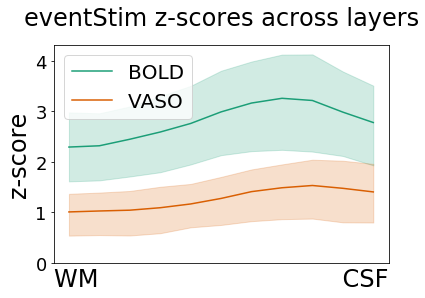

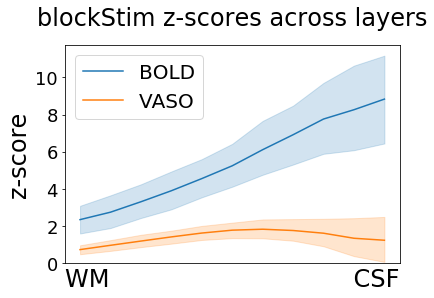

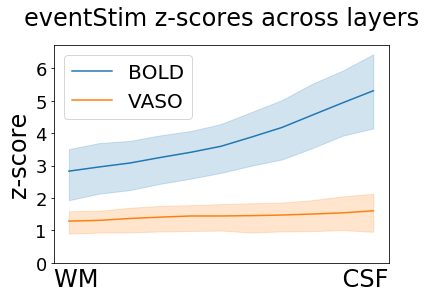

In [283]:
from matplotlib.ticker import MaxNLocator

for focus, cmap in zip(['s1Focus', 'v1Focus'],['Dark2', 'tab10']):
    for stimType in ['blockStim', 'eventStim']:
        fig, ax = plt.subplots()
        tmp = zscores.loc[(zscores['stimType']==stimType)&(zscores['focus']==focus)]

        sns.lineplot(data=tmp, x='layer', y='data', hue='modality',palette=cmap)


        plt.ylabel('z-score', fontsize=24)

        plt.title(f"{stimType} z-scores across layers", fontsize=24, pad=20)
        plt.xlabel('WM                                CSF', fontsize=24)
        plt.xticks([])
        yLimits = ax.get_ylim()
        plt.ylim(0,yLimits[1])    

        plt.yticks(fontsize=18)

        ax.yaxis.set_major_locator(MaxNLocator(integer=True))

        plt.legend(loc='upper left', fontsize=20)


        plt.savefig(f'{root}/Group_{focus}_{stimType}_zScoreProfile.png', bbox_inches = "tight")
        plt.show()

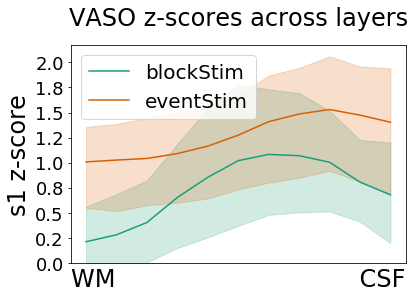

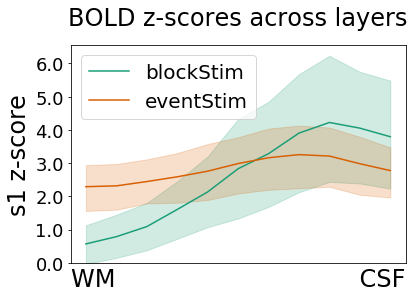

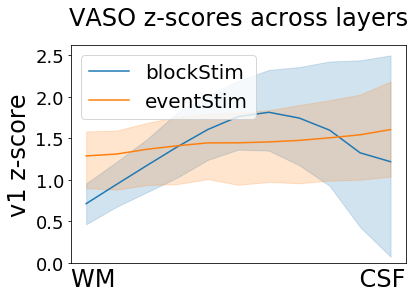

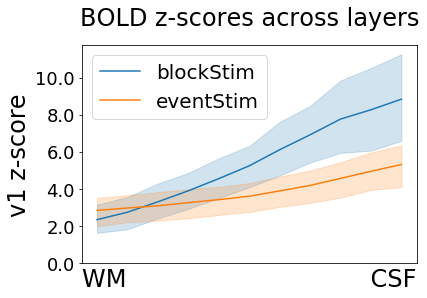

In [284]:
from matplotlib.ticker import MaxNLocator

for focus, cmap in zip(['s1Focus', 'v1Focus'],['Dark2', 'tab10']):
    for modality in ['VASO', 'BOLD']:
        fig, ax = plt.subplots()
        tmp = zscores.loc[(zscores['modality']==modality)&(zscores['focus']==focus)]

        sns.lineplot(data=tmp, x='layer', y='data', hue='stimType',palette=cmap)


        plt.ylabel(f'{focus[:2]} z-score', fontsize=24)

        plt.title(f"{modality[:4]} z-scores across layers", fontsize=24, pad=20)
        plt.xlabel('WM                                CSF', fontsize=24)
        plt.xticks([])


        plt.yticks(fontsize=18)

        ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

        plt.legend(loc='upper left')
        
        yLimits = ax.get_ylim()
        plt.ylim(0,yLimits[1])
        plt.legend(loc='upper left',fontsize=20)

        plt.savefig(f'{root}/Group_{focus}_{modality}_zScoreProfile.png', bbox_inches = "tight")
        plt.show()

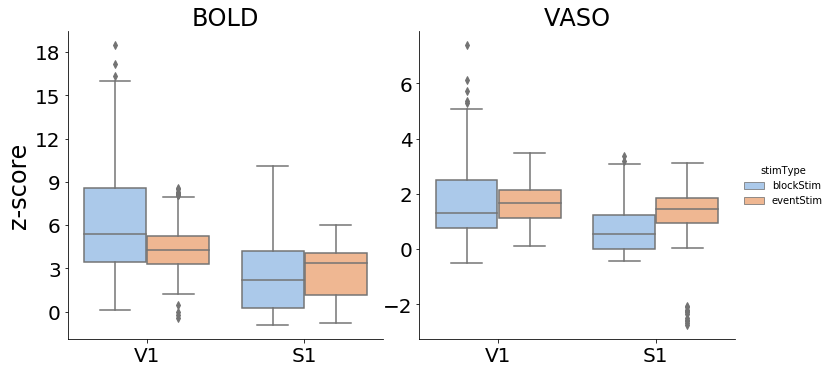

In [266]:
g = sns.catplot(x="focus", y="data",
                hue="stimType", col="modality",
                data=zscores, kind="box", sharey=False, palette='pastel')

    
    
g.axes[0,0].set_ylabel('z-score', fontsize=24)

g.axes[0,0].set_xlabel('', fontsize=24)
g.axes[0,1].set_xlabel('', fontsize=24)


g.axes[0,1].set_title('VASO', fontsize=24)
g.axes[0,0].set_title('BOLD', fontsize=24)

g.axes[0,0].set_xticklabels(['V1', 'S1'], fontsize=20)
g.axes[0,1].set_xticklabels(['V1', 'S1'], fontsize=20)

plt.setp(g.axes[0,0].get_yticklabels(), fontsize=20)
plt.setp(g.axes[0,1].get_yticklabels(), fontsize=20)

g.axes[0,0].yaxis.set_major_locator(MaxNLocator(integer=True))

# g.savefig("/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/comparingZscoresBoxPlt.png")

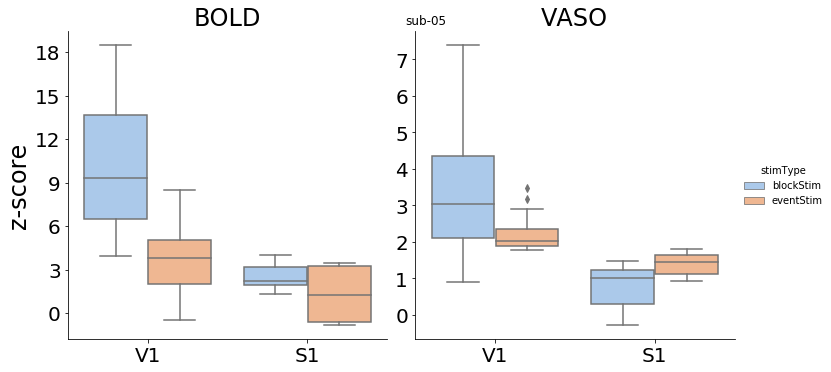

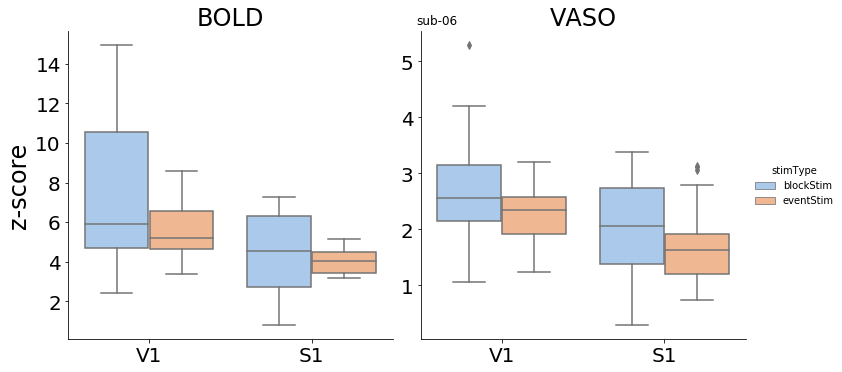

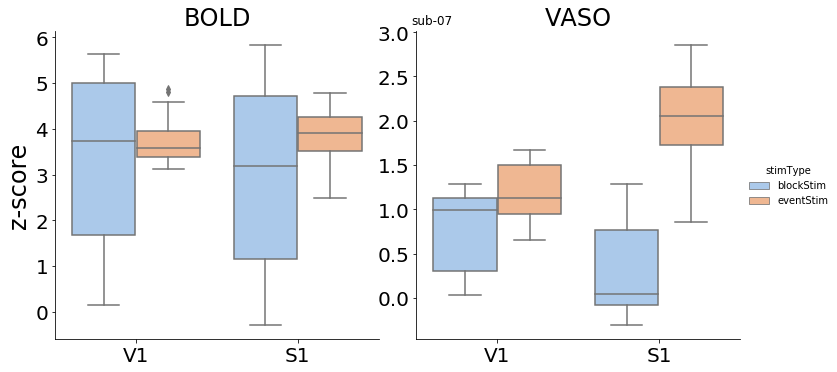

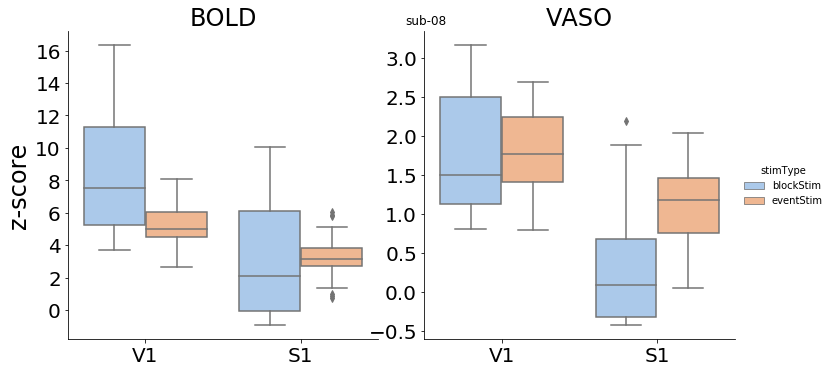

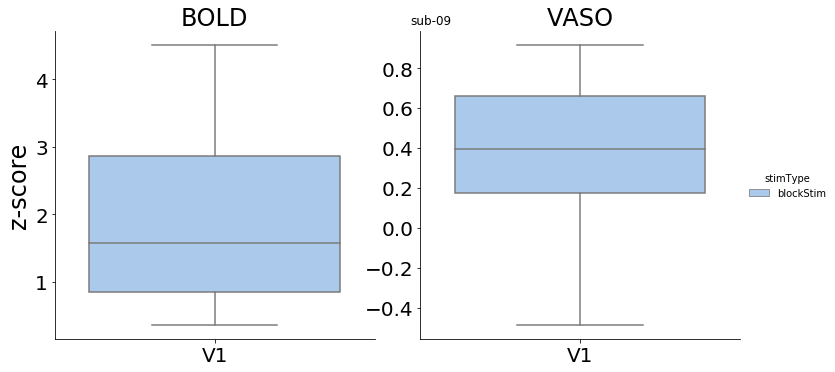

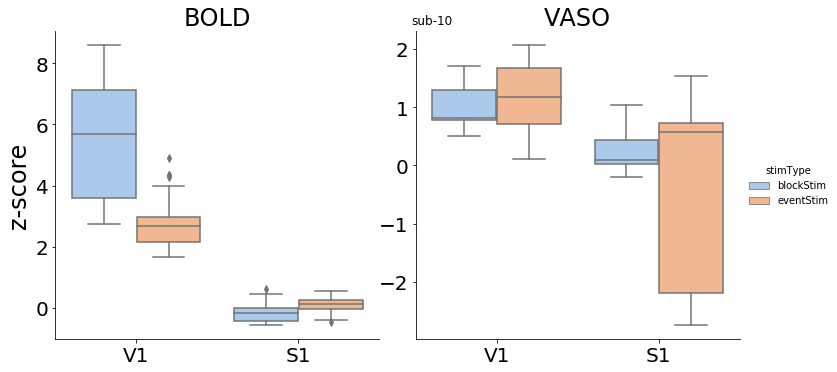

In [268]:
for sub in subs:
    
    g = sns.catplot(x="focus", y="data",
                hue="stimType", col="modality",
                data=zscores.loc[zscores['subject']==sub], kind="box", sharey=False, palette='pastel')

    

    g.axes[0,0].set_ylabel('z-score', fontsize=24)

    g.axes[0,0].set_xlabel('', fontsize=24)
    g.axes[0,1].set_xlabel('', fontsize=24)


    g.axes[0,1].set_title('VASO', fontsize=24)
    g.axes[0,0].set_title('BOLD', fontsize=24)

    g.axes[0,0].set_xticklabels(['V1', 'S1'], fontsize=20)
    g.axes[0,1].set_xticklabels(['V1', 'S1'], fontsize=20)

    plt.setp(g.axes[0,0].get_yticklabels(), fontsize=20)
    plt.setp(g.axes[0,1].get_yticklabels(), fontsize=20)

    g.axes[0,0].yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.suptitle(sub)

    # g.savefig("/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/comparingZscoresBoxPlt.png")

## sub-10 zscores

In [59]:
subList = []
dataList = []
modalityList = []
layerList = []
stimTypeList = []

# layers = {'1':'deep','2':'middle','3':'superficial'}

# subs = ['sub-08']
subs = ['sub-10']


for sub in subs:
    for stimType in ['blockStim', 'eventStim']:
    
        runs = sorted(glob.glob(f'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/{sub}/ses-001/func/{sub}_ses-001_task-{stimType}_run-00*_cbv.nii.gz'))

        for run in runs:

            base = os.path.basename(run).rsplit('.', 2)[0][:-4]
            print(base)
            mask = nb.load(f'{root}/{sub}/ses-001/v1Focus/{sub}_masks/{base}_11layers_layers_equidist.nii').get_fdata()

            for modality in ['BOLD','VASO']:
                data = nb.load(f'{root}/{sub}/ses-001/v1Focus/{base}_{modality}.feat/stats/zstat1_scaled.nii.gz').get_fdata()

                for j in range(1,12):  # Compute bin averages
                    layerRoi = mask == j
                    mask_mean = np.mean(data[layerRoi.astype(bool)])

                    subList.append(sub)
                    dataList.append(mask_mean)
                    modalityList.append(modality[:4])
                    layerList.append(j)
                    stimTypeList.append(stimType)



            
zscores = pd.DataFrame({'subject': subList, 'data': dataList, 'modality': modalityList, 'layer':layerList, 'stimType':stimTypeList})

sub-10_ses-001_task-blockStim_run-001
sub-10_ses-001_task-blockStim_run-002
sub-10_ses-001_task-eventStim_run-001
sub-10_ses-001_task-eventStim_run-002
sub-10_ses-001_task-eventStim_run-003


In [60]:
subList = []
dataList = []
modalityList = []
layerList = []
stimTypeList = []
focusList = []

# layers = {'1':'deep','2':'middle','3':'superficial'}

# subs = ['sub-06']
subs = ['sub-10']

# for focus in ['s1Focus']:
for focus in ['v1Focus', 's1Focus']:

    for sub in subs:
        for stimType in ['blockStim', 'eventStim']:

            runs = sorted(glob.glob(f'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/{sub}/ses-001/func/{sub}_ses-001_task-{stimType}_run-00*_cbv.nii.gz'))

            for run in runs:

                base = os.path.basename(run).rsplit('.', 2)[0][:-4]
                print(base)
                mask = nb.load(f'{root}/{sub}/ses-001/{focus}/{sub}_masks/{base}_11layers_layers_equidist.nii').get_fdata()

                

                    
                for modality in ['BOLD','VASO']:
                    data = nb.load(f'{root}/{sub}/ses-001/{focus}/{base}_{modality}.feat/stats/zstat1_scaled.nii.gz').get_fdata()

                    for j in range(1,12):  # Compute bin averages
                        layerRoi = mask == j
                        mask_mean = np.mean(data[layerRoi.astype(bool)])

                        subList.append(sub)
                        dataList.append(mask_mean)
                        modalityList.append(modality[:4])
                        layerList.append(j)
                        stimTypeList.append(stimType)
                        focusList.append(focus)

            
zscores = pd.DataFrame({'subject': subList, 'data': dataList, 'modality': modalityList, 'layer':layerList, 'stimType':stimTypeList, 'focus':focusList})

sub-10_ses-001_task-blockStim_run-001
sub-10_ses-001_task-blockStim_run-002
sub-10_ses-001_task-eventStim_run-001
sub-10_ses-001_task-eventStim_run-002
sub-10_ses-001_task-eventStim_run-003
sub-10_ses-001_task-blockStim_run-001
sub-10_ses-001_task-blockStim_run-002
sub-10_ses-001_task-eventStim_run-001


FileNotFoundError: No such file or no access: '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-10/ses-001/s1Focus/sub-10_masks/sub-10_ses-001_task-eventStim_run-001_11layers_layers_equidist.nii'

In [61]:
zscores = pd.DataFrame({'subject': subList, 'data': dataList, 'modality': modalityList, 'layer':layerList, 'stimType':stimTypeList, 'focus':focusList})

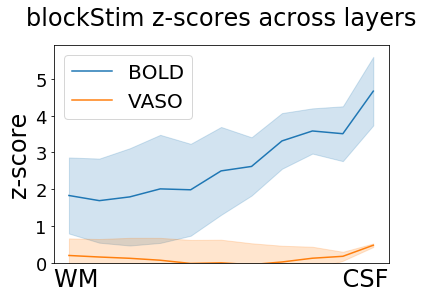

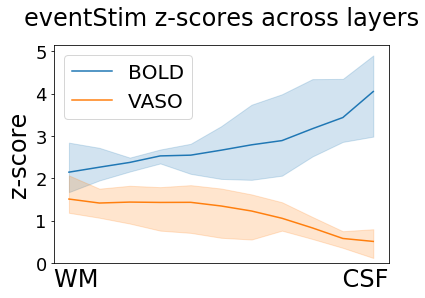

In [62]:
from matplotlib.ticker import MaxNLocator

# for focus in ['v1Focus', 's1Focus']:
for stimType in ['blockStim', 'eventStim']:
    fig, ax = plt.subplots()
    tmp = zscores.loc[(zscores['stimType']==stimType)&(zscores['focus']=='v1Focus')]

    sns.lineplot(data=tmp, x='layer', y='data', hue='modality')


    plt.ylabel('z-score', fontsize=24)
    
    plt.title(f"{stimType} z-scores across layers", fontsize=24, pad=20)
    plt.xlabel('WM                                CSF', fontsize=24)
    plt.xticks([])
    yLimits = ax.get_ylim()
    plt.ylim(0,yLimits[1])    

    plt.yticks(fontsize=18)

    ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    
    plt.legend(loc='upper left', fontsize=20)
    
    
    plt.savefig(f'{root}/Group_V1_{stimType}_zScoreProfile.png', bbox_inches = "tight")
    plt.show()

In [71]:
subList = []
dataList = []
modalityList = []
layerList = []
stimTypeList = []
focusList = []

# layers = {'1':'deep','2':'middle','3':'superficial'}

# subs = ['sub-06']
subs = ['sub-10']

# for focus in ['s1Focus']:
for focus in ['v1Focus', 's1Focus']:

    for sub in subs:
        for stimType in ['eventStimRandom']:

            runs = sorted(glob.glob(f'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/{sub}/ses-001/func/{sub}_ses-001_task-{stimType}_run-002_cbv.nii.gz'))

            for run in runs:

                base = os.path.basename(run).rsplit('.', 2)[0][:-4]
                print(base)
                mask = nb.load(f'{root}/{sub}/ses-001/{focus}/{sub}_masks/{base}_11layers_layers_equidist.nii').get_fdata()

                

                    
                for modality in ['BOLD','VASO']:
                    data = nb.load(f'{root}/{sub}/ses-001/{focus}/{base}_{modality}.feat/stats/zstat2_scaled.nii.gz').get_fdata()

                    for j in range(1,12):  # Compute bin averages
                        layerRoi = mask == j
                        mask_mean = np.mean(data[layerRoi.astype(bool)])

                        subList.append(sub)
                        dataList.append(mask_mean)
                        modalityList.append(modality[:4])
                        layerList.append(j)
                        stimTypeList.append(stimType)
                        focusList.append(focus)

            
zscores = pd.DataFrame({'subject': subList, 'data': dataList, 'modality': modalityList, 'layer':layerList, 'stimType':stimTypeList, 'focus':focusList})

sub-10_ses-001_task-eventStimRandom_run-002
sub-10_ses-001_task-eventStimRandom_run-002


FileNotFoundError: No such file or no access: '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-10/ses-001/s1Focus/sub-10_masks/sub-10_ses-001_task-eventStimRandom_run-002_11layers_layers_equidist.nii'

In [72]:
zscores = pd.DataFrame({'subject': subList, 'data': dataList, 'modality': modalityList, 'layer':layerList, 'stimType':stimTypeList, 'focus':focusList})

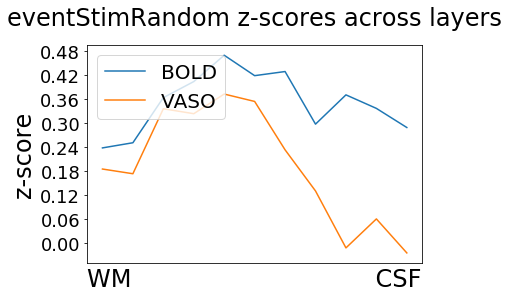

In [73]:
from matplotlib.ticker import MaxNLocator

# for focus in ['v1Focus', 's1Focus']:
for stimType in ['eventStimRandom']:
    fig, ax = plt.subplots()
    tmp = zscores.loc[(zscores['stimType']==stimType)&(zscores['focus']=='v1Focus')]

    sns.lineplot(data=tmp, x='layer', y='data', hue='modality')


    plt.ylabel('z-score', fontsize=24)
    
    plt.title(f"{stimType} z-scores across layers", fontsize=24, pad=20)
    plt.xlabel('WM                                CSF', fontsize=24)
    plt.xticks([])

    plt.yticks(fontsize=18)

    ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    
    plt.legend(loc='upper left', fontsize=20)
    
    
#     plt.savefig(f'{root}/Group_V1_{stimType}_zScoreProfile.png', bbox_inches = "tight")
    plt.show()

In [238]:
root = '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti'

subs = ['sub-10']

modalities = ['BOLD', 'VASO']


layerEventResults = {}

for focus, cmap in zip(['v1Focus'],['tab10']):
# for focus, cmap in zip(['v1Focus'],['tab10']):

    layerEventResults[focus] = {}
    for sub in subs:
        print(sub)

            
        layerEventResults[focus][sub] = {}

        runs = sorted(glob.glob(f'{root}/{sub}/ses-00*/func/{sub}_ses-00*_task-eventStimRandom_run-002_cbv.nii.gz'))

        for run in runs:

            base = os.path.basename(run).rsplit('.', 2)[0][:-4]
            print(base)

            
            layerEventResults[focus][sub][base] = {}
            
            try:
                box = find_roi_box(nb.load(f'{root}/derivatives/{sub}/{ses}/{focus}/{sub}_masks/{base}_rim.nii.gz').get_fdata())
            except:
                box = find_roi_box(nb.load(f'{root}/derivatives/{sub}/{ses}/{focus}/{sub}_masks/{base}_rim.nii').get_fdata())
            
            mask = nb.load(f'{root}/derivatives/{sub}/{ses}/{focus}/{sub}_masks/{base}_3layers_layers_equidist.nii')
            mask = np.asarray(mask.dataobj[box[0], box[1], box[2]])
            
            idx_layers = np.unique(mask.astype("int"))
            idx_layers = idx_layers[1:]

            for modality in modalities:
                print(modality)
                layerEventResults[focus][sub][base][modality] = {}

                skippedTrials = 0


                run = f'{root}/derivatives/{sub}/{ses}/{focus}/{base}_{modality}_slice.nii'

                Nii = nb.load(run)
                # As before, get the data as an array.
                data = Nii.get_fdata()[:,:,:,:-2]
                # load the nifty-header to get some meta-data.
                header = Nii.header

                # As the number of volumes which is the 4th position of
                # get_shape. This seems to be unused so I will comment it out to check.
                # nr_volumes = int(header.get_data_shape()[3])

                # Or the TR, which is the 4th position of get_zooms().
                tr = header.get_zooms()[3]

                 # Get scan duration in s
                runTime = data.shape[-1]*tr

                # Load information on run-wise motion
                FDs = pd.read_csv(f'{root}/derivatives/{sub}/{ses}/v1Focus/motionParameters/{sub}_FDs.csv')

                # Because we want the % signal-change, we need the mean
                # of the voxel we are looking at. This is done with
                # some fancy matrix operations.
                
                for stimulation in ['visual', 'visiotactile']:
                    layerEventResults[focus][sub][base][modality][stimulation] = {}
                    
                    events = pd.read_csv(f'{root}/derivatives/{sub}/{ses}/events/{base}_{stimulation}.txt', sep = ' ', names = ['start','duration','trialType'])[:-1]


                    for j in idx_layers:  # Compute bin averages

                        layerEventResults[focus][sub][base][modality][stimulation][f'layer {j}'] = {}

                        layerRoi = mask == j



                        mask_mean = np.mean(data[:, :, :]
                                            [layerRoi.astype(bool)])

                        includedTrials = []

                        for i, row in events.iterrows():


                            onset = round(row['start']/tr)
                            # Do the same for the offset
                            offset = round(onset + row['duration']/tr)


                            # truncate motion data to event
                            tmp = FDs.loc[(FDs['volume']>=(onset-2)/2)&(FDs['volume']<=(offset+2)/2)&(FDs['run'].str.contains(f'{base}[-17:]'))]


                            if not (tmp['FD']>=2).any():

                                layerEventResults[focus][sub][base][modality][stimulation][f'layer {j}'][f'trial {i}'] = np.mean((((data[:, :, :, int(onset-4):int(offset+ 8)][layerRoi.astype(bool)]) / mask_mean)- 1) * 100,axis=0)
                                includedTrials.append(f'trial {i}')



sub-10
sub-10_ses-001_task-eventStimRandom_run-002
BOLD
VASO


In [240]:
layerEventResults

{'v1Focus': {'sub-10': {'sub-10_ses-001_task-eventStimRandom_run-002': {'BOLD': {'visual': {'layer 1': {'trial 0': array([ 2.75095648,  3.92682849,  3.65173917,  2.23793587,  0.43217524,
              -0.7341076 , -0.60765042,  0.65452412,  2.43271589,  3.52288469,
               3.0128607 ,  1.97603166,  1.59606078,  1.28441275]),
       'trial 1': array([2.06952607, 1.60505063, 3.50550432, 5.09011472, 3.76620989,
              2.30625871, 3.4737402 , 5.2399455 , 5.28849068, 4.04010057,
              2.33622487, 0.9595796 , 0.52626897, 1.51395351]),
       'trial 2': array([5.28849068, 4.04010057, 2.33622487, 0.9595796 , 0.52626897,
              1.51395351, 3.86809482, 5.47428085, 4.64361897, 2.88100961,
              2.07312201, 2.65146884, 4.48779496, 5.63130351]),
       'trial 3': array([ 0.26256679,  0.45614816,  1.09862257,  1.64760257,  1.68296264,
               1.44563067,  1.40427738,  1.16514744,  0.485515  , -0.37211642,
              -1.04515631, -1.0343685 , -0.06466365

In [246]:
subList = []
dataList = []
xList = []
modalityList = []
trialList = []
runList = []
layerList = []
focusList = []
conditionList = []

layers = {'1':'deep','2':'middle','3':'superficial'}


for focus, cmap in zip(['v1Focus'],['tab10']):
    for sub in subs:
        print(sub)

        runs = sorted(glob.glob(f'{root}/{sub}/ses-00*/func/{sub}_ses-00*_task-eventStimRandom_run-002_cbv.nii.gz'))

        for run in runs:

            base = os.path.basename(run).rsplit('.', 2)[0][:-4]
            print(base)

                
            for modality in modalities:
                print(modality)
                for stimulation in ['visual', 'visiotactile']:
                    

                    for j in range(1, 4):

                        subTrials = []
                        for key, value in layerEventResults[focus][sub][base][modality][stimulation][f'layer {j}'].items():
                            subTrials.append(key)

                        for trial in subTrials[:-1]:

                            for n in range(len(layerEventResults[focus][sub][base][modality][stimulation][f'layer {j}'][trial])):

                                if modality == "BOLD":
                                    dataList.append(layerEventResults[focus][sub][base][modality][stimulation][f'layer {j}'][trial][n])

                                if modality == "VASO":
                                    dataList.append(-layerEventResults[focus][sub][base][modality][stimulation][f'layer {j}'][trial][n])

                                modalityList.append(modality)
                                trialList.append(trial)
                                runList.append(base)
                                xList.append(n)
                                subList.append(sub)
                                layerList.append(layers[str(j)])
                                focusList.append(focus)
                                conditionList.append(stimulation)


layerEventData = pd.DataFrame({'subject': subList,'x':xList, 'data': dataList, 'modality': modalityList, 'trial': trialList, 'run':runList, 'layer':layerList, 'focus': focusList, 'condition':conditionList})

sub-10
sub-10_ses-001_task-eventStimRandom_run-002
BOLD
VASO


In [250]:
layerEventData

,subject,x,data,modality,trial,run,layer,focus,condition
0,sub-10,0,2.750956,BOLD,trial 0,sub-10_ses-001_task-eventStimRandom_run-002,deep,v1Focus,visual
1,sub-10,1,3.926828,BOLD,trial 0,sub-10_ses-001_task-eventStimRandom_run-002,deep,v1Focus,visual
2,sub-10,2,3.651739,BOLD,trial 0,sub-10_ses-001_task-eventStimRandom_run-002,deep,v1Focus,visual
3,sub-10,3,2.237936,BOLD,trial 0,sub-10_ses-001_task-eventStimRandom_run-002,deep,v1Focus,visual
4,sub-10,4,0.432175,BOLD,trial 0,sub-10_ses-001_task-eventStimRandom_run-002,deep,v1Focus,visual
5,sub-10,5,-0.734108,BOLD,trial 0,sub-10_ses-001_task-eventStimRandom_run-002,deep,v1Focus,visual
6,sub-10,6,-0.607650,BOLD,trial 0,sub-10_ses-001_task-eventStimRandom_run-002,deep,v1Focus,visual
7,sub-10,7,0.654524,BOLD,trial 0,sub-10_ses-001_task-eventStimRandom_run-002,deep,v1Focus,visual
8,sub-10,8,2.432716,BOLD,trial 0,sub-10_ses-001_task-eventStimRandom_run-002,deep,v1Focus,visual
9,sub-10,9,3.522885,BOLD,trial 0,sub-10_ses-001_task-eventStimRandom_run-002,deep,v1Focus,visual


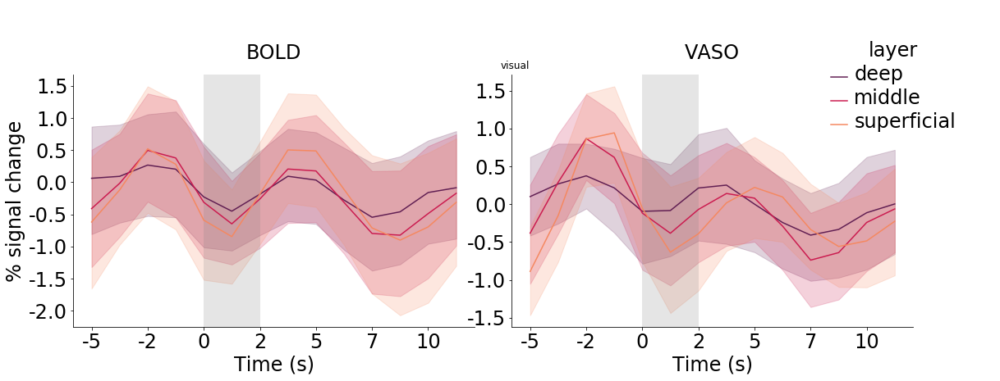

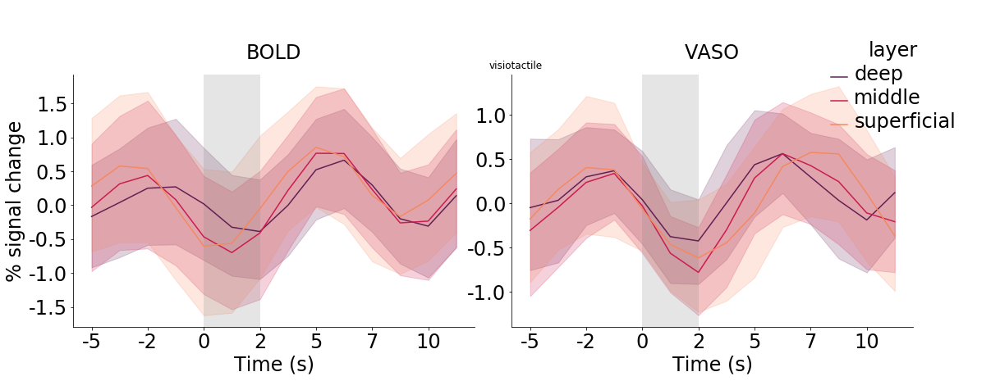

In [253]:

for focus, cmap in zip(['v1Focus'],['tab10']):
    for stimulation in ['visual', 'visiotactile']:
    
        g = sns.FacetGrid(layerEventData.loc[layerEventData['condition']==stimulation], col="modality", hue="layer", sharey=False, height= 5, aspect = 1.5,palette='rocket')
        g.map_dataframe(sns.lineplot, x="x", y="data")
        g.add_legend(bbox_to_anchor = (1, 1), borderaxespad = 0)


        g.axes[0,0].set_ylabel('% signal change', fontsize=24)

        g.axes[0,1].set_xlabel('Time (s)', fontsize=24)
        g.axes[0,0].set_xlabel('Time (s)', fontsize=24)


        g.axes[0,1].set_title('VASO', fontsize=24, pad=20)
        g.axes[0,0].set_title('BOLD', fontsize=24, pad=20)


        g.axes[0,0].axvspan(4, 4 + (2), color='grey', alpha=0.2, lw=0, label = 'stimulation on')
        g.axes[0,1].axvspan(4, 4 + (2), color='grey', alpha=0.2, lw=0, label = 'stimulation on')


        plt.setp(g._legend.get_title(), fontsize=24)
        plt.setp(g._legend.get_texts(), fontsize=24)



        values = (np.arange(-4,len(layerEventResults[focus]['sub-10']['sub-10_ses-001_task-eventStimRandom_run-002']['BOLD']['visual'][f'layer {3}']['trial 1'])-4,2)*tr).astype(int)
        spacing = np.arange(0,len(layerEventResults[focus]['sub-10']['sub-10_ses-001_task-eventStimRandom_run-002']['BOLD']['visual'][f'layer {3}']['trial 1']),2)



        g.axes[0,0].set_xticks(spacing)

        g.axes[0,0].set_xticklabels(values,fontsize=24)
        g.axes[0,1].set_xticklabels(values,fontsize=24)


        plt.setp(g.axes[0,0].get_yticklabels(), fontsize=24)
        plt.setp(g.axes[0,1].get_yticklabels(), fontsize=24)


        g.axes[0,0].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
        g.axes[0,1].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
        plt.suptitle(stimulation)

    #     g.savefig(f"{root}/eventResults{focus}LayersModalityVsLayers.png")
        plt.show()

### extract betas

In [256]:
subList = []
dataList = []
modalityList = []
layerList = []
stimTypeList = []
focusList = []
baseList = []

# layers = {'1':'deep','2':'middle','3':'superficial'}

# subs = ['sub-08']
subs = ['sub-05', 'sub-06', 'sub-07', 'sub-08']

for focus in ['v1Focus', 's1Focus']:
# for focus in ['s1Focus']:
    for sub in subs:
#         for stimType in ['eventStim']:
#         for stimType in ['blockStim']:
        for stimType in ['blockStim', 'eventStim']:

            runs = sorted(glob.glob(f'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/{sub}/ses-001/func/{sub}_ses-001_task-{stimType}_run-00*_cbv.nii.gz'))

            for run in runs:

                base = os.path.basename(run).rsplit('.', 2)[0][:-4]
                print(base)
                mask = nb.load(f'{root}/{sub}/ses-001/{focus}/{sub}_masks/{base}_11layers_layers_equidist.nii').get_fdata()

                for modality in ['BOLD_intemp','VASO']:
                    data = nb.load(f'{root}/{sub}/ses-001/{focus}/{base}_{modality}.feat/stats/pe1_scaled.nii.gz').get_fdata()

                    for j in range(1,12):  # Compute bin averages
                        layerRoi = mask == j
                        mask_mean = np.mean(data[layerRoi.astype(bool)])

                        subList.append(sub)
                        if modality == 'VASO':
                            dataList.append(-mask_mean)
                        if modality == 'BOLD_intemp':
                            dataList.append(mask_mean)
                        modalityList.append(modality)
                        layerList.append(j)
                        stimTypeList.append(stimType)
                        focusList.append(focus)
                        baseList.append(base)



            
betaScores = pd.DataFrame({'subject': subList, 'data': dataList, 'modality': modalityList, 'layer':layerList, 'stimType':stimTypeList, 'focus':focusList, 'run':baseList})

sub-05_ses-001_task-blockStim_run-001
sub-05_ses-001_task-blockStim_run-002
sub-05_ses-001_task-eventStim_run-001
sub-05_ses-001_task-eventStim_run-002
sub-06_ses-001_task-blockStim_run-001
sub-06_ses-001_task-blockStim_run-002
sub-06_ses-001_task-eventStim_run-001
sub-06_ses-001_task-eventStim_run-002
sub-06_ses-001_task-eventStim_run-003
sub-06_ses-001_task-eventStim_run-004
sub-07_ses-001_task-blockStim_run-001
sub-07_ses-001_task-blockStim_run-002
sub-07_ses-001_task-eventStim_run-001
sub-07_ses-001_task-eventStim_run-002
sub-07_ses-001_task-eventStim_run-003
sub-07_ses-001_task-eventStim_run-004
sub-08_ses-001_task-blockStim_run-001
sub-08_ses-001_task-blockStim_run-002
sub-08_ses-001_task-eventStim_run-001
sub-08_ses-001_task-eventStim_run-002
sub-08_ses-001_task-eventStim_run-003
sub-08_ses-001_task-eventStim_run-004
sub-05_ses-001_task-blockStim_run-001
sub-05_ses-001_task-blockStim_run-002
sub-05_ses-001_task-eventStim_run-001
sub-05_ses-001_task-eventStim_run-002
sub-06_ses-0

In [190]:
subList = []
dataList = []
modalityList = []
layerList = []
stimTypeList = []
focusList = []
baseList = []

# layers = {'1':'deep','2':'middle','3':'superficial'}

subs = ['sub-06']
# subs = ['sub-05', 'sub-06', 'sub-07', 'sub-08']

# for focus in ['v1Focus', 's1Focus']:
for focus in ['s1Focus']:
    for sub in subs:
        for stimType in ['eventStim']:
#         for stimType in ['blockStim']:
#         for stimType in ['blockStim', 'eventStim']:

            runs = sorted(glob.glob(f'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/{sub}/ses-001/func/{sub}_ses-001_task-{stimType}_run-001_cbv.nii.gz'))

            for run in runs:

                base = os.path.basename(run).rsplit('.', 2)[0][:-4]
                print(base)
                mask = nb.load(f'{root}/{sub}/ses-001/{focus}/test_mask_event.nii.gz').get_fdata()

                for modality in ['BOLD_intemp','VASO']:
                    data = nb.load(f'{root}/{sub}/ses-001/{focus}/{base}_{modality}.feat/stats/cope1.nii.gz').get_fdata()

#                     for j in range(1,12):  # Compute bin averages
#                         layerRoi = mask == j
                    mask_mean = np.mean(data[mask.astype(bool)])

                    subList.append(sub)
                    dataList.append(mask_mean)
                    modalityList.append(modality)
#                     layerList.append(j)
                    stimTypeList.append(stimType)
                    focusList.append(focus)
                    baseList.append(base)



            
eventbetaScores = pd.DataFrame({'subject': subList, 'data': dataList, 'modality': modalityList, 'stimType':stimTypeList, 'focus':focusList, 'run':baseList})

sub-06_ses-001_task-eventStim_run-001


In [191]:
eventtmp = eventbetaScores.loc[(eventbetaScores['run']=='sub-06_ses-001_task-eventStim_run-001')]
sns.lineplot(data=eventtmp, x='layer', y='data', hue='modality',palette='Dark2')

ValueError: Could not interpret value `layer` for parameter `x`

In [194]:
meanBOLDevent = (np.mean(eventtmp['data'].loc[eventtmp['modality']=='BOLD_intemp']))
meanBOLDevent

1204.733142609292

In [195]:
meanVASOevent = (np.mean(eventtmp['data'].loc[eventtmp['modality']=='VASO']))
meanVASOevent

214.4499222775723

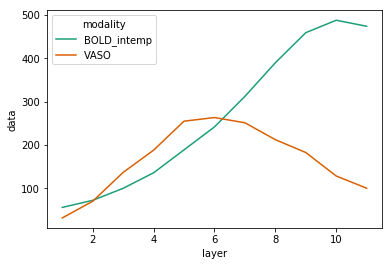

In [252]:
tmp = betaScores.loc[(betaScores['run']=='sub-06_ses-001_task-blockStim_run-001')]
sns.lineplot(data=tmp, x='layer', y='data', hue='modality',palette='Dark2')

In [180]:
meanBOLD = (np.mean(tmp['data'].loc[tmp['modality']=='BOLD_intemp']))*100
meanBOLD

3.12183339300953

In [181]:
meanVASO = (np.mean(tmp['data'].loc[tmp['modality']=='VASO']))*100
meanVASO

2.1279848107097132

In [ ]:
# for focus in ['v1Focus', 's1Focus']:
for stimType in ['blockStim', 'eventStim']:
    
    tmp = betaScores.loc[(betaScores['stimType']==stimType)]

    sns.lineplot(data=tmp, x='layer', y='data', hue='modality',palette='Dark2')


    plt.ylabel('Parameter Estimate', fontsize=15)
    plt.xlabel('cortical depth', fontsize=15)
    plt.title(f"Group {stimType} PEs across layers", fontsize=20)
    plt.xlabel('WM                                                         CSF')
    plt.xticks([])
    plt.legend(loc='upper left')
    plt.savefig(f'{root}/Group_S1_{stimType}_PEsProfile.png')
    plt.show()

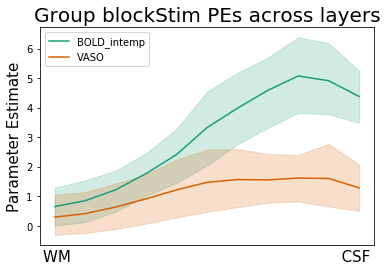

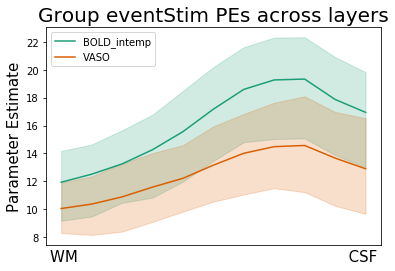

In [254]:
# for focus in ['v1Focus', 's1Focus']:
for stimType in ['blockStim', 'eventStim']:

    tmp = betaScores.loc[(betaScores['stimType']==stimType)]

    sns.lineplot(data=tmp, x='layer', y='data', hue='modality',palette='Dark2')


    plt.ylabel('Parameter Estimate', fontsize=15)
    plt.xlabel('cortical depth', fontsize=15)
    plt.title(f"Group {stimType} PEs across layers", fontsize=20)
    plt.xlabel('WM                                                         CSF')
    plt.xticks([])
    plt.legend(loc='upper left')
    plt.savefig(f'{root}/Group_S1_{stimType}_PEsProfile.png')
    plt.show()

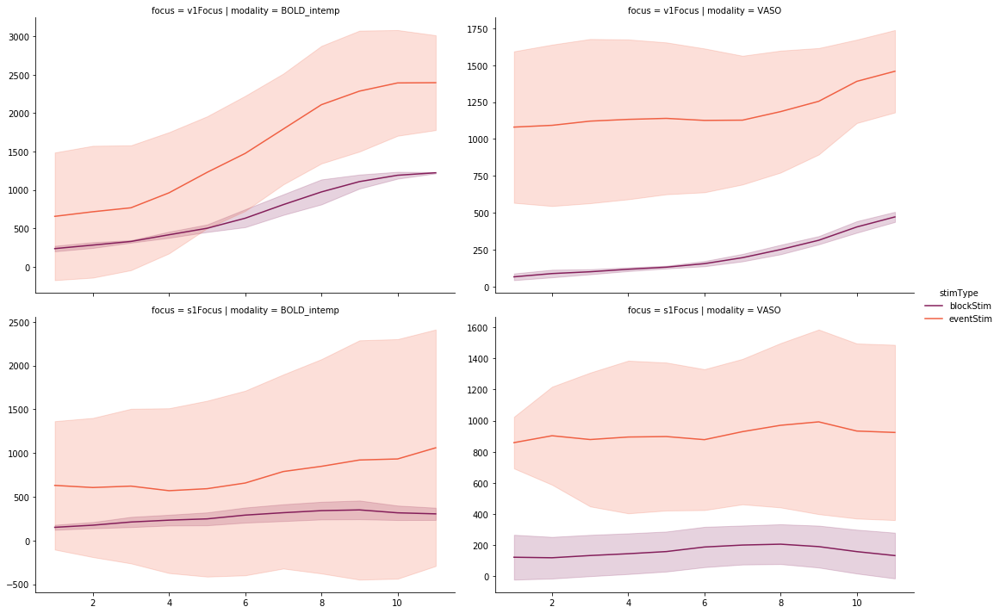

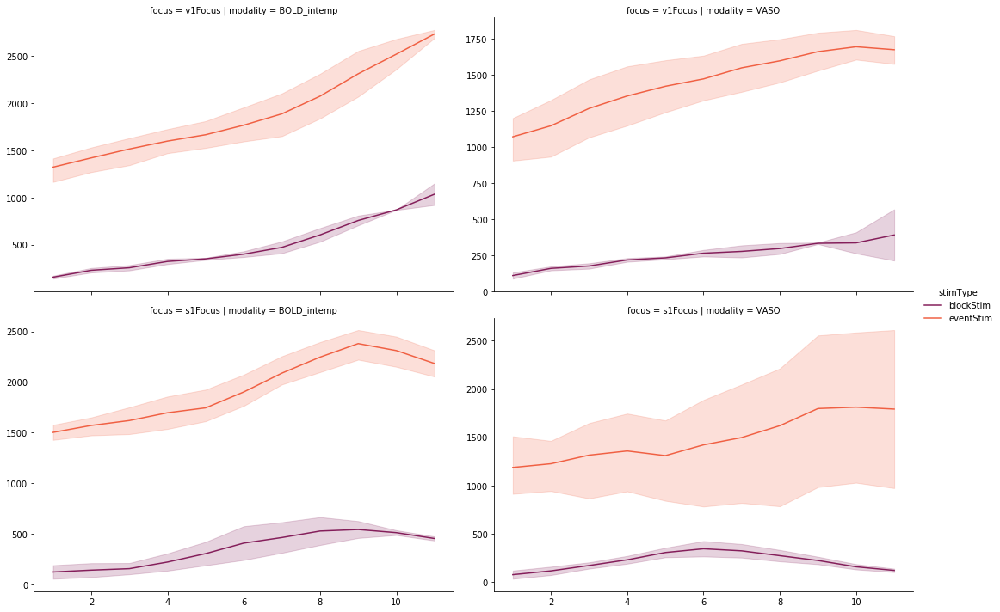

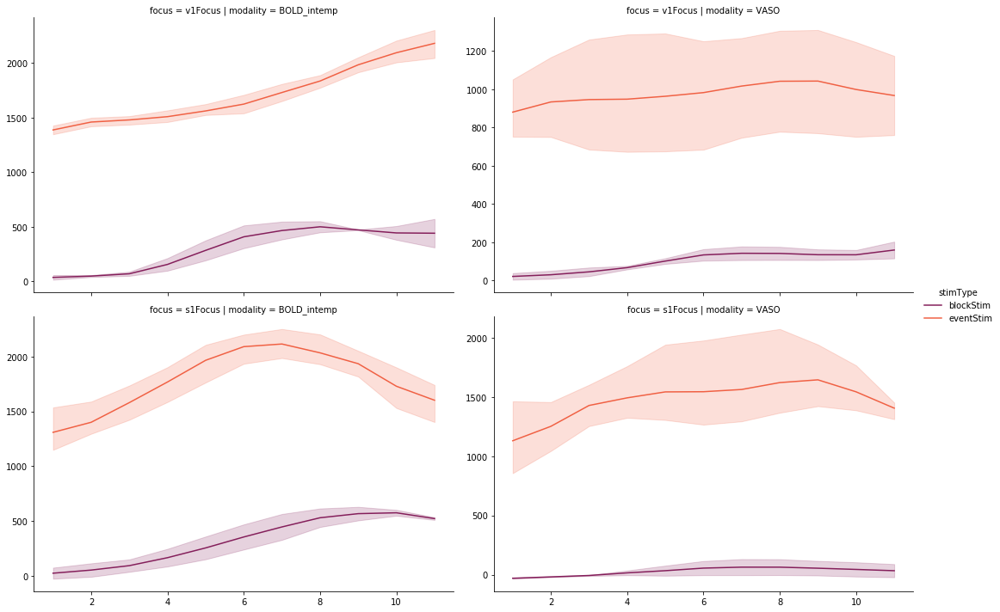

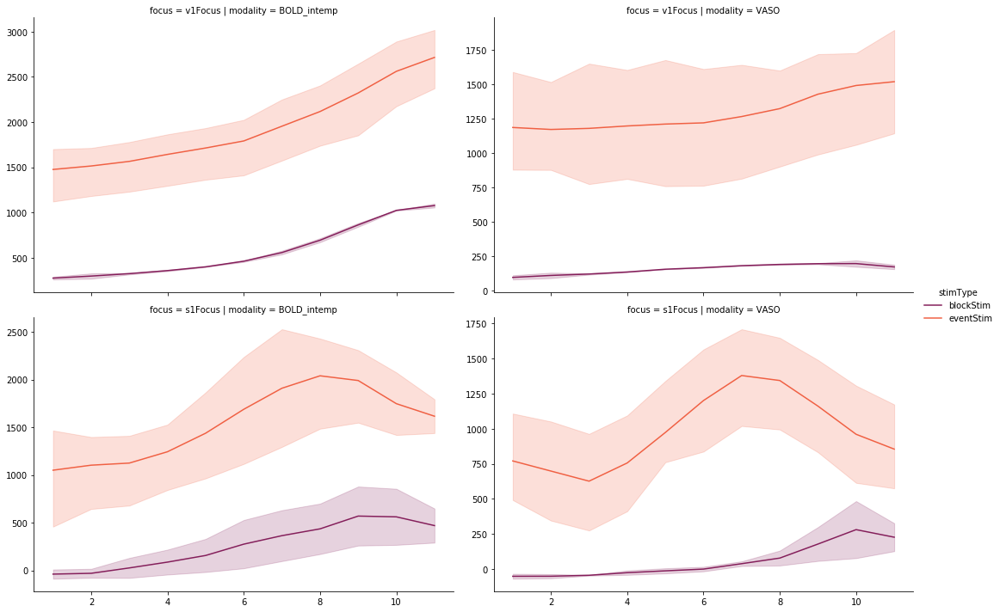

In [262]:
for sub in subs:
    tmp = betaScores.loc[betaScores['subject']==sub]
    g = sns.FacetGrid(tmp, col="modality",row='focus', hue="stimType", sharey=False, height= 5, aspect = 1.5,palette='rocket')
    g.map_dataframe(sns.lineplot, x="layer", y="data")
    g.add_legend()

In [ ]:
from random import seed
from random import choice


import nibabel as nb
import numpy as np
import imageio
import scipy
from scipy import ndimage
import os

cmap = cm.get_cmap('Dark2')
folder = '/home/sebastian/Desktop/test/s1Focus'


seed(1)

for sub in subs:
    

    subTrials = []
    for key, value in singleEventResults[sub]['BOLD_intemp']['run 1'].items():
        subTrials.append(key)


    includedTrials = []

    for n in range(40):
        fig = plt.figure()

        # choose a random trial
        selection = choice(subTrials)
        # remove that trial from the list of possible trials
        subTrials.remove(selection)

        includedTrials.append(selection)

        tmpBOLD = singleEventResults[sub]['BOLD_intemp']['run 1'][includedTrials[0]]
        tmpVASO = singleEventResults[sub]['VASO_LN']['run 1'][includedTrials[0]]

        for trial in range(0,len(includedTrials)):
                tmpBOLD = np.vstack((tmpBOLD, singleEventResults[sub]['BOLD_intemp']['run 1'][includedTrials[trial]]))
                tmpVASO = np.vstack((tmpVASO, singleEventResults[sub]['VASO_LN']['run 1'][includedTrials[trial]]))


        tmpVASO = np.mean(tmpVASO, axis=0)
        tmpBOLD = np.mean(tmpBOLD, axis=0)



        plt.plot(tmpBOLD, label = 'BOLD', color=cmap.colors[0])
        plt.plot(-tmpVASO, label = 'absolute VASO', color=cmap.colors[1])
        plt.axvspan(4, len(singleEventResults[sub]['BOLD_intemp']['run 1'][f'trial 1'])-8, color='grey', alpha=0.2, lw=0, label = 'stimulation on')
        plt.ylabel('% signal change')
        plt.xlabel('TR')
        plt.ylim(-1.5,1.5) 
        plt.title(f"{sub} Average of {n+1} trials")
        plt.savefig(f'{folder}/{sub}_eventRelatedAveragesOf{str(n+1).zfill(2)}Trials.png')
        plt.show()


In [ ]:
import nibabel as nb
import numpy as np
import imageio
import scipy
from scipy import ndimage
import os


for sub in subs:
    

    files = sorted(glob.glob(f'{folder}/{sub}*Trials.png'))
    images = []
    for file in files:
        images.append(imageio.imread(file))


    imageio.mimsave(f'{folder}/{sub}_movie.gif', images, duration = 1/0.75)
    
    
import os
[os.remove(f'{folder}/{file}') for file in os.listdir(folder) if file.endswith('.png')]


In [ ]:
cmap = cm.get_cmap('Dark2')

for sub in subs:
    

    plt.plot(singleEventResults[sub]['BOLD_intemp']['average'], label = 'BOLD', color=cmap.colors[0])
    plt.plot(-singleEventResults[sub]['VASO_LN']['average'], label = 'absolute VASO', color=cmap.colors[1])
    # plt.axvline(4, 0,2.8, color = 'r', label= f"stim onset")
    # plt.axvline(6, 0,2.8, color = 'g', label= f"stim offset")

    plt.axvspan(4, len(singleEventResults[sub]['BOLD_intemp']['average'])-8, color='grey', alpha=0.2, lw=0, label = 'stimulation on')
    plt.ylabel('% signal change')
    plt.xlabel('TR')
    plt.title(f"{sub} Event-Related Average S1")
    plt.legend()
    plt.savefig(root + f'/derivatives/{sub}/ses-001/s1Focus/mocoToEachRun/trunc/{sub}_eventResultsS1.png')
    plt.show()

In [ ]:
subList = []
dataList = []
xList = []
modalityList = []

for sub in subs:

    for modality in modalities:
        
        for n in range(len(singleEventResults[sub][modality]['average'])):
            
            xList.append(n)
            subList.append(sub)
            if modality == "BOLD_intemp":
                dataList.append(singleEventResults[sub][modality]['average'][n])
                
            if modality == "VASO_LN":
                dataList.append(-singleEventResults[sub][modality]['average'][n])
            
            modalityList.append(modality)
        

data = pd.DataFrame({'subject': subList,'x':xList, 'data': dataList, 'modality': modalityList})

In [ ]:

sns.lineplot(data=data, x='x', y='data', hue='modality', palette='Dark2')


plt.axvspan(4, len(singleEventResults[sub]['BOLD_intemp']['average'])-8, color='grey', alpha=0.2, lw=0, label = 'stimulation on')
plt.ylabel('% signal change')
plt.xlabel('TR')
plt.title(f"Group Event-Related Average S1")
plt.legend()
plt.savefig(root + f'/derivatives/eventResultsS1.png')
plt.show()

In [ ]:

subs = ['sub-05', 'sub-06', 'sub-07', 'sub-08']
# subs = ['sub-05']
modalities = ['BOLD_intemp', 'VASO_LN']

eventResults = {}

singleEventResults = {}

for sub in subs:
    print(sub)
    numberOfRuns = len(glob.glob(root + f'/{sub}/ses-00*/func/{sub}_ses-00*_task-eventStim*_cbv.nii.gz'))
    print(f'found {numberOfRuns} runs')
    

    eventResults[sub] = {}
    singleEventResults[sub] = {}

    mask = nb.load(f'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/{sub}/ses-001/v1Focus/visualMaskNoCSF.nii.gz').get_fdata()


    for modality in modalities:
        singleEventResults[sub][modality] = {}

        for n in range(1,numberOfRuns+1):
            singleEventResults[sub][modality][f'run {n}'] = {}
            
            skippedTrials = 0

            run = f'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/{sub}/ses-001/v1Focus/{sub}_ses-001_task-eventStim_run-00{n}_{modality}.nii'

            Nii = nb.load(run)
            # As before, get the data as an array.
            data = Nii.get_fdata()[:,:,:,:-2]
            # load the nifty-header to get some meta-data.
            header = Nii.header

            # As the number of volumes which is the 4th position of
            # get_shape. This seems to be unused so I will comment it out to check.
            # nr_volumes = int(header.get_data_shape()[3])

            # Or the TR, which is the 4th position of get_zooms().
            tr = header.get_zooms()[3]

             # Get scan duration in s
            runTime = data.shape[-1]*tr

            events = pd.read_csv(f'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/{sub}/ses-001/events/{sub}_ses-001_task-eventStim_run-00{n}.txt', sep = ' ', names = ['start','duration','trialType'])[:-1]
            
            # Load information on run-wise motion
            FDs = pd.read_csv(root + f'/derivatives/{sub}/ses-001/v1Focus/motionParameters/{sub}_FDs.csv')

            # Because we want the % signal-change, we need the mean
            # of the voxel we are looking at. This is done with
            # some fancy matrix operations.
            mask_mean = np.mean(data[:, :, :]
                                [mask.astype(bool)])

            includedTrials = []
            
            for i, row in events.iterrows():
                
                
                onset = round(row['start']/tr)
                # Do the same for the offset
                offset = round(onset + row['duration']/tr)
                
                
                # truncate motion data to event
                tmp = FDs.loc[(FDs['volume']>=(onset-2)/2)&(FDs['volume']<=(offset+2)/2)&(FDs['run'].str.contains(f'run-00{n}'))]

                
                if not (tmp['FD']>=2).any():
                
#                     trialwise_activity.append(np.mean((((data[:, :, :, int(onset-4):int(offset+ 8)][mask.astype(bool)]) / mask_mean)- 1) * 100,axis=0))
                    singleEventResults[sub][modality][f'run {n}'][f'trial {i}'] = np.mean((((data[:, :, :, int(onset-4):int(offset+ 8)][mask.astype(bool)]) / mask_mean)- 1) * 100,axis=0)
                    includedTrials.append(f'trial {i}')
            
            
            
            
            
            
            
            collapseTrials = singleEventResults[sub][modality][f'run {n}']['trial 0']

            for trial in includedTrials[1:]:
                collapseTrials = np.vstack((collapseTrials, singleEventResults[sub][modality][f'run {n}'][trial]))   
                
            
            singleEventResults[sub][modality][f'run {n}']['average'] = np.mean(collapseTrials, axis=0)
            
            
        collapseRuns = singleEventResults[sub][modality][f'run 1']['average']

        for x in range(2,len(singleEventResults[sub][modality])+1):
            collapseRuns = np.vstack((collapseRuns, singleEventResults[sub][modality][f'run {x}'][f'average']))   


        singleEventResults[sub][modality]['average'] = np.mean(collapseRuns, axis=0)



In [ ]:
# choose a random element from a list
from random import seed
from random import choice
# seed random number generator
seed(1)


# make choices from the sequence
for _ in range(5):
    selection = choice(subTrials)
    print(selection)

In [ ]:
eventData.loc[(eventData['subject']==sub)&('run-001' in eventData['run'])]

sub-05


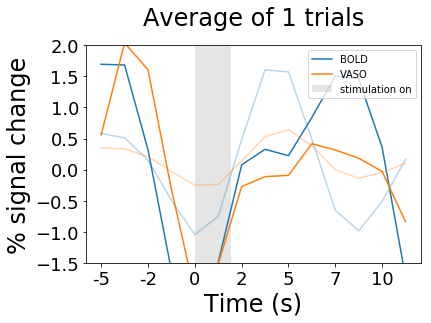

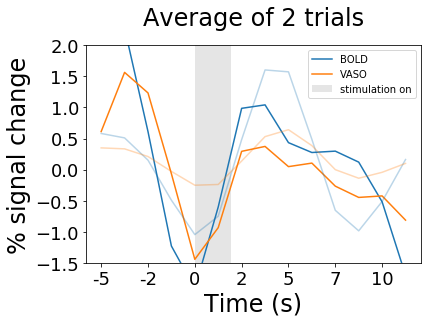

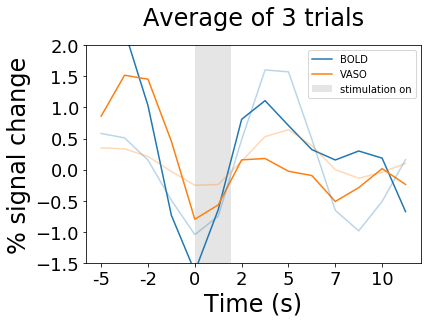

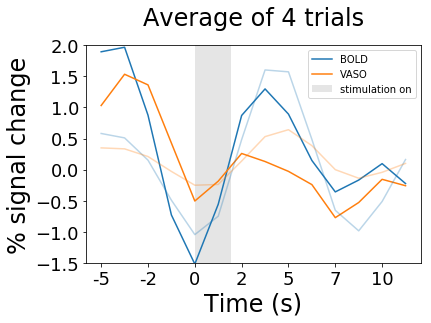

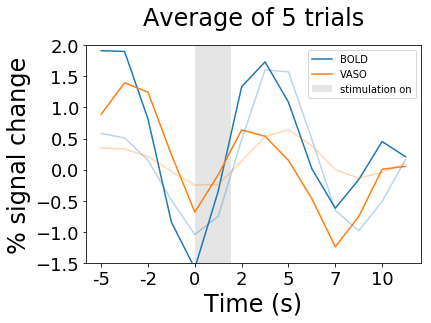

...

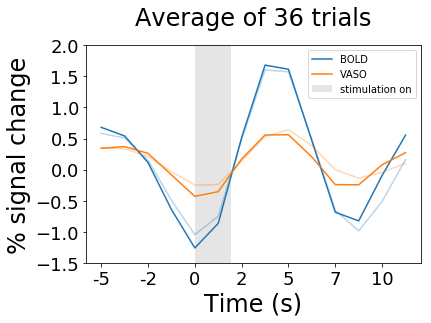

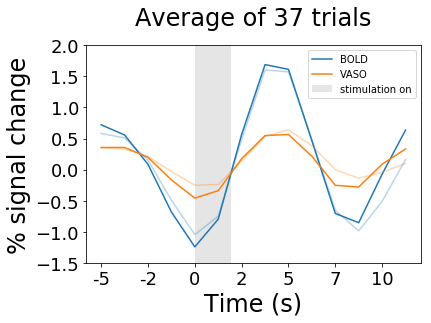

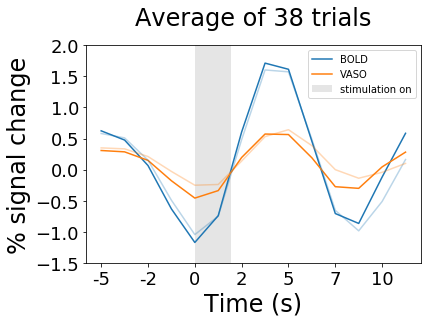

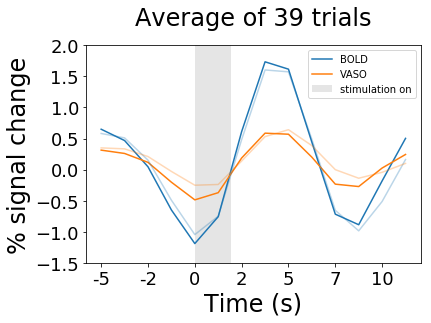

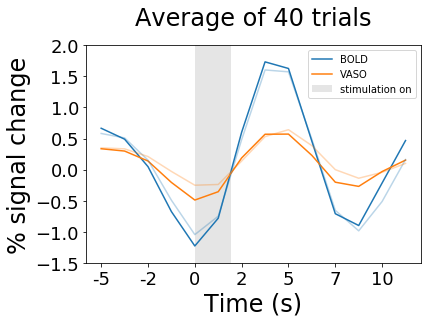

In [291]:
from random import seed
from random import choice


import nibabel as nb
import numpy as np
import imageio
import scipy
from scipy import ndimage
import os


folder = '/home/sebastian/Desktop/test'


seed(5)

for sub in subs[:1]:
    print(sub)

    subTrials = []
    for key, value in eventResults['v1Focus'][sub][f'{sub}_ses-001_task-eventStim_run-001']['BOLD'].items():
        subTrials.append(key)


    includedTrials = []

    for n in range(40):
        fig = plt.figure()

        # choose a random trial
        selection = choice(subTrials)
        # remove that trial from the list of possible trials
        subTrials.remove(selection)

        includedTrials.append(selection)

        tmpBOLD = eventResults['v1Focus'][sub][f'{sub}_ses-001_task-eventStim_run-001']['BOLD'][includedTrials[0]]
        tmpVASO = eventResults['v1Focus'][sub][f'{sub}_ses-001_task-eventStim_run-001']['VASO'][includedTrials[0]]

        for trial in range(0,len(includedTrials)):
                tmpBOLD = np.vstack((tmpBOLD, eventResults['v1Focus'][sub][f'{sub}_ses-001_task-eventStim_run-001']['BOLD'][includedTrials[trial]]))
                tmpVASO = np.vstack((tmpVASO, eventResults['v1Focus'][sub][f'{sub}_ses-001_task-eventStim_run-001']['VASO'][includedTrials[trial]]))


        tmpVASO = np.mean(tmpVASO, axis=0)
        tmpBOLD = np.mean(tmpBOLD, axis=0)

        plt.plot(tmpBOLD, label='_nolegend_')
        plt.plot(-tmpVASO, label='_nolegend_')
        
        plt.axvspan(4, 4+(2/tr), color='grey', alpha=0.2, lw=0, label = 'stimulation on')
        plt.ylabel('% signal change', fontsize=24)
        plt.xlabel('Time (s)', fontsize=24)
#         plt.title(f"{sub}  Event-Related Average", fontsize=20)
#         plt.legend(loc='upper right')

        values = (np.arange(-4,len(eventResults[focus]['sub-08']['sub-08_ses-001_task-eventStim_run-002']['BOLD']['trial 1'])-4,2)*tr).astype(int)
        spacing = np.arange(0,len(eventResults[focus]['sub-08']['sub-08_ses-001_task-eventStim_run-002']['BOLD']['trial 1']),2)

        plt.xticks(spacing,values)
        
        
#         sns.lineplot(data=eventData.loc[(eventData['subject']==sub)&('run-001' in str(eventData['run']))], x='x', y='data', hue='modality', alpha=0.3, ci=None)
        sns.lineplot(data=eventData.loc[(eventData['focus']=="v1Focus")&(eventData['subject']=='sub-05')&(eventData['run'].str.contains('run-001'))], x='x', y='data', hue='modality', alpha=0.3, ci=None)
        
        plt.xticks(fontsize=18)
        plt.yticks(fontsize=18)
#         plt.xlabel('TR')
        plt.ylim(-1.5,2) 
        plt.title(f"Average of {n+1} trials", fontsize=24, pad=20)
        plt.legend(loc='upper right')
        
        plt.savefig(f'{folder}/{sub}_eventRelatedAveragesOf{str(n+1).zfill(2)}Trials.png', bbox_inches='tight')
        plt.show()


In [289]:
sub

'sub-09'

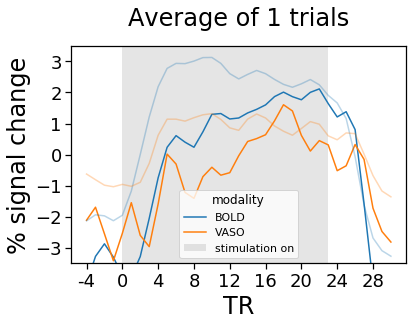

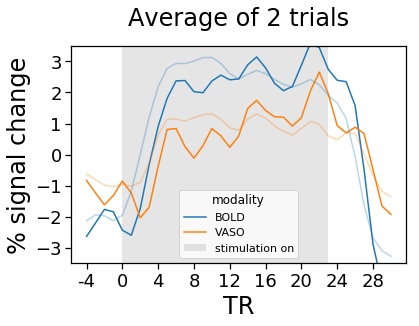

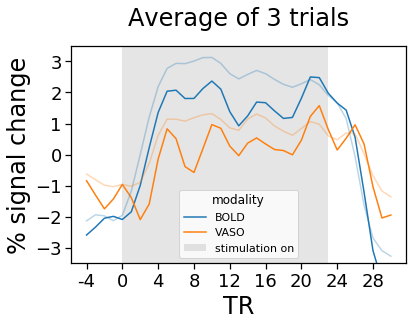

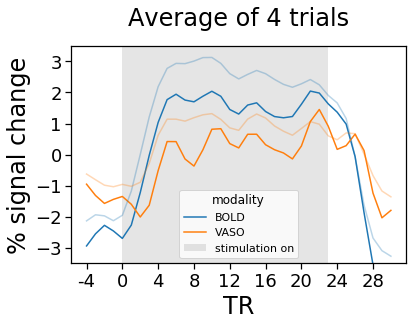

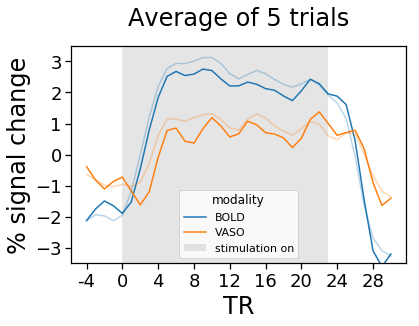

...

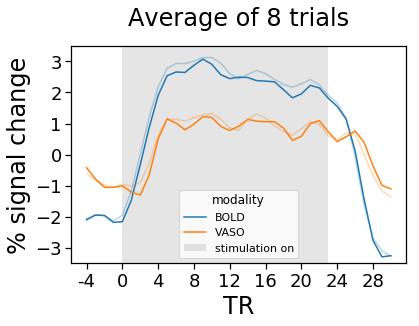

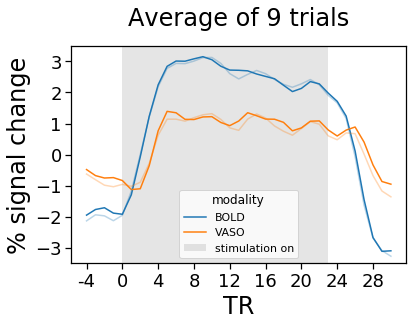

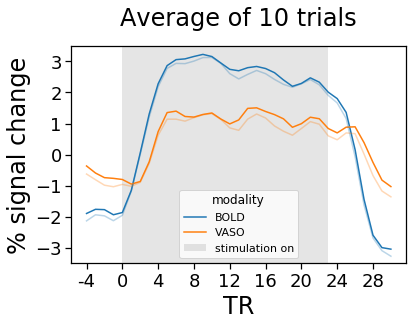

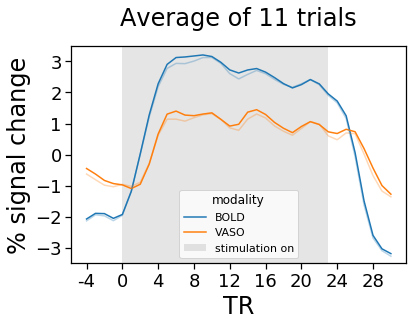

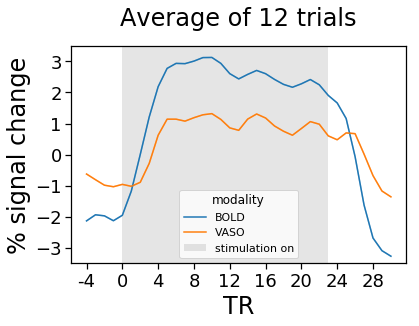

In [770]:
from random import seed
from random import choice


import nibabel as nb
import numpy as np
import imageio
import scipy
from scipy import ndimage
import os


folder = '/home/sebastian/Desktop/test'


seed(5)



for sub in subs[:1]:
    

    subTrials = []
    for key, value in blockResults['v1Focus'][sub][f'{sub}_ses-001_task-blockStim_run-002']['BOLD'].items():
        subTrials.append(key)


    includedTrials = []

    for n in range(len(subTrials)):
        fig = plt.figure()

        # choose a random trial
        selection = choice(subTrials)
        # remove that trial from the list of possible trials
        subTrials.remove(selection)

        includedTrials.append(selection)

        tmpBOLD = blockResults['v1Focus'][sub][f'{sub}_ses-001_task-blockStim_run-002']['BOLD'][includedTrials[0]]
        tmpVASO = blockResults['v1Focus'][sub][f'{sub}_ses-001_task-blockStim_run-002']['VASO'][includedTrials[0]]

        if n != 0:
            for trial in range(1,len(includedTrials)):
                tmpBOLD = np.vstack((tmpBOLD, blockResults['v1Focus'][sub][f'{sub}_ses-001_task-blockStim_run-002']['BOLD'][includedTrials[trial]]))
                tmpVASO = np.vstack((tmpVASO, blockResults['v1Focus'][sub][f'{sub}_ses-001_task-blockStim_run-002']['VASO'][includedTrials[trial]]))


            tmpVASO = np.mean(tmpVASO, axis=0)
            tmpBOLD = np.mean(tmpBOLD, axis=0)

        
        
        
        plt.plot(tmpBOLD, label='_nolegend_')
        plt.plot(-tmpVASO, label='_nolegend_')
        

        
        values = np.arange(-4,len(blockResults['v1Focus']['sub-08']['sub-08_ses-001_task-blockStim_run-002']['BOLD']['trial 1'])-4,4)
        spacing = np.arange(0,len(blockResults['v1Focus']['sub-08']['sub-08_ses-001_task-blockStim_run-002']['BOLD']['trial 1']),4)


        plt.axvspan(4, 4+(30/tr), color='grey', alpha=0.2, lw=0, label = 'stimulation on')
        plt.ylabel('% signal change', fontsize=24)
        plt.xlabel('TR', fontsize=24)


        plt.xticks(spacing,values, fontsize=18)
        plt.yticks(fontsize=18)

        
        plt.ylim(-3.5,3.5) 
        plt.title(f"Average of {n+1} trials", fontsize=24, pad=20)
        
        
        sns.lineplot(data=blockData.loc[(blockData['focus']=="v1Focus")&(blockData['subject']=='sub-05')&(blockData['run'].str.contains('run-002'))], x='x', y='data', hue='modality', alpha=0.3, ci=None)


        plt.savefig(f'{folder}/{sub}_blockEventRelatedAveragesOf{str(n+1).zfill(2)}Trials.png', bbox_inches='tight')
        plt.show()


In [294]:
import nibabel as nb
import numpy as np
import imageio
import scipy
from scipy import ndimage
import os


folder = '/home/sebastian/Desktop/test'


for sub in subs[:1]:
    

    files = sorted(glob.glob(f'{folder}/{sub}_event*Trials.png'))
    images = []
    for file in files:
        images.append(imageio.imread(file))


    imageio.mimsave(f'{folder}/{sub}_movie.gif', images, duration = 1/2)
    
    
# import os
# [os.remove(f'{folder}/{file}') for file in os.listdir(folder) if file.endswith('.png')]


In [ ]:
os.listdir(folder)

In [ ]:
subTrials = []
for key, value in singleEventResults['sub-05']['BOLD_intemp']['run 1'].items():
    subTrials.append(key)
    
for trial in subTrials:
    plt.plot(singleEventResults['sub-05']['BOLD_intemp']['run 1'][trial], label = 'BOLD')
    plt.plot(-singleEventResults['sub-05']['VASO_LN']['run 1'][trial], label = 'absolute VASO')
    plt.axvspan(4, len(singleEventResults[sub]['BOLD_intemp']['run 1'][f'trial 1'])-8, color='grey', alpha=0.2, lw=0, label = 'stimulation on')
    plt.ylabel('% signal change')
    plt.xlabel('TR')
    plt.ylim(-1,1.5) 
    plt.title(f"{trial}")
#     plt.savefig(f'{folder}/eventRelatedAveragesOf{str(n+1).zfill(2)}Trials.png')
    plt.show()

In [461]:
subRuns = []

for sub in subs[:1]:
    
    for key, value in blockResults['v1Focus'][sub].items():
        subRuns.append(key)

In [489]:
tmpBOLD

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [-1.89318865, -1.57473832, -1.84768083, ..., -4.08967133,
        -2.76430842, -2.74948707],
       [-3.63981197, -4.01232892, -4.15532366, ..., -3.07816621,
        -3.85273844, -3.25998872],
       ...,
       [-2.5818382 , -2.93981569, -3.1557644 , ..., -4.08356618,
        -4.56947214, -4.22217671],
       [-3.07765711, -2.14464248, -0.482598  , ..., -4.75192188,
        -4.89147242, -4.45931864],
       [-3.12500004, -3.28770932, -2.80923808, ..., -6.52531624,
        -6.63461517, -5.43471972]])

### Estimate efficiency

In [298]:
tmpBOLD.shape

(14,)

In [300]:
subRuns

['sub-05_ses-001_task-eventStim_run-001',
 'sub-05_ses-001_task-eventStim_run-002']

In [299]:
efficiencyData = {}
tmpBOLD = np.zeros(len(eventResults['v1Focus']['sub-05']['sub-05_ses-001_task-eventStim_run-002']['BOLD']['trial 1']))
for sub in ['sub-05']:
    tmpBOLD = np.zeros(len(eventResults['v1Focus']['sub-05']['sub-05_ses-001_task-eventStim_run-002']['BOLD']['trial 1']))
    tmpVASO = np.zeros(len(eventResults['v1Focus']['sub-05']['sub-05_ses-001_task-eventStim_run-002']['BOLD']['trial 1']))

    subRuns = []
    for key, value in eventResults['v1Focus'][sub].items():
        subRuns.append(key)

sub-05
sub-05_ses-001_task-eventStim_run-001
trial 0
trial 1
trial 2
trial 3
trial 4
trial 5
trial 6
trial 7
trial 8
trial 9
trial 10
trial 11
trial 12
trial 13
trial 14
trial 15
trial 16
trial 17
trial 18
trial 19
trial 20
trial 21
trial 22
trial 23
trial 24
trial 25
trial 26
trial 27
trial 28
trial 29
trial 30
trial 31
trial 32
trial 33
trial 34
trial 35
trial 36
trial 37
trial 38
trial 39
trial 40
trial 41
trial 42
trial 43
trial 44
trial 45
trial 46
trial 47
trial 48
trial 49
trial 50
trial 51
trial 52
trial 53
trial 54
trial 55
trial 56
trial 57
trial 58
trial 59
trial 60
trial 61
trial 62
trial 63
trial 64
trial 65
trial 66
trial 67
trial 68
trial 69
trial 70
trial 71
trial 72
trial 73
trial 74
trial 75
trial 76
trial 77
trial 78
trial 79
trial 80
sub-05_ses-001_task-eventStim_run-002
trial 0
trial 1
trial 2
trial 3
trial 4
trial 5
trial 6
trial 7
trial 8
trial 9
trial 10
trial 11
trial 12
trial 13
trial 14
trial 15
trial 16
trial 17
trial 18
trial 19
trial 20
trial 21
trial 22
t

sub-08_ses-001_task-eventStim_run-001
sub-08_ses-001_task-eventStim_run-002
sub-08_ses-001_task-eventStim_run-003
sub-08_ses-001_task-eventStim_run-004


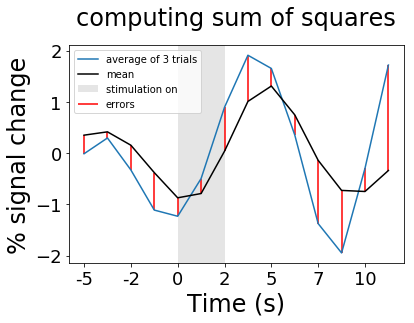

In [312]:
efficiencyData = {}
fig, ax = plt.subplots()

diffScoresBOLD = []
tmpBOLD = np.zeros(len(eventResults['v1Focus']['sub-05']['sub-05_ses-001_task-eventStim_run-002']['BOLD']['trial 1']))
tmpVASO = np.zeros(len(eventResults['v1Focus']['sub-05']['sub-05_ses-001_task-eventStim_run-002']['BOLD']['trial 1']))

for sub in subs[:-2]:
    print(sub)
    tmpBOLD = np.zeros(len(eventResults['v1Focus']['sub-05']['sub-05_ses-001_task-eventStim_run-002']['BOLD']['trial 1']))
    tmpVASO = np.zeros(len(eventResults['v1Focus']['sub-05']['sub-05_ses-001_task-eventStim_run-002']['BOLD']['trial 1']))

    subRuns = []
    for key, value in eventResults['v1Focus'][sub].items():
        subRuns.append(key)
    
    for run in subRuns:
        print(run)
        if 'Random' in run:
            continue
        if 'Vis' in run:
            continue        
        subTrials = []
        for key, value in eventResults['v1Focus'][sub][run]['BOLD'].items():
            subTrials.append(key)


        for trial in subTrials[:-2]:
            print(trial)
            tmpBOLD = np.vstack((tmpBOLD, eventResults['v1Focus'][sub][run]['BOLD'][trial]))
            tmpVASO = np.vstack((tmpVASO, eventResults['v1Focus'][sub][run]['VASO'][trial]))


tmpBOLD = np.delete(tmpBOLD, (0), axis=0)
tmpVASO = np.delete(tmpVASO, (0), axis=0)

meanVASO = -np.mean(tmpVASO, axis=0)
meanBOLD = np.mean(tmpBOLD, axis=0)

demeanBOLD = meanBOLD- np.mean(meanBOLD)

    
# efficiencyData[sub][run] = {"VASO": meanVASO, "BOLD": meanBOLD}
# efficiencyData = {}

#         differenceScoresBOLD = []
#         differenceScoresVASO = []


# diffScoresBOLD = []
    
for sub in subs[:-2]:
    
    tmpBOLD1 = np.zeros(len(eventResults['v1Focus']['sub-05']['sub-05_ses-001_task-eventStim_run-002']['BOLD']['trial 1']))
    tmpVASO1 = np.zeros(len(eventResults['v1Focus']['sub-05']['sub-05_ses-001_task-eventStim_run-002']['BOLD']['trial 1']))

    subRuns = []
    for key, value in eventResults['v1Focus'][sub].items():
        subRuns.append(key)
    
    for run in subRuns:
        print(run)
        if 'Random' in run:
            continue
        if 'Vis' in run:
            continue
        subTrials = []
        for key, value in eventResults['v1Focus'][sub][run]['BOLD'].items():
            subTrials.append(key)


        for trial in subTrials[:-1]:    
            
            tmpBOLD1 = np.vstack((tmpBOLD1, eventResults['v1Focus'][sub][run]['BOLD'][trial]))
            tmpVASO1 = np.vstack((tmpVASO1, eventResults['v1Focus'][sub][run]['VASO'][trial]))
            
            
            


# print(meanBOLD.shape)

    for n in range(1,tmpBOLD.shape[0]+1):
        avg = np.mean(tmpBOLD1[1:n+1,:], axis=0)-np.mean(tmpBOLD1[1:n+1,:])
        
        if sub=='sub-05' and n == 3:
            plt.plot(avg, label="average of 3 trials")

    #     print(avg.shape)
        diffScoresBOLD.append(abs(np.sum(np.subtract(demeanBOLD[4:-6],avg[4:-6]))))

        if sub=='sub-05' and n == 3:
            plt.plot(demeanBOLD, label="mean", color='black')
            
            for index, value in enumerate(demeanBOLD):
#                 print(x = index, y=[value,avg[index]])
                plt.vlines(index, value, avg[index], color='red', label='errors')
#                 plt.axvline(x = index, value,avg[index])







plt.axvspan(4, 4+(2), color='grey', alpha=0.2, lw=0, label = 'stimulation on')
plt.ylabel('% signal change', fontsize=24)
plt.xlabel('Time (s)', fontsize=24)

values = (np.arange(-4,len(eventResults[focus]['sub-08']['sub-08_ses-001_task-eventStim_run-002']['BOLD']['trial 1'])-4,2)*tr).astype(int)
spacing = np.arange(0,len(eventResults[focus]['sub-08']['sub-08_ses-001_task-eventStim_run-002']['BOLD']['trial 1']),2)

plt.xticks(spacing,values)



plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
# plt.title(f"Average of {n+1} trials", fontsize=24, pad=20)
# plt.legend(loc='upper right')

ax.yaxis.set_major_locator(MaxNLocator(integer=True))

handles, labels = plt.gca().get_legend_handles_labels()

plt.title('computing sum of squares', pad=20, fontsize=24)
plt.legend(handles[0:4], labels[0:4], loc='upper left')
plt.savefig('testAVG3.png',bbox_inches='tight')
plt.show()

sub-05
sub-05_ses-001_task-eventStim_run-001
trial 0
trial 1
trial 2
trial 3
trial 4
trial 5
trial 6
trial 7
trial 8
trial 9
trial 10
trial 11
trial 12
trial 13
trial 14
trial 15
trial 16
trial 17
trial 18
trial 19
trial 20
trial 21
trial 22
trial 23
trial 24
trial 25
trial 26
trial 27
trial 28
trial 29
trial 30
trial 31
trial 32
trial 33
trial 34
trial 35
trial 36
trial 37
trial 38
trial 39
trial 40
trial 41
trial 42
trial 43
trial 44
trial 45
trial 46
trial 47
trial 48
trial 49
trial 50
trial 51
trial 52
trial 53
trial 54
trial 55
trial 56
trial 57
trial 58
trial 59
trial 60
trial 61
trial 62
trial 63
trial 64
trial 65
trial 66
trial 67
trial 68
trial 69
trial 70
trial 71
trial 72
trial 73
trial 74
trial 75
trial 76
trial 77
trial 78
trial 79
trial 80
sub-05_ses-001_task-eventStim_run-002
trial 0
trial 1
trial 2
trial 3
trial 4
trial 5
trial 6
trial 7
trial 8
trial 9
trial 10
trial 11
trial 12
trial 13
trial 14
trial 15
trial 16
trial 17
trial 18
trial 19
trial 20
trial 21
trial 22
t

sub-06_ses-001_task-eventStim_run-001
sub-06_ses-001_task-eventStim_run-002
sub-06_ses-001_task-eventStim_run-003
sub-06_ses-001_task-eventStim_run-004
sub-07_ses-001_task-eventStim_run-001
sub-07_ses-001_task-eventStim_run-002
sub-07_ses-001_task-eventStim_run-003
sub-07_ses-001_task-eventStim_run-004
sub-08_ses-001_task-eventStim_run-001
sub-08_ses-001_task-eventStim_run-002
sub-08_ses-001_task-eventStim_run-003
sub-08_ses-001_task-eventStim_run-004


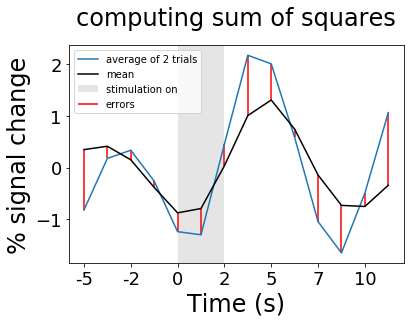

In [315]:
efficiencyData = {}
fig, ax = plt.subplots()

diffScoresBOLD = []
tmpBOLD = np.zeros(len(eventResults['v1Focus']['sub-05']['sub-05_ses-001_task-eventStim_run-002']['BOLD']['trial 1']))
tmpVASO = np.zeros(len(eventResults['v1Focus']['sub-05']['sub-05_ses-001_task-eventStim_run-002']['BOLD']['trial 1']))

for sub in subs[:-2]:
    print(sub)
    tmpBOLD = np.zeros(len(eventResults['v1Focus']['sub-05']['sub-05_ses-001_task-eventStim_run-002']['BOLD']['trial 1']))
    tmpVASO = np.zeros(len(eventResults['v1Focus']['sub-05']['sub-05_ses-001_task-eventStim_run-002']['BOLD']['trial 1']))

    subRuns = []
    for key, value in eventResults['v1Focus'][sub].items():
        subRuns.append(key)
    
    for run in subRuns:
        print(run)
        if 'Random' in run:
            continue
        if 'Vis' in run:
            continue        
        subTrials = []
        for key, value in eventResults['v1Focus'][sub][run]['BOLD'].items():
            subTrials.append(key)


        for trial in subTrials[:-2]:
            print(trial)
            tmpBOLD = np.vstack((tmpBOLD, eventResults['v1Focus'][sub][run]['BOLD'][trial]))
            tmpVASO = np.vstack((tmpVASO, eventResults['v1Focus'][sub][run]['VASO'][trial]))


tmpBOLD = np.delete(tmpBOLD, (0), axis=0)
tmpVASO = np.delete(tmpVASO, (0), axis=0)

meanVASO = -np.mean(tmpVASO, axis=0)
meanBOLD = np.mean(tmpBOLD, axis=0)

demeanBOLD = meanBOLD- np.mean(meanBOLD)

    
# efficiencyData[sub][run] = {"VASO": meanVASO, "BOLD": meanBOLD}
# efficiencyData = {}

#         differenceScoresBOLD = []
#         differenceScoresVASO = []


# diffScoresBOLD = []
    
for sub in subs[:-2]:
    
    tmpBOLD1 = np.zeros(len(eventResults['v1Focus']['sub-05']['sub-05_ses-001_task-eventStim_run-002']['BOLD']['trial 1']))
    tmpVASO1 = np.zeros(len(eventResults['v1Focus']['sub-05']['sub-05_ses-001_task-eventStim_run-002']['BOLD']['trial 1']))

    subRuns = []
    for key, value in eventResults['v1Focus'][sub].items():
        subRuns.append(key)
    
    for run in subRuns:
        print(run)
        if 'Random' in run:
            continue
        if 'Vis' in run:
            continue
        subTrials = []
        for key, value in eventResults['v1Focus'][sub][run]['BOLD'].items():
            subTrials.append(key)


        for trial in subTrials[:-1]:    
            
            tmpBOLD1 = np.vstack((tmpBOLD1, eventResults['v1Focus'][sub][run]['BOLD'][trial]))
            tmpVASO1 = np.vstack((tmpVASO1, eventResults['v1Focus'][sub][run]['VASO'][trial]))
            
            
            


# print(meanBOLD.shape)

    for n in range(1,tmpBOLD.shape[0]+1):
        avg = np.mean(tmpBOLD1[1:n+1,:], axis=0)-np.mean(tmpBOLD1[1:n+1,:])
        
        if sub=='sub-05' and n == 2:
            plt.plot(avg, label="average of 2 trials")

    #     print(avg.shape)
        diffScoresBOLD.append(abs(np.sum(np.subtract(demeanBOLD[4:-6],avg[4:-6]))))

        if sub=='sub-05' and n == 2:
            plt.plot(demeanBOLD, label="mean", color='black')
            
            for index, value in enumerate(demeanBOLD):
#                 print(x = index, y=[value,avg[index]])
                plt.vlines(index, value, avg[index], color='red', label='errors')
#                 plt.axvline(x = index, value,avg[index])







plt.axvspan(4, 4+(2), color='grey', alpha=0.2, lw=0, label = 'stimulation on')
plt.ylabel('% signal change', fontsize=24)
plt.xlabel('Time (s)', fontsize=24)

values = (np.arange(-4,len(eventResults[focus]['sub-08']['sub-08_ses-001_task-eventStim_run-002']['BOLD']['trial 1'])-4,2)*tr).astype(int)
spacing = np.arange(0,len(eventResults[focus]['sub-08']['sub-08_ses-001_task-eventStim_run-002']['BOLD']['trial 1']),2)

plt.xticks(spacing,values)



plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
# plt.title(f"Average of {n+1} trials", fontsize=24, pad=20)
# plt.legend(loc='upper right')

ax.yaxis.set_major_locator(MaxNLocator(integer=True))

handles, labels = plt.gca().get_legend_handles_labels()

plt.title('computing sum of squares', pad=20, fontsize=24)
plt.legend(handles[0:4], labels[0:4], loc='upper left')
plt.savefig('testAVG2.png',bbox_inches='tight')
plt.show()

In [296]:

runList = []
nrTrialsList = []
scoresList = []
modalityList = []


for modality in modalities:
    for sub in subs:
        tmpBOLD = np.zeros(len(eventResults['v1Focus']['sub-05']['sub-05_ses-001_task-eventStim_run-002'][modality]['trial 1']))

        subRuns = []
        for key, value in eventResults['v1Focus'][sub].items():
            subRuns.append(key)

        for run in subRuns:

            subTrials = []
            for key, value in eventResults['v1Focus'][sub][run][modality].items():
                subTrials.append(key)

            tmpBOLD = np.zeros(len(eventResults['v1Focus']['sub-05']['sub-05_ses-001_task-eventStim_run-002'][modality]['trial 1']))

            for trial in subTrials[:-1]:
                tmpBOLD = np.vstack((tmpBOLD, eventResults['v1Focus'][sub][run][modality][trial]))


#             tmpBOLD = np.delete(tmpBOLD, (0), axis=0)

#             meanBOLD = np.mean(tmpBOLD, axis=0)

#             # now we have the run-wise mean



#             tmpBOLD1 = np.zeros(len(eventResults['v1Focus']['sub-05']['sub-05_ses-001_task-eventStim_run-002'][modality]['trial 1']))

#             diffScoresBOLD = []

#             subTrials = []
#             for key, value in eventResults['v1Focus'][sub][run][modality].items():
#                 subTrials.append(key)


#             for trial in subTrials[:-1]:    

#                 tmpBOLD1 = np.vstack((tmpBOLD1, eventResults['v1Focus'][sub][run][modality][trial]))



#             for n in range(1,tmpBOLD1.shape[0]+1):
#                 avg = np.mean(tmpBOLD1[1:n+1,:], axis=0)



#                 diffScoresBOLD.append(abs(np.sum(np.subtract(meanBOLD,avg))))

#                 runList.append(run)
#                 nrTrialsList.append(n)
#                 scoresList.append(np.sum(np.subtract(meanBOLD,avg)**2))
#                 modalityList.append(modality)




# efficiencyData = pd.DataFrame({'run':runList, 'nrTrials':nrTrialsList, 'score':scoresList, "modality":modalityList})
# sns.lineplot(data=efficiencyData, x='nrTrials', y='score', hue='modality')

    tmpBOLD = np.delete(tmpBOLD, (0), axis=0)

    meanBOLD = np.mean(tmpBOLD, axis=0)
    

        # now we have the modality specific mean

    for sub in subs:
        subRuns = []
        
        for key, value in eventResults['v1Focus'][sub].items():
            subRuns.append(key)

        for run in subRuns:

            tmpBOLD1 = np.zeros(len(eventResults['v1Focus']['sub-05']['sub-05_ses-001_task-eventStim_run-002'][modality]['trial 1']))

            diffScoresBOLD = []

            subTrials = []
            for key, value in eventResults['v1Focus'][sub][run][modality].items():
                subTrials.append(key)


            for trial in subTrials[:-1]:    

                tmpBOLD1 = np.vstack((tmpBOLD1, eventResults['v1Focus'][sub][run][modality][trial]))



            for n in range(1,tmpBOLD1.shape[0]+1):
                avg = np.mean(tmpBOLD1[1:n+1,:], axis=0)



                diffScoresBOLD.append(abs(np.sum(np.subtract(meanBOLD,avg))))

                runList.append(run)
                nrTrialsList.append(n)
                scoresList.append(np.sum(np.subtract(meanBOLD,avg)**2))
                modalityList.append(modality)




                
                
                
                



efficiencyData = pd.DataFrame({'run':runList, 'nrTrials':nrTrialsList, 'score':scoresList, "modality":modalityList})
sns.lineplot(data=efficiencyData, x='nrTrials', y='score', hue='modality')


                
plt.title('eventStim Response Stabilization', fontsize=24)



plt.ylabel(f"sum of squares", fontsize=24)

plt.xlabel('trials', fontsize=24)




plt.savefig(f'{root}/stabilizingPerEvent.png', bbox_inches = "tight")
plt.show()

ValueError: all the input array dimensions for the concatenation axis must match exactly, but along dimension 1, the array at index 0 has size 14 and the array at index 1 has size 13

In [670]:
ITImin = 3
ITImax = 10
stimDur = 2

ITImean = (ITImax-ITImin)/2
avgTrialDur = stimDur + ITImean

In [735]:
newDataPoints

array([0.])

In [736]:
np.amax(tmp['nrTrials'])

84

In [737]:
np.amax(tmp['nrTrials'])*avgTrialDur

714.0

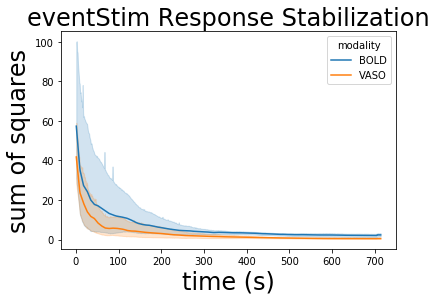

In [37]:
from skimage.transform import resize

ITImin = 3
ITImax = 10
stimDur = 2

ITImean = (ITImax+ITImin)/2
avgTrialDur = stimDur + ITImean

runListInterp = []
secondsList = []
scoresListInterp = []
modalityListInterp = []

for modality in modalities:
    for run in efficiencyData['run'].unique():

        tmp = efficiencyData.loc[(efficiencyData['run']==run)&(efficiencyData['modality']==modality)]

        x = np.arange(0, np.amax(tmp['nrTrials']))

        interpolator = interp1d(x,tmp['score'], kind='linear', bounds_error=False, fill_value= 'extrapolate')

        newDataPoints = np.linspace(0, np.amax(tmp['nrTrials']), int(np.amax(tmp['nrTrials'])*avgTrialDur))

        scoresPerUnitTimeList = interpolator(newDataPoints)
        
        scoresListInterp.append(scoresPerUnitTimeList.copy())

        for n in range(len(scoresPerUnitTimeList)):
            runListInterp.append(run)
            secondsList.append(n+1)
            modalityListInterp.append(modality)
            
scoresListInterp = [item for sublist in scoresListInterp for item in sublist]

efficiencyDataEvents = pd.DataFrame({'run':runListInterp, 'time':secondsList, 'score':scoresListInterp, "modality":modalityListInterp})
sns.lineplot(data=efficiencyDataEvents, x='time', y='score', hue='modality')


plt.title('eventStim Response Stabilization', fontsize=24)



plt.ylabel(f"sum of squares", fontsize=24)

plt.xlabel('time (s)', fontsize=24)




plt.savefig(f'{root}/stabilizingPerTime.png', bbox_inches = "tight")
plt.show()

In [38]:
efficiencyDataEvents

,run,time,score,modality
0,sub-05_ses-001_task-eventStim_run-001,1,39.868002,BOLD
1,sub-05_ses-001_task-eventStim_run-001,2,37.165800,BOLD
2,sub-05_ses-001_task-eventStim_run-001,3,34.463598,BOLD
3,sub-05_ses-001_task-eventStim_run-001,4,31.761396,BOLD
4,sub-05_ses-001_task-eventStim_run-001,5,29.059194,BOLD
5,sub-05_ses-001_task-eventStim_run-001,6,26.356992,BOLD
6,sub-05_ses-001_task-eventStim_run-001,7,23.654790,BOLD
7,sub-05_ses-001_task-eventStim_run-001,8,20.952588,BOLD
8,sub-05_ses-001_task-eventStim_run-001,9,18.250386,BOLD
9,sub-05_ses-001_task-eventStim_run-001,10,16.992811,BOLD


In [861]:
len(efficiencyDataEvents['run'].unique())

14

In [40]:
dims = (len(efficiencyDataEvents['time'].unique()), len(efficiencyDataEvents['run'].unique()))

arr = np.zeros(dims)

In [41]:
arr.shape

(714, 14)

In [42]:
arr = np.zeros(len(efficiencyDataEvents['time'].unique()))

In [53]:
for time in range(len(efficiencyDataEvents['time'].unique())):
    tmp = efficiencyDataEvents.loc[(efficiencyDataEvents['time']==time+1)&(efficiencyDataEvents['modality']=="BOLD")]
    arr[time] = np.mean(tmp['score'])
    

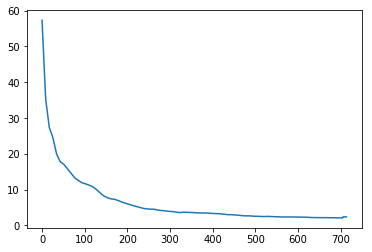

In [110]:
plt.plot(arr)
np.savetxt("arr.txt", arr)

In [111]:
arr2 = np.loadtxt("arr.txt")

In [121]:
from scipy import stats

for n in range(10000,100000):
    
    base = n
    exponent = np.log(arr) / np.log(base)
    
    x = range(len(exponent))
    
    slope, intercept, r_value, p_value, std_err = stats.linregress(x,exponent)
    
    line = [(i*slope)+intercept for i in range(len(exponent))]
    
    ss = np.sum(np.subtract(exponent,line)**2)
    if float(ss) <= 0.3:
#         print(f'for base {n}, the sum of squares is {float(ss)}')
        print(f'for base {n}, the sum of squares is {float(ss)}')
#         plt.plot(x, line, label=f'sum of squares: {float(ss)}')
#         plt.legend()
#         plt.plot(exponent)
#         break

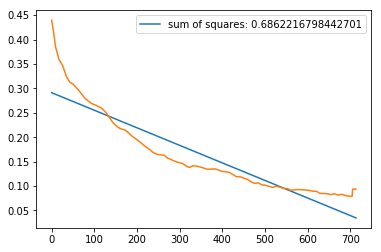

In [119]:
plt.plot(x, line, label=f'sum of squares: {float(ss)}')
plt.legend()
plt.plot(exponent)

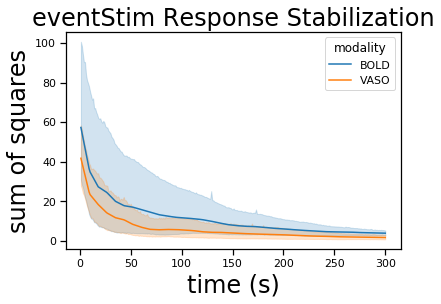

In [789]:
from skimage.transform import resize

ITImin = 3
ITImax = 10
stimDur = 2

ITImean = (ITImax+ITImin)/2
avgTrialDur = stimDur + ITImean

runListInterp = []
secondsList = []
scoresListInterp = []
modalityListInterp = []

for modality in modalities:
    for run in efficiencyData['run'].unique():

        tmp = efficiencyData.loc[(efficiencyData['run']==run)&(efficiencyData['modality']==modality)]

        x = np.arange(0, np.amax(tmp['nrTrials']))

        interpolator = interp1d(x,tmp['score'], kind='linear', bounds_error=False, fill_value= 'extrapolate')

        newDataPoints = np.linspace(0, np.amax(tmp['nrTrials']), int(np.amax(tmp['nrTrials'])*avgTrialDur))

        scoresPerUnitTimeList = interpolator(newDataPoints)
        
        scoresListInterp.append(scoresPerUnitTimeList[:300].copy())

        for n in range(len(scoresPerUnitTimeList[:300])):
            runListInterp.append(run)
            secondsList.append(n+1)
            modalityListInterp.append(modality)
            
scoresListInterp = [item for sublist in scoresListInterp for item in sublist]

efficiencyDataEvents = pd.DataFrame({'run':runListInterp, 'time':secondsList, 'score':scoresListInterp, "modality":modalityListInterp})
sns.lineplot(data=efficiencyDataEvents, x='time', y='score', hue='modality')

plt.title('eventStim Response Stabilization', fontsize=24)



plt.ylabel(f"sum of squares", fontsize=24)

plt.xlabel('time (s)', fontsize=24)




plt.savefig(f'{root}/stabilizingPerTimeTrunc.png', bbox_inches = "tight")
plt.show()

In [694]:
np.amax(secondsList)

714

In [676]:
scoresPerUnitTimeList.shape[0]==np.amax(nrTrialsList) * avgTrialDur

True

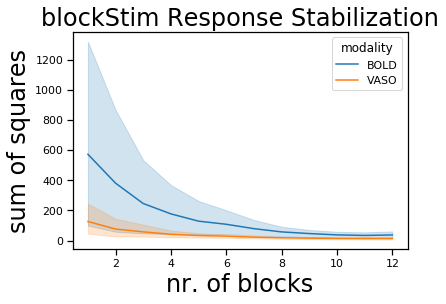

In [794]:

runList = []
nrTrialsList = []
scoresList = []
modalityList = []


for modality in modalities:
    tmpBOLD = np.zeros(len(blockResults['v1Focus']['sub-05']['sub-05_ses-001_task-blockStim_run-002'][modality]['trial 1']))
    for sub in subs:

        subRuns = []
        for key, value in blockResults['v1Focus'][sub].items():
            subRuns.append(key)

        for run in subRuns:

            subTrials = []
            for key, value in blockResults['v1Focus'][sub][run][modality].items():
                subTrials.append(key)

            tmpBOLD = np.zeros(len(blockResults['v1Focus']['sub-05']['sub-05_ses-001_task-blockStim_run-002'][modality]['trial 1']))

            for trial in subTrials[:-1]:
                tmpBOLD = np.vstack((tmpBOLD, blockResults['v1Focus'][sub][run][modality][trial]))


    tmpBOLD = np.delete(tmpBOLD, (0), axis=0)

    meanBOLD = np.mean(tmpBOLD, axis=0)
    

        # now we have the modality specific mean

    for sub in subs:
        subRuns = []
        
        for key, value in blockResults['v1Focus'][sub].items():
            subRuns.append(key)

        for run in subRuns:

            tmpBOLD1 = np.zeros(len(blockResults['v1Focus']['sub-05']['sub-05_ses-001_task-blockStim_run-002'][modality]['trial 1']))

            diffScoresBOLD = []

            subTrials = []
            for key, value in blockResults['v1Focus'][sub][run][modality].items():
                subTrials.append(key)


            for trial in subTrials[:-1]:    

                tmpBOLD1 = np.vstack((tmpBOLD1, blockResults['v1Focus'][sub][run][modality][trial]))



            for n in range(1,tmpBOLD1.shape[0]+1):
                avg = np.mean(tmpBOLD1[1:n+1,:], axis=0)



                diffScoresBOLD.append(abs(np.sum(np.subtract(meanBOLD,avg))))

                runList.append(run)
                nrTrialsList.append(n)
                scoresList.append(np.sum(np.subtract(meanBOLD,avg)**2))
                modalityList.append(modality)




efficiencyData = pd.DataFrame({'run':runList, 'nrTrials':nrTrialsList, 'score':scoresList, "modality":modalityList})
sns.lineplot(data=efficiencyData, x='nrTrials', y='score', hue='modality')

plt.title('blockStim Response Stabilization', fontsize=24)



plt.ylabel(f"sum of squares", fontsize=24)

plt.xlabel('nr. of blocks', fontsize=24)




plt.savefig(f'{root}/stabilizingPerBlock.png', bbox_inches = "tight")
plt.show()

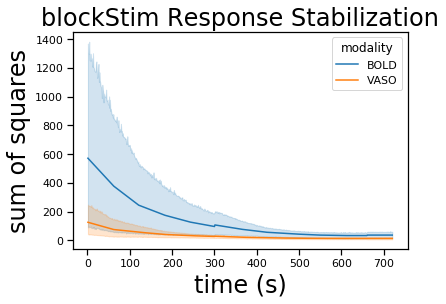

In [796]:
from skimage.transform import resize

ITImin = 30
ITImax = 30
stimDur = 30

ITImean = (ITImax+ITImin)/2
avgTrialDur = stimDur + ITImean

runListInterp = []
secondsList = []
scoresListInterp = []
modalityListInterp = []

for modality in modalities:
    for run in efficiencyData['run'].unique():

        tmp = efficiencyData.loc[(efficiencyData['run']==run)&(efficiencyData['modality']==modality)]

        x = np.arange(0, np.amax(tmp['nrTrials']))

        interpolator = interp1d(x,tmp['score'], kind='linear', bounds_error=False, fill_value= 'extrapolate')

        newDataPoints = np.linspace(0, np.amax(tmp['nrTrials']), int(np.amax(tmp['nrTrials'])*avgTrialDur))

        scoresPerUnitTimeList = interpolator(newDataPoints)
        
        scoresListInterp.append(scoresPerUnitTimeList.copy())

        for n in range(len(scoresPerUnitTimeList)):
            runListInterp.append(run)
            secondsList.append(n+1)
            modalityListInterp.append(modality)
            
scoresListInterp = [item for sublist in scoresListInterp for item in sublist]

efficiencyDataBlocks = pd.DataFrame({'run':runListInterp, 'time':secondsList, 'score':scoresListInterp, "modality":modalityListInterp})
sns.lineplot(data=efficiencyDataBlocks, x='time', y='score', hue='modality')

plt.title('blockStim Response Stabilization', fontsize=24)



plt.ylabel(f"sum of squares", fontsize=24)

plt.xlabel('time (s)', fontsize=24)




plt.savefig(f'{root}/stabilizingPerTimeBlocks.png', bbox_inches = "tight")
plt.show()

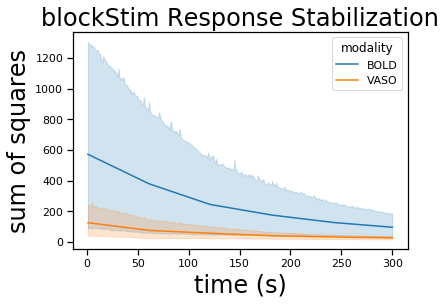

In [797]:
from skimage.transform import resize

ITImin = 30
ITImax = 30
stimDur = 30

ITImean = (ITImax+ITImin)/2
avgTrialDur = stimDur + ITImean

runListInterp = []
secondsList = []
scoresListInterp = []
modalityListInterp = []

for modality in modalities:
    for run in efficiencyData['run'].unique():

        tmp = efficiencyData.loc[(efficiencyData['run']==run)&(efficiencyData['modality']==modality)]

        x = np.arange(0, np.amax(tmp['nrTrials']))

        interpolator = interp1d(x,tmp['score'], kind='linear', bounds_error=False, fill_value= 'extrapolate')

        newDataPoints = np.linspace(0, np.amax(tmp['nrTrials']), int(np.amax(tmp['nrTrials'])*avgTrialDur))

        scoresPerUnitTimeList = interpolator(newDataPoints)
        
        scoresListInterp.append(scoresPerUnitTimeList[:300].copy())

        for n in range(len(scoresPerUnitTimeList[:300])):
            runListInterp.append(run)
            secondsList.append(n+1)
            modalityListInterp.append(modality)
            
scoresListInterp = [item for sublist in scoresListInterp for item in sublist]

efficiencyDataBlocks = pd.DataFrame({'run':runListInterp, 'time':secondsList, 'score':scoresListInterp, "modality":modalityListInterp})

sns.lineplot(data=efficiencyDataBlocks, x='time', y='score', hue='modality')

plt.title('blockStim Response Stabilization', fontsize=24)



plt.ylabel(f"sum of squares", fontsize=24)

plt.xlabel('time (s)', fontsize=24)




plt.savefig(f'{root}/stabilizingPerTimeBlocksTrunc.png', bbox_inches = "tight")
plt.show()

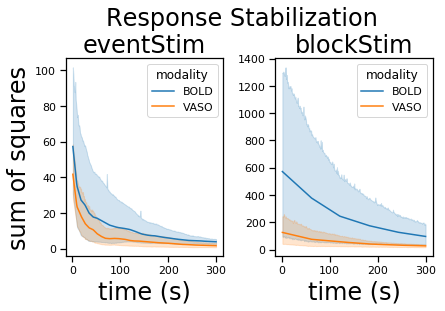

In [798]:
fig, (ax1, ax2) = plt.subplots(1,2)
fig.tight_layout()
fig.subplots_adjust(top=0.80)

sns.lineplot(data=efficiencyDataEvents, x='time', y='score', hue='modality', ax = ax1)
sns.lineplot(data=efficiencyDataBlocks, x='time', y='score', hue='modality', ax = ax2)

plt.suptitle('Response Stabilization', fontsize=24)

ax1.set_title('eventStim', fontsize=24)
ax2.set_title('blockStim', fontsize=24)

ax1.set_ylabel(f"sum of squares", fontsize=24)
ax2.set_ylabel('', fontsize=24)

ax1.set_xlabel('time (s)', fontsize=24)
ax2.set_xlabel('time (s)', fontsize=24)



# plt.yticks(fontsize=18)
# plt.xticks(fontsize=18)



plt.savefig(f'{root}/stabilizingPerTime2.png', bbox_inches = "tight")
plt.show()

### Permutation

In [ ]:
seed(5)

for sub in subs[:1]:
    

    subTrials = []
    for key, value in eventResults['v1Focus'][sub][f'{sub}_ses-001_task-eventStim_run-001']['BOLD'].items():
        subTrials.append(key)


    includedTrials = []

    for n in range(40):
        fig = plt.figure()

        # choose a random trial
        selection = choice(subTrials)
        # remove that trial from the list of possible trials
        subTrials.remove(selection)

        includedTrials.append(selection)

        tmpBOLD = eventResults['v1Focus'][sub][f'{sub}_ses-001_task-eventStim_run-001']['BOLD'][includedTrials[0]]
        tmpVASO = eventResults['v1Focus'][sub][f'{sub}_ses-001_task-eventStim_run-001']['VASO'][includedTrials[0]]

        for trial in range(0,len(includedTrials)):
                tmpBOLD = np.vstack((tmpBOLD, eventResults['v1Focus'][sub][f'{sub}_ses-001_task-eventStim_run-001']['BOLD'][includedTrials[trial]]))
                tmpVASO = np.vstack((tmpVASO, eventResults['v1Focus'][sub][f'{sub}_ses-001_task-eventStim_run-001']['VASO'][includedTrials[trial]]))


        tmpVASO = np.mean(tmpVASO, axis=0)
        tmpBOLD = np.mean(tmpBOLD, axis=0)

        plt.plot(tmpBOLD, label='_nolegend_')
        plt.plot(-tmpVASO, label='_nolegend_')
        
        plt.axvspan(4, 4+(2/tr), color='grey', alpha=0.2, lw=0, label = 'stimulation on')
        plt.ylabel('% signal change', fontsize=24)
        plt.xlabel('TR', fontsize=24)
#         plt.title(f"{sub}  Event-Related Average", fontsize=20)
#         plt.legend(loc='upper right')

        values = np.arange(-4,len(eventResults['v1Focus']['sub-08']['sub-08_ses-001_task-eventStim_run-002']['BOLD']['trial 1'])-4,2)
        spacing = np.arange(0,len(eventResults['v1Focus']['sub-08']['sub-08_ses-001_task-eventStim_run-002']['BOLD']['trial 1']),2)

        plt.xticks(spacing,values)
        
        
#         sns.lineplot(data=eventData.loc[(eventData['subject']==sub)&('run-001' in str(eventData['run']))], x='x', y='data', hue='modality', alpha=0.3, ci=None)
        sns.lineplot(data=eventData.loc[(eventData['focus']=="v1Focus")&(eventData['subject']=='sub-05')&(eventData['run'].str.contains('run-001'))], x='x', y='data', hue='modality', alpha=0.3, ci=None)
        
        plt.xticks(fontsize=18)
        plt.yticks(fontsize=18)
#         plt.xlabel('TR')
        plt.ylim(-1.5,2) 
        plt.title(f"Average of {n+1} trials", fontsize=24, pad=20)
        plt.legend(loc='upper right')
        
        plt.savefig(f'{folder}/{sub}_eventRelatedAveragesOf{str(n+1).zfill(2)}Trials.png', bbox_inches='tight')
        plt.show()


### Find scaling factor Even related design

In [230]:
mat = np.loadtxt(f'{root}/sub-08/ses-001/s1Focus/sub-08_ses-001_task-eventStim_run-001_VASO.feat/design.mat', skiprows=5)

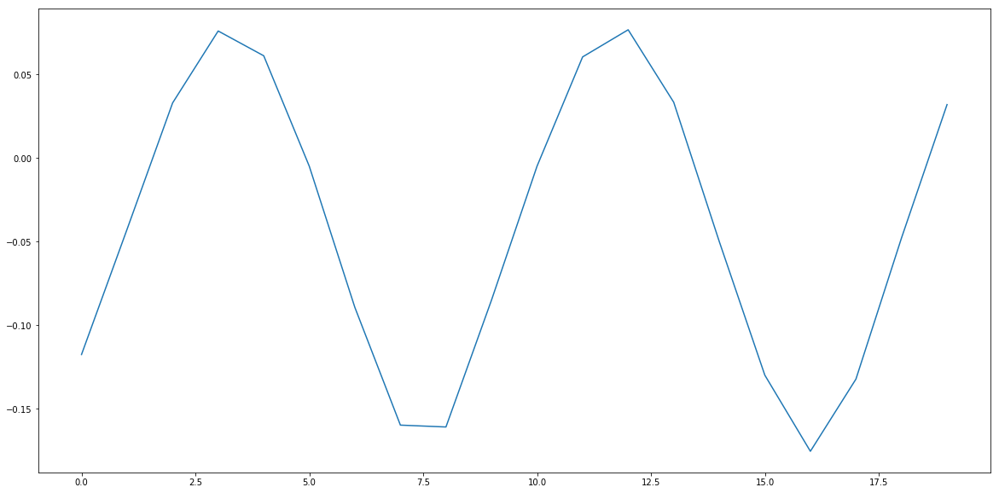

In [235]:
plt.subplots(figsize=(20,10))

plt.plot(mat[200:220])

In [238]:
matBlock = np.loadtxt(f'{root}/sub-08/ses-001/s1Focus/sub-08_ses-001_task-blockStim_run-001_VASO.feat/design.mat', skiprows=5)

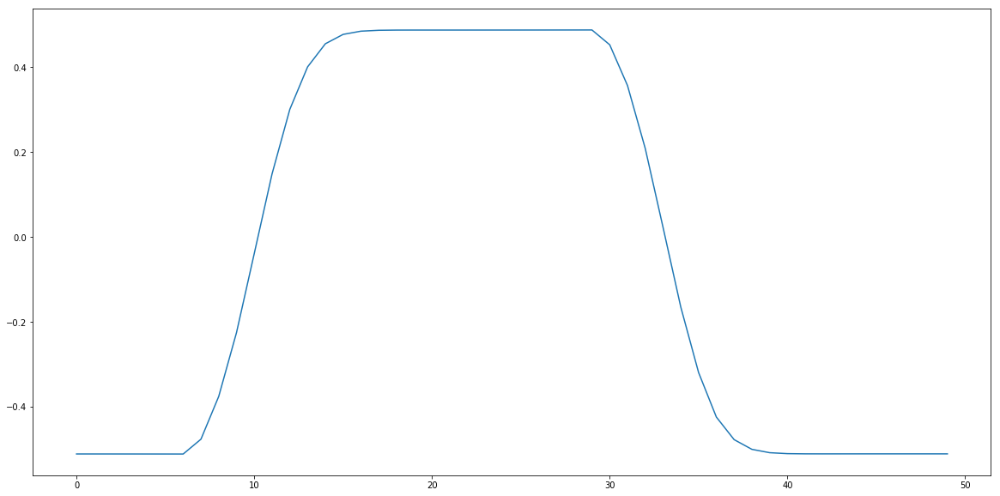

In [240]:
plt.subplots(figsize=(20,10))

plt.plot(matBlock[200:250])

## Control Experiments

In subjects 09 and 10 we did some special analyses. For subject 09, we first checked whether a longer TR has an effect.

In [33]:
subList = []
dataList = []
modalityList = []
layerList = []
stimTypeList = []
focusList = []

# layers = {'1':'deep','2':'middle','3':'superficial'}

subs = ['sub-09']
# subs = ['sub-05', 'sub-06', 'sub-07', 'sub-08']


for sub in subs:
    for focus in ['v1Focus', 's1Focus']:
        for task in ['blockStim', 'blockStimLongTR']:

            runs = sorted(glob.glob(f'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/{sub}/ses-001/func/{sub}_ses-001_task-{task}_run-00*_cbv.nii.gz'))

            for run in runs:

                base = os.path.basename(run).rsplit('.', 2)[0][:-4]
                print(base)
                mask = nb.load(f'{root}/{sub}/ses-001/{focus}/{sub}_masks/{base}_11layers_layers_equidist.nii').get_fdata()

                for modality in ['BOLD_intemp','VASO']:
                    data = nb.load(f'{root}/{sub}/ses-001/{focus}/{base}_{modality}.feat/stats/zstat1_scaled.nii.gz').get_fdata()

                    for j in range(1,12):  # Compute bin averages
                        layerRoi = mask == j
                        mask_mean = np.mean(data[layerRoi.astype(bool)])

                        subList.append(sub)
                        dataList.append(mask_mean)
                        modalityList.append(modality[:4])
                        layerList.append(j)
                        stimTypeList.append(task)
                        focusList.append(focus)



            
zscores = pd.DataFrame({'subject': subList, 'data': dataList, 'modality': modalityList, 'layer':layerList, 'stimType':stimTypeList, 'focus':focusList})

sub-09_ses-001_task-blockStim_run-001
sub-09_ses-001_task-blockStim_run-002
sub-09_ses-001_task-blockStimLongTR_run-001
sub-09_ses-001_task-blockStimLongTR_run-002
sub-09_ses-001_task-blockStim_run-001
sub-09_ses-001_task-blockStim_run-002
sub-09_ses-001_task-blockStimLongTR_run-001
sub-09_ses-001_task-blockStimLongTR_run-002


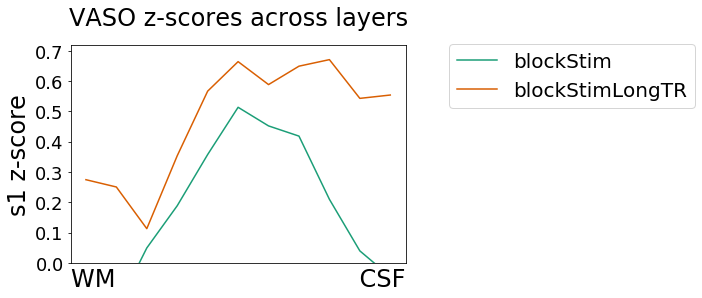

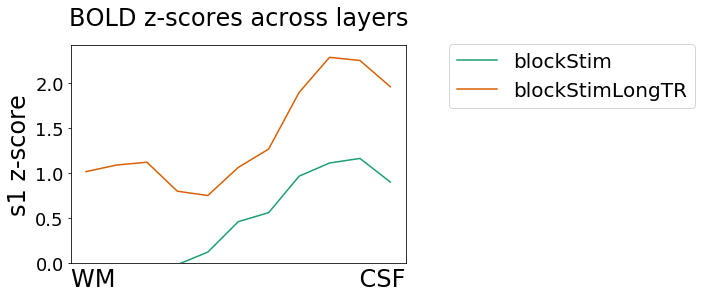

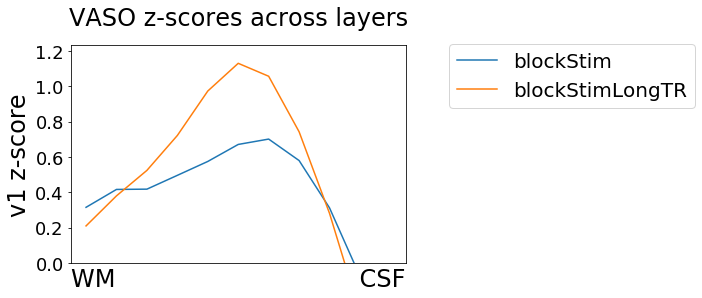

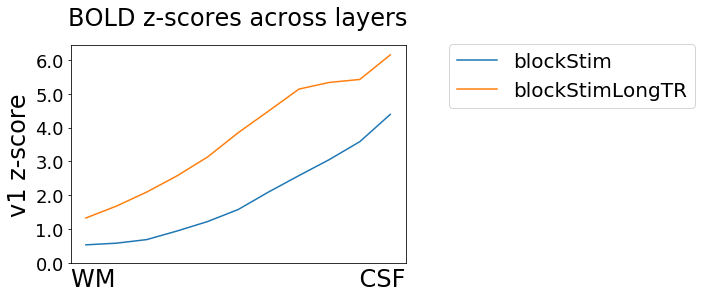

In [39]:
from matplotlib.ticker import MaxNLocator
from matplotlib.ticker import FormatStrFormatter


for focus, cmap in zip(['s1Focus', 'v1Focus'],['Dark2', 'tab10']):
    for modality in ['VASO', 'BOLD']:
        fig, ax = plt.subplots()
        tmp = zscores.loc[(zscores['modality']==modality)&(zscores['focus']==focus)]

        sns.lineplot(data=tmp, x='layer', y='data', hue='stimType',palette=cmap, ci=None)


        plt.ylabel(f'{focus[:2]} z-score', fontsize=24)

        plt.title(f"{modality[:4]} z-scores across layers", fontsize=24, pad=20)
        plt.xlabel('WM                                CSF', fontsize=24)
        plt.xticks([])


        plt.yticks(fontsize=18)

        ax.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

        plt.legend(loc='upper left')
        
        yLimits = ax.get_ylim()
        plt.ylim(0,yLimits[1])
        plt.legend(bbox_to_anchor=(1.1, 1.05),fontsize=20)

#         plt.legend(fontsize=20)

        plt.savefig(f'{root}/sub-09_{focus}_{modality}_longVsShortTR.png', bbox_inches = "tight")
        plt.show()

which does not seem to be the case.


Next, we added another session with this subject. However, the tactile stimulation device was not available that day. Therefore, we only have visual stimulation.

In [20]:
root = '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives'


modalities = ['BOLD', 'VASO']



for focus in ['v1Focus']:
    for sub in ['sub-09']:
        print(sub)
        layerEventResults[focus][sub] = {}

        runs = sorted(glob.glob(f'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/{sub}/ses-002/func/{sub}_ses-002_task-event*_run-00*_cbv.nii.gz'))

        for run in runs:

            base = os.path.basename(run).rsplit('.', 2)[0][:-4]
            print(base)
            layerEventResults[focus][sub][base] = {}
            
            
            box = find_roi_box(nb.load(f'{root}/{sub}/ses-002/{focus}/{sub}_masks/{base}_rim.nii').get_fdata())

            mask = nb.load(f'{root}/{sub}/ses-002/{focus}/{sub}_masks/{base}_3layers_layers_equidist.nii')
            mask = np.asarray(mask.dataobj[box[0], box[1], box[2]])
            
            idx_layers = np.unique(mask.astype("int"))
            idx_layers = idx_layers[1:]

            for modality in modalities:
                print(modality)
                layerEventResults[focus][sub][base][modality[:4]] = {}

                skippedTrials = 0


                run = f'{root}/{sub}/ses-002/{focus}/{base}_{modality}_slice.nii'

                Nii = nb.load(run)
                # As before, get the data as an array.
                data = Nii.get_fdata()[:,:,:,:-2]
                # load the nifty-header to get some meta-data.
                header = Nii.header

                # As the number of volumes which is the 4th position of
                # get_shape. This seems to be unused so I will comment it out to check.
                # nr_volumes = int(header.get_data_shape()[3])

                # Or the TR, which is the 4th position of get_zooms().
                tr = header.get_zooms()[3]

                 # Get scan duration in s
                runTime = data.shape[-1]*tr

                events = pd.read_csv(f'{root}/{sub}/ses-002/events/{base}.txt', sep = ' ', names = ['start','duration','trialType'])[:-1]

                # Load information on run-wise motion
                FDs = pd.read_csv(f'{root}/{sub}/ses-002/v1Focus/motionParameters/{sub}_FDs.csv')

                # Because we want the % signal-change, we need the mean
                # of the voxel we are looking at. This is done with
                # some fancy matrix operations.

                for j in idx_layers:  # Compute bin averages

                    layerEventResults[focus][sub][base][modality[:4]][f'layer {j}'] = {}

                    layerRoi = mask == j



                    mask_mean = np.mean(data[:, :, :]
                                        [layerRoi.astype(bool)])

                    includedTrials = []

                    for i, row in events.iterrows():


                        onset = round(row['start']/tr)
                        # Do the same for the offset
                        offset = round(onset + row['duration']/tr)


                        # truncate motion data to event
                        tmp = FDs.loc[(FDs['volume']>=(onset-2)/2)&(FDs['volume']<=(offset+2)/2)&(FDs['run'].str.contains(f'{base}[-17:]'))]


                        if not (tmp['FD']>=2).any():

                            layerEventResults[focus][sub][base][modality[:4]][f'layer {j}'][f'trial {i}'] = np.mean((((data[:, :, :, int(onset-4):int(offset+ 8)][layerRoi.astype(bool)]) / mask_mean)- 1) * 100,axis=0)
                            includedTrials.append(f'trial {i}')



sub-09
sub-09_ses-002_task-eventStimVisOnly_run-001
BOLD
VASO
sub-09_ses-002_task-eventStimVisOnly_run-002
BOLD
VASO
sub-09_ses-002_task-eventStimVisOnly_run-003
BOLD
VASO
sub-09_ses-002_task-eventStimVisOnly_run-004
BOLD
VASO


In [22]:
subs.append('sub-09')

In [23]:
subs

['sub-05', 'sub-06', 'sub-07', 'sub-08', 'sub-10', 'sub-09']

In [30]:
subList = []
dataList = []
xList = []
modalityList = []
trialList = []
runList = []
layerList = []
focusList = []

layers = {'1':'deep','2':'middle','3':'superficial'}

# subs = ['sub-05']
for focus, cmap in zip(['s1Focus', 'v1Focus'],['Dark2', 'tab10']):
# for focus, cmap in zip(['v1Focus'],['tab10']):
    for sub in subs:
        print(sub)
        runs = sorted(glob.glob(f'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/{sub}/*/func/{sub}_ses-00*_task-event*_run-00*_cbv.nii.gz'))
        runs = [s for s in runs if not "Random" in s]
        
        for run in runs:

            base = os.path.basename(run).rsplit('.', 2)[0][:-4]
            print(base)
            
            try:
                
                for modality in modalities:
                    print(modality)

                    for j in range(1, 4):

                        subTrials = []
                        for key, value in layerEventResults[focus][sub][base][modality][f'layer {j}'].items():
                            subTrials.append(key)

                        for trial in subTrials[:-1]:

                            for n in range(len(layerEventResults[focus][sub][base][modality][f'layer {j}'][trial])):

                                if modality == "BOLD":
                                    dataList.append(layerEventResults[focus][sub][base][modality][f'layer {j}'][trial][n])

                                if modality == "VASO":
                                    dataList.append(-layerEventResults[focus][sub][base][modality][f'layer {j}'][trial][n])

                                modalityList.append(modality)
                                trialList.append(trial)
                                runList.append(base)
                                xList.append(n)
                                subList.append(sub)
                                layerList.append(layers[str(j)])
                                focusList.append(focus)
            except:
                continue


layerEventData = pd.DataFrame({'subject': subList,'x':xList, 'data': dataList, 'modality': modalityList, 'trial': trialList, 'run':runList, 'layer':layerList, 'focus': focusList})

sub-05
sub-05_ses-001_task-eventStim_run-001
BOLD
VASO
sub-05_ses-001_task-eventStim_run-002
BOLD
VASO
sub-06
sub-06_ses-001_task-eventStim_run-001
BOLD
VASO
sub-06_ses-001_task-eventStim_run-002
BOLD
VASO
sub-06_ses-001_task-eventStim_run-003
BOLD
VASO
sub-06_ses-001_task-eventStim_run-004
BOLD
VASO
sub-07
sub-07_ses-001_task-eventStim_run-001
BOLD
VASO
sub-07_ses-001_task-eventStim_run-002
BOLD
VASO
sub-07_ses-001_task-eventStim_run-003
BOLD
VASO
sub-07_ses-001_task-eventStim_run-004
BOLD
VASO
sub-08
sub-08_ses-001_task-eventStim_run-001
BOLD
VASO
sub-08_ses-001_task-eventStim_run-002
BOLD
VASO
sub-08_ses-001_task-eventStim_run-003
BOLD
VASO
sub-08_ses-001_task-eventStim_run-004
BOLD
VASO
sub-10
sub-10_ses-001_task-eventStim_run-001
BOLD
VASO
sub-10_ses-001_task-eventStim_run-002
BOLD
VASO
sub-10_ses-001_task-eventStim_run-003
BOLD
VASO
sub-09
sub-09_ses-002_task-eventStimVisOnly_run-001
BOLD
sub-09_ses-002_task-eventStimVisOnly_run-002
BOLD
sub-09_ses-002_task-eventStimVisOnly_run-0

In [31]:
layerEventData

,subject,x,data,modality,trial,run,layer,focus
0,sub-05,0,1.356931,BOLD,trial 0,sub-05_ses-001_task-eventStim_run-001,deep,s1Focus
1,sub-05,1,-0.446539,BOLD,trial 0,sub-05_ses-001_task-eventStim_run-001,deep,s1Focus
2,sub-05,2,-3.331153,BOLD,trial 0,sub-05_ses-001_task-eventStim_run-001,deep,s1Focus
3,sub-05,3,-4.705360,BOLD,trial 0,sub-05_ses-001_task-eventStim_run-001,deep,s1Focus
4,sub-05,4,-2.523348,BOLD,trial 0,sub-05_ses-001_task-eventStim_run-001,deep,s1Focus
5,sub-05,5,0.411988,BOLD,trial 0,sub-05_ses-001_task-eventStim_run-001,deep,s1Focus
6,sub-05,6,1.008448,BOLD,trial 0,sub-05_ses-001_task-eventStim_run-001,deep,s1Focus
7,sub-05,7,0.176222,BOLD,trial 0,sub-05_ses-001_task-eventStim_run-001,deep,s1Focus
8,sub-05,8,-0.718938,BOLD,trial 0,sub-05_ses-001_task-eventStim_run-001,deep,s1Focus
9,sub-05,9,-1.613159,BOLD,trial 0,sub-05_ses-001_task-eventStim_run-001,deep,s1Focus


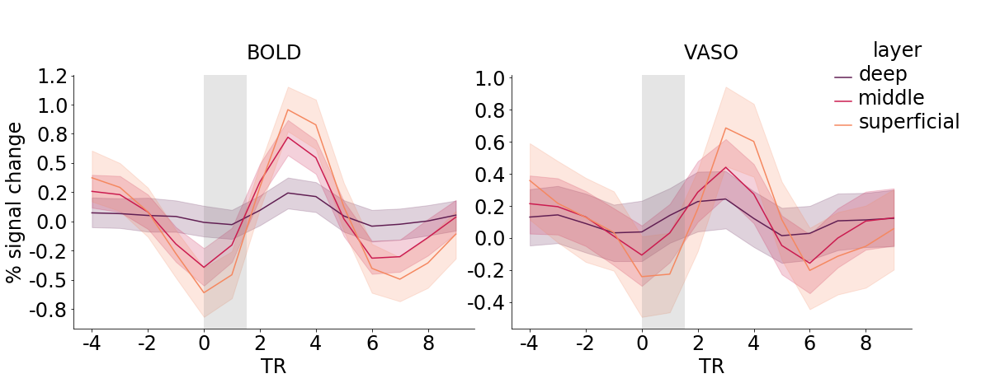

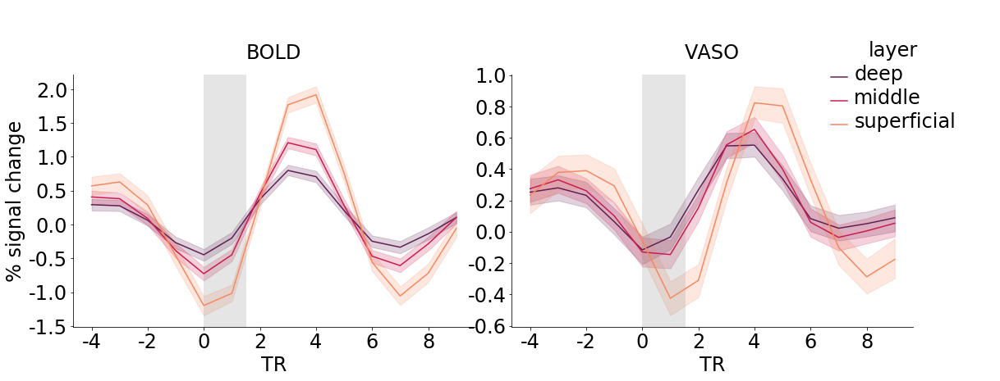

In [304]:

for focus, cmap in zip(['s1Focus', 'v1Focus'],['Dark2', 'tab10']):
    
    g = sns.FacetGrid(layerEventData.loc[layerEventData['focus']==focus], col="modality", hue="layer", sharey=False, height= 5, aspect = 1.5,palette='rocket')
    g.map_dataframe(sns.lineplot, x="x", y="data")
    g.add_legend(bbox_to_anchor = (1, 1), borderaxespad = 0)
    
    
    g.axes[0,0].set_ylabel('% signal change', fontsize=24)

    g.axes[0,1].set_xlabel('TR', fontsize=24)
    g.axes[0,0].set_xlabel('TR', fontsize=24)


    g.axes[0,1].set_title('VASO', fontsize=24, pad=20)
    g.axes[0,0].set_title('BOLD', fontsize=24, pad=20)


    g.axes[0,0].axvspan(4, 4 + (2/tr), color='grey', alpha=0.2, lw=0, label = 'stimulation on')
    g.axes[0,1].axvspan(4, 4 + (2/tr), color='grey', alpha=0.2, lw=0, label = 'stimulation on')


    plt.setp(g._legend.get_title(), fontsize=24)
    plt.setp(g._legend.get_texts(), fontsize=24)



    values = np.arange(-4,len(layerEventResults[focus]['sub-08']['sub-08_ses-001_task-eventStim_run-002']['BOLD'][f'layer {3}']['trial 1'])-4,2)
    spacing = np.arange(0,len(layerEventResults[focus]['sub-08']['sub-08_ses-001_task-eventStim_run-002']['BOLD'][f'layer {3}']['trial 1']),2)

    g.axes[0,0].set_xticks(spacing)

    g.axes[0,0].set_xticklabels(values,fontsize=24)
    g.axes[0,1].set_xticklabels(values,fontsize=24)


    plt.setp(g.axes[0,0].get_yticklabels(), fontsize=24)
    plt.setp(g.axes[0,1].get_yticklabels(), fontsize=24)
    
    
    g.axes[0,0].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
    g.axes[0,1].yaxis.set_major_formatter(FormatStrFormatter('%.1f'))

#     plt.legend(bbox_to_anchor = (1.25, 1), borderaxespad = 0)



    g.savefig(f"{root}/eventResults{focus}LayersModalityVsLayers.png")

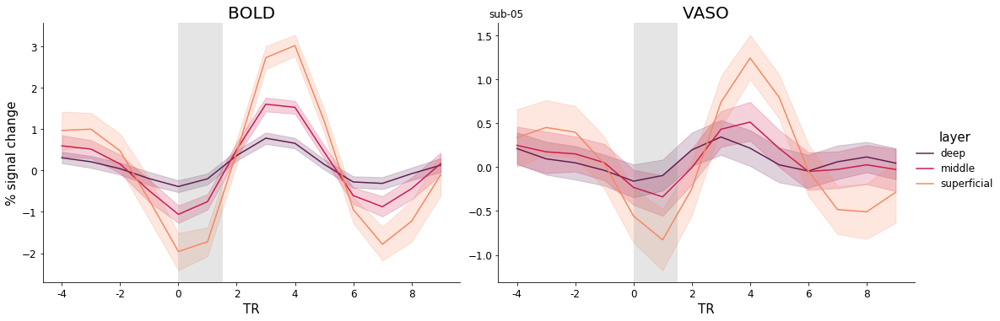

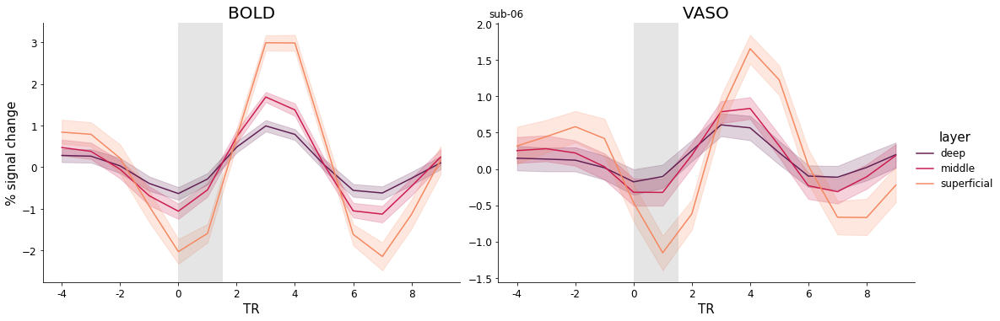

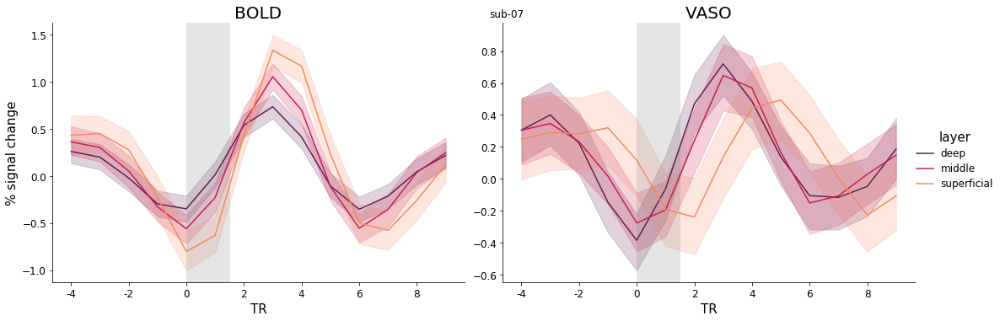

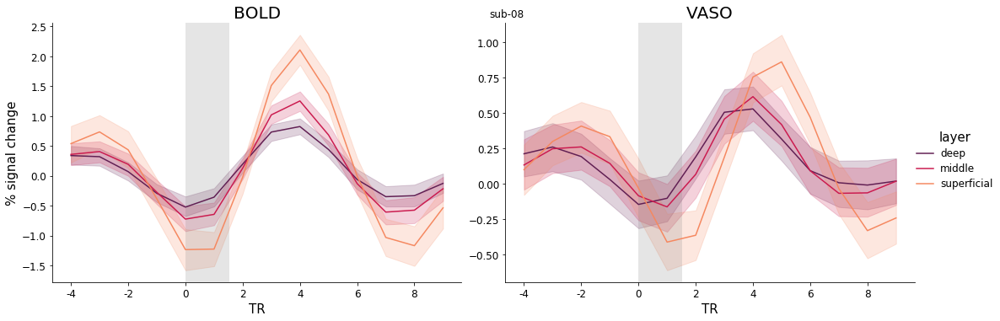

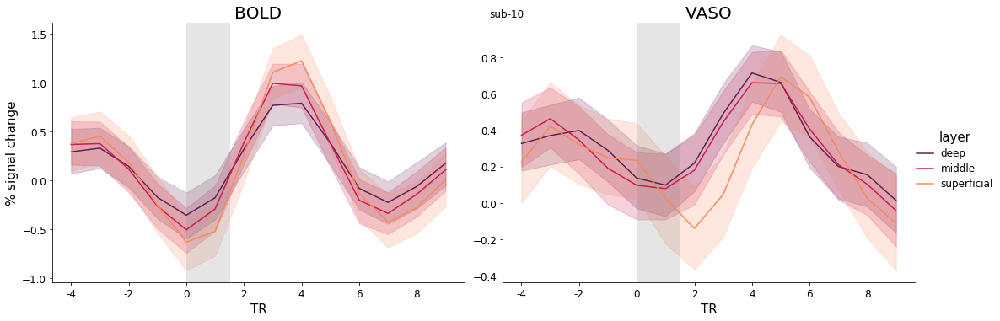

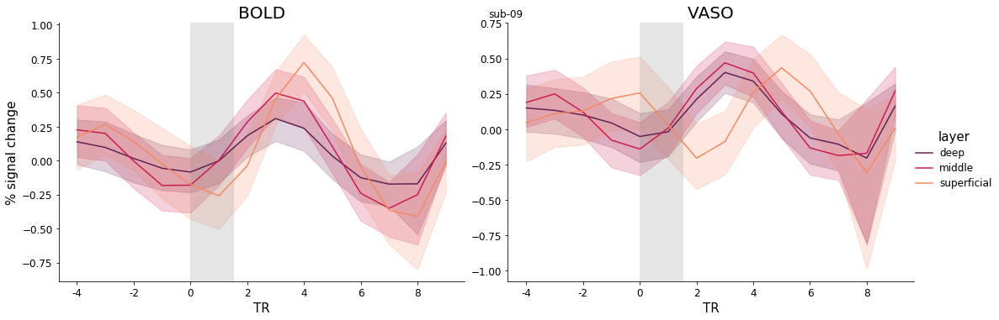

In [32]:
for sub in subs:
    tmp = layerEventData.loc[(layerEventData['subject']==sub)&(layerEventData['focus']=='v1Focus')]
    g = sns.FacetGrid(tmp, col="modality", hue="layer", sharey=False, height= 5, aspect = 1.5,palette='rocket')
    g.map_dataframe(sns.lineplot, x="x", y="data")
    g.add_legend()
    g.axes[0,0].set_ylabel('% signal change', fontsize=15)

    g.axes[0,1].set_xlabel('TR', fontsize=15)
    g.axes[0,0].set_xlabel('TR', fontsize=15)


    g.axes[0,1].set_title('VASO', fontsize=20)
    g.axes[0,0].set_title('BOLD', fontsize=20)


    g.axes[0,0].axvspan(4, 4 + (2/tr), color='grey', alpha=0.2, lw=0, label = 'stimulation on')
    g.axes[0,1].axvspan(4, 4 + (2/tr), color='grey', alpha=0.2, lw=0, label = 'stimulation on')


    plt.setp(g._legend.get_title(), fontsize=15)
    plt.setp(g._legend.get_texts(), fontsize=12)
    plt.suptitle(sub)
    
    values = np.arange(-4,len(layerEventResults['v1Focus']['sub-10']['sub-10_ses-001_task-eventStim_run-002']['BOLD'][f'layer {j}']['trial 1'])-4,2)
    spacing = np.arange(0,len(layerEventResults['v1Focus']['sub-10']['sub-10_ses-001_task-eventStim_run-002']['BOLD'][f'layer {j}']['trial 1']),2)

    g.axes[0,0].set_xticks(spacing)

    g.axes[0,0].set_xticklabels(values,fontsize=12)
    g.axes[0,1].set_xticklabels(values,fontsize=12)


    plt.setp(g.axes[0,0].get_yticklabels(), fontsize=12)
    plt.setp(g.axes[0,1].get_yticklabels(), fontsize=12)



    g.savefig(f"{root}/{sub}_eventResultsV1LayersModalityVsLayers.png")

In [168]:
root

'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives'

In [171]:
from nipype.interfaces import afni

for sub in ['sub-09']:
    for focus in ['v1Focus', 's1Focus']:
        
        inputFiles = sorted(glob.glob(f'{root}/{sub}/ses-001/{focus}/{sub}_*_run-00*_moco_*ulled.nii'))
        tcat = afni.TCat()
        tcat.inputs.in_files = inputFiles
        tcat.inputs.out_file= f'{root}/{sub}/ses-001/{focus}/combined.nii'

        res = tcat.run()

211119-09:31:04,48 nipype.interface INFO:
	 stderr 2021-11-19T09:31:04.048711:++ 3dTcat: AFNI version=AFNI_21.1.07 (May 11 2021) [64-bit]
211119-09:31:50,626 nipype.interface INFO:
	 stderr 2021-11-19T09:31:50.626655:++ elapsed time = 46.6 s
211119-09:31:51,615 nipype.interface INFO:
	 stderr 2021-11-19T09:31:51.615412:++ 3dTcat: AFNI version=AFNI_21.1.07 (May 11 2021) [64-bit]
211119-09:33:49,760 nipype.interface INFO:
	 stderr 2021-11-19T09:33:49.760226:++ elapsed time = 118.1 s


In [172]:
%%bash

# for sub in 02 05 06 07 09 10 12 15 16 17 18
for sub in 09
do

for focus in v1 s1
do

cd '/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-'$sub'/ses-001/'$focus'Focus/'

echo Current subject: sub-$sub


3dTstat -cvarinv -overwrite -prefix 'sub-'$sub'_EPI_T1w.nii' combined.nii

N4BiasFieldCorrection -d 3 -i 'sub-'$sub'_EPI_T1w.nii' -o 'sub-'$sub'_EPI_T1w_N4Corrected.nii'


rm combined*.nii


done
done

Current subject: sub-09
Current subject: sub-09


++ 3dTstat: AFNI version=AFNI_21.1.07 (May 11 2021) [64-bit]
++ Authored by: KR Hammett & RW Cox
*+ WARNING:   If you are performing spatial transformations on an oblique dset,
  such as /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-09/ses-001/v1Focus/combined.nii,
  or viewing/combining it with volumes of differing obliquity,
  you should consider running: 
     3dWarp -deoblique 
  on this and  other oblique datasets in the same session.
 See 3dWarp -help for details.
++ Oblique dataset:/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-09/ses-001/v1Focus/combined.nii is 42.900002 degrees from plumb.
++ Output dataset ./sub-09_EPI_T1w.nii
++ 3dTstat: AFNI version=AFNI_21.1.07 (May 11 2021) [64-bit]
++ Authored by: KR Hammett & RW Cox
*+ WARNING:   If you are performing spatial transformations on an oblique dset,
  such as /media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/derivatives/sub-09/ses-001/s1Focus/combined.nii,
  or viewing/co

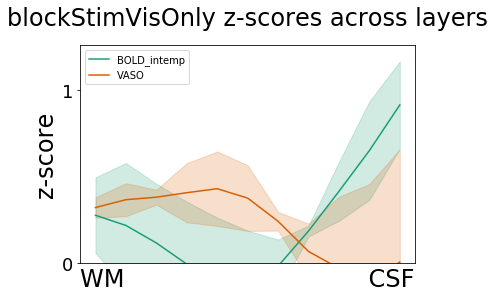

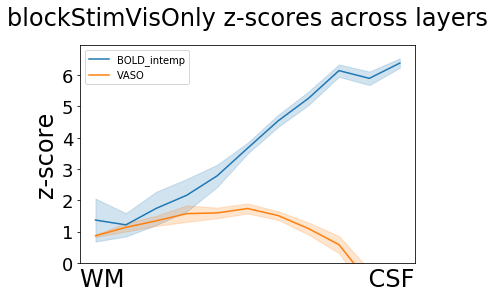

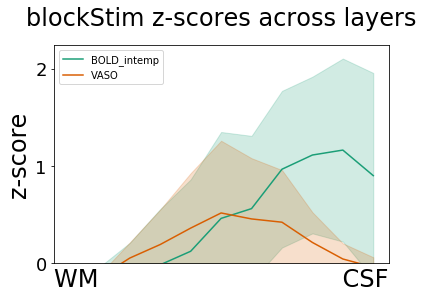

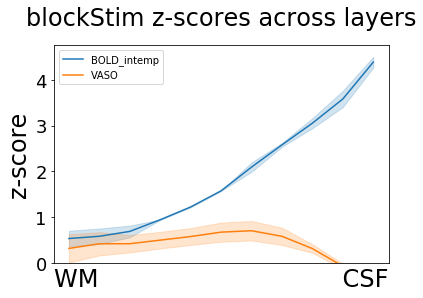

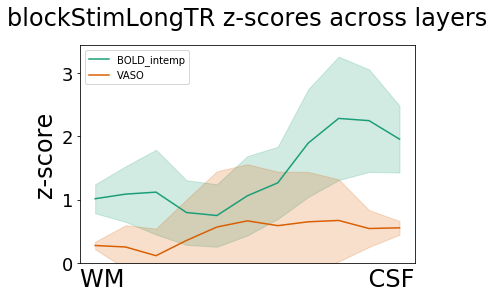

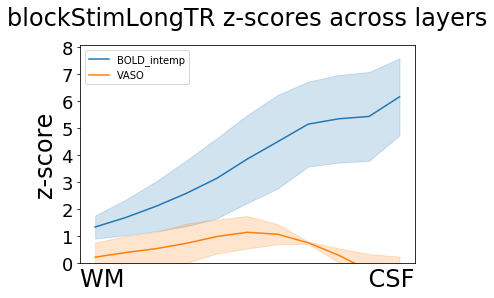

In [193]:
from matplotlib.ticker import MaxNLocator

# for focus in ['v1Focus', 's1Focus']:
for stimType in ['blockStimVisOnly', 'blockStim', 'blockStimLongTR']:
    for focus, cmap in zip(['s1Focus', 'v1Focus'],['Dark2', 'tab10']):
        fig, ax = plt.subplots()
        tmp = zscores.loc[(zscores['stimType']==stimType)&(zscores['focus']==focus)]

        sns.lineplot(data=tmp, x='layer', y='data', hue='modality', palette=cmap)


        plt.ylabel('z-score', fontsize=24)

        plt.title(f"{stimType} z-scores across layers", fontsize=24, pad=20)
        plt.xlabel('WM                                CSF', fontsize=24)
        plt.xticks([])
        yLimits = ax.get_ylim()
        plt.ylim(0,yLimits[1])    

        plt.yticks(fontsize=18)

        ax.yaxis.set_major_locator(MaxNLocator(integer=True))

        plt.legend(loc='upper left')


        plt.savefig(f'{root}/sub-09_{stimType}_{focus}_zScoreProfile.png', bbox_inches = "tight")
        plt.show()

In [ ]:
from matplotlib.ticker import MaxNLocator

# for focus in ['v1Focus', 's1Focus']:
for stimType in ['blockStimVisOnly', 'blockStim', 'blockStimLongTR']:
    fig, ax = plt.subplots()
    
    tmp = zscores.loc[(zscores['stimType']==stimType)]

    sns.lineplot(data=tmp, x='layer', y='data', hue='modality')


    plt.ylabel('z-score', fontsize=24)
    
    plt.title(f"{stimType} z-scores across layers", fontsize=24, pad=20)
    plt.xlabel('WM                                CSF', fontsize=24)
    plt.xticks([])
    yLimits = ax.get_ylim()
    plt.ylim(0,yLimits[1])    

    plt.yticks(fontsize=18)

    ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    
    plt.legend(loc='upper left')
    
    
#     plt.savefig(f'{root}/Group_V1_{stimType}_zScoreProfile.png', bbox_inches = "tight")
    plt.show()

In [ ]:
modalities = ["n", 'nn']
modalitiesDict = {'n': 'VASO', 'nn': 'BOLD_intemp'}


for sub in ['sub-09']:
    print('')
    print('')
    print('')
    print('')
    print('')
    print(f'Processing {sub}')
    
    runs = sorted(glob.glob(f'{root}/{sub}/ses-00*/func/{sub}_ses-00*_task-*run-00*_cbv.nii.gz'))
    
    for run in runs:
        
        base = os.path.basename(run).rsplit('.', 2)[0][:-4]
        print(f'Processing run {base}')
        
        for focus in ['v1Focus', 's1Focus']:        
            motionList  = []
            motionNameList  = []
            trList = []
            subList =[]
            modalityList = []

            for modality in modalities:

                modalityMotionList = []

                affinemats = sorted(glob.glob(f'{root}/derivatives/{sub}/func/motionParameters/{base}/{modality}_motion/vol_*_0GenericAffine_FSL.mat'))
                print(f'Found {len(affinemats)} matrix-files')

                volids=[]
                for n in range(len(affinemats)):
                    volids.append(n+1000)

                for volid in volids:

                    # Current mats
                    currMats = f'{root}/derivatives/{sub}/func/motionParameters/{base}/{modality}_motion/vol_{volid}_0GenericAffine_FSL.mat'

                    tmp = fsl.AvScale(all_param=True,mat_file=currMats)

                    tmpReadout = tmp.run()

                    # Get the rotations (in rads) and translations (in mm) per volume

                    aryTmpMot = list(itertools.chain.from_iterable(
                                                [tmpReadout.outputs.translations,
                                                 tmpReadout.outputs.rot_angles]))




                    # Save the roation and translations
                    modalityMotionList.append(aryTmpMot) 


                    motionList.append(aryTmpMot)
                    trList.append([int(volid)+1-1000 for i in range(6)])               
                    motionNameList.append([f'TX',f'TY',f'TZ',f'RX',f'RY',f'RZ'])
                    subList.append([str(sub) for i in range(6)])
                    modalityList.append([str(modalitiesDict[modality]) for i in range(6)])


                modalityMotionArr = np.array(modalityMotionList)

                arr = np.empty((modalityMotionArr.shape[0]*2,modalityMotionArr.shape[1]))

                for n in range(modalityMotionArr.shape[1]):

                    tmp = modalityMotionArr[:,n].transpose()

                    x = np.arange(0, tmp.shape[0])

                    interp = interpolate.interp1d(x, tmp, kind='linear', bounds_error=None, fill_value= 'extrapolate')

                    xUp = np.arange(0, tmp.shape[0],0.5)
                    new = interp(xUp)

                    arr[:,n]= stats.zscore(new)

                np.savetxt(f'{root}/derivatives/{sub}/func/confoundRegressors/{base}_{str(modalitiesDict[modality])}_motionParameters.txt', arr, delimiter=' ')



            # Make flat arrays
            motionArr = np.array(motionList)
            motionArr =  motionArr.reshape((motionArr.size,-1)).copy()

            trArr = np.array(trList)
            trArr =  trArr.reshape((trArr.size,-1)).copy()   

            motionNameArr = np.array(motionNameList)
            motionNameArr =  motionNameArr.reshape((motionNameArr.size,-1)).copy()

            subArr = np.array(subList)
            subArr =  subArr.reshape((subArr.size,-1)).copy()

            modalityArr = np.array(modalityList)
            modalityArr =  modalityArr.reshape((modalityArr.size,-1)).copy()

            # make data as dict
            data_dict = {
            'subject': subArr[:,0],
            'tr': trArr[:,0],
            'motionName': motionNameArr[:,0],
            'motion': motionArr[:,0],
            'modality': modalityArr[:,0]}

            # convert to dataframe and save to disk
            df = pd.DataFrame(data=data_dict)
            df.to_csv(f'{root}/derivatives/{sub}/ses-001/{focus}/confoundRegressors/{base}_motionParameters.csv', index=False)

            clear_output(wait=True)
            print(f'Done with {base}')

 

In [34]:
subList = []
dataList = []
modalityList = []
layerList = []
stimTypeList = []
focusList = []
runList = []

# layers = {'1':'deep','2':'middle','3':'superficial'}

subs = ['sub-09']
# subs = ['sub-05', 'sub-06', 'sub-07', 'sub-08']


for sub in subs:
    for focus in ['v1Focus']:
        for task in ['blockStimVisOnly', 'eventStimVisOnly']:

            runs = sorted(glob.glob(f'/media/sebastian/Data/EVENTRELATED_PILOT/rawData/Nifti/{sub}/ses-002/func/{sub}_ses-002_task-{task}_run-00*_cbv.nii.gz'))

            for run in runs:

                base = os.path.basename(run).rsplit('.', 2)[0][:-4]
                print(base)
                mask = nb.load(f'{root}/derivatives/{sub}/ses-002/{focus}/{sub}_masks/{base}_11layers_layers_equidist.nii').get_fdata()

                for modality in ['BOLD','VASO']:
                    data = nb.load(f'{root}/derivatives/{sub}/ses-002/{focus}/{base}_{modality}.feat/stats/zstat1_scaled.nii.gz').get_fdata()

                    for j in range(1,12):  # Compute bin averages
                        layerRoi = mask == j
                        mask_mean = np.mean(data[layerRoi.astype(bool)])

                        subList.append(sub)
                        dataList.append(mask_mean)
                        modalityList.append(modality)
                        layerList.append(j)
                        stimTypeList.append(task)
                        focusList.append(focus)
                        runList.append(base)



            
zscores = pd.DataFrame({'subject': subList, 'data': dataList, 'modality': modalityList, 'layer':layerList, 'stimType':stimTypeList, 'focus':focusList, 'run':runList})

sub-09_ses-002_task-blockStimVisOnly_run-001
sub-09_ses-002_task-blockStimVisOnly_run-002
sub-09_ses-002_task-eventStimVisOnly_run-001
sub-09_ses-002_task-eventStimVisOnly_run-002
sub-09_ses-002_task-eventStimVisOnly_run-003
sub-09_ses-002_task-eventStimVisOnly_run-004


In [30]:
zscores

,subject,data,modality,layer,stimType,focus
0,sub-09,1.390283,BOLD,1,blockStimVisOnly,v1Focus
1,sub-09,1.678288,BOLD,2,blockStimVisOnly,v1Focus
2,sub-09,2.695824,BOLD,3,blockStimVisOnly,v1Focus
3,sub-09,3.731126,BOLD,4,blockStimVisOnly,v1Focus
4,sub-09,4.880747,BOLD,5,blockStimVisOnly,v1Focus
5,sub-09,5.910710,BOLD,6,blockStimVisOnly,v1Focus
6,sub-09,6.156747,BOLD,7,blockStimVisOnly,v1Focus
7,sub-09,6.052395,BOLD,8,blockStimVisOnly,v1Focus
8,sub-09,6.037213,BOLD,9,blockStimVisOnly,v1Focus
9,sub-09,4.513084,BOLD,10,blockStimVisOnly,v1Focus


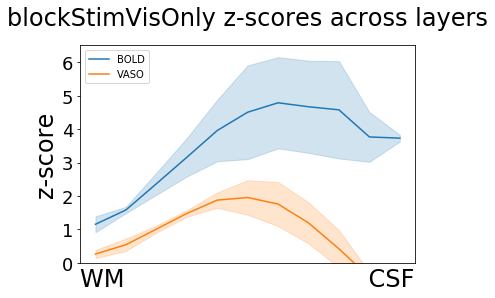

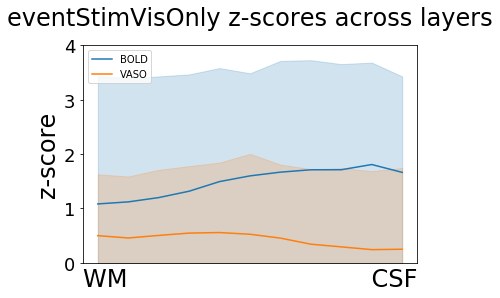

In [38]:
from matplotlib.ticker import MaxNLocator

# for focus in ['v1Focus', 's1Focus']:
for stimType in ['blockStimVisOnly', 'eventStimVisOnly']:
    for focus, cmap in zip(['v1Focus'],['tab10']):
        fig, ax = plt.subplots()
        tmp = zscores.loc[(zscores['stimType']==stimType)&(zscores['focus']==focus)]

        sns.lineplot(data=tmp, x='layer', y='data', hue='modality', palette=cmap)


        plt.ylabel('z-score', fontsize=24)

        plt.title(f"{stimType} z-scores across layers", fontsize=24, pad=20)
        plt.xlabel('WM                                CSF', fontsize=24)
        plt.xticks([])
        yLimits = ax.get_ylim()
        plt.ylim(0,yLimits[1])    

        plt.yticks(fontsize=18)

        ax.yaxis.set_major_locator(MaxNLocator(integer=True))

        plt.legend(loc='upper left')


        plt.savefig(f'{root}/derivatives/sub-09_ses-002_{stimType}_{focus}_zScoreProfile.png', bbox_inches = "tight")
        plt.show()

No handles with labels found to put in legend.


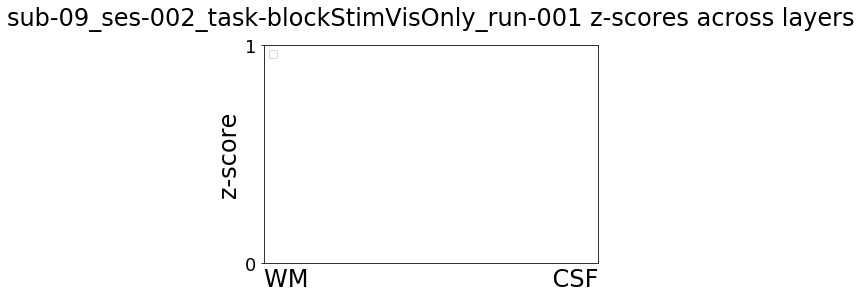

No handles with labels found to put in legend.


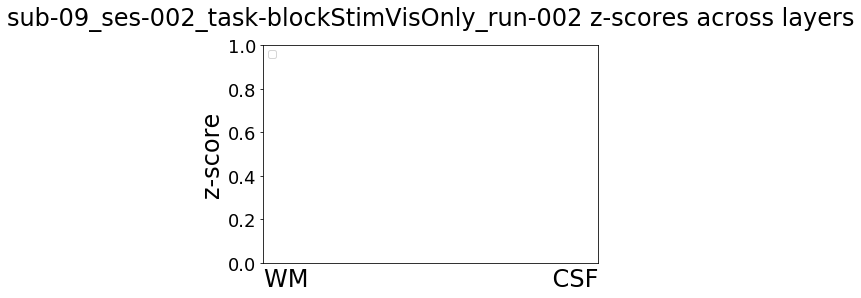

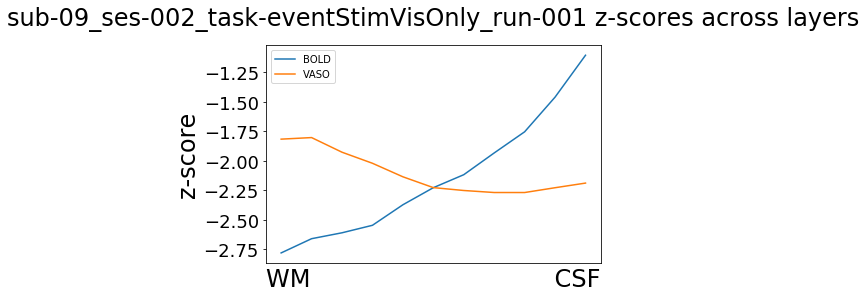

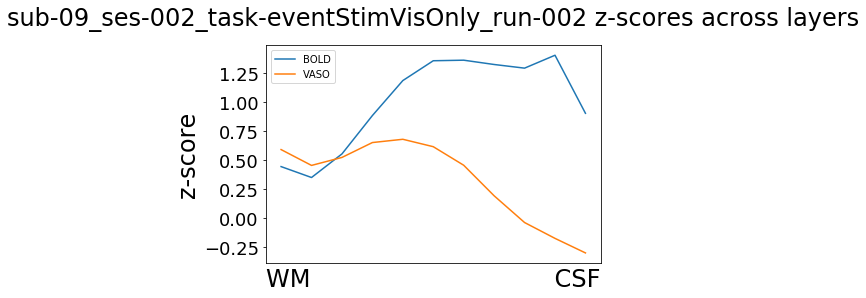

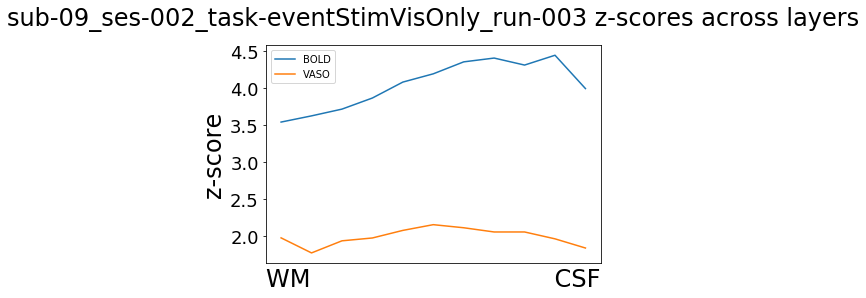

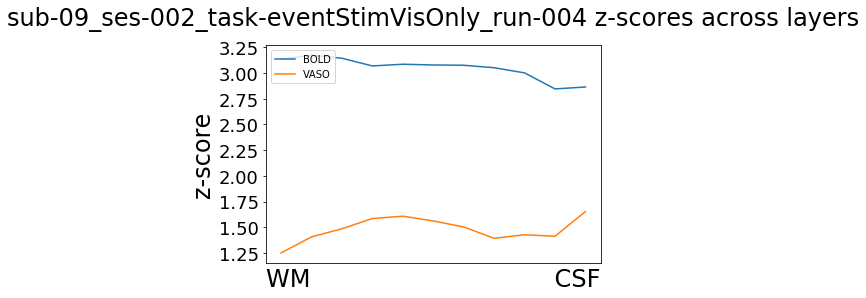

In [37]:
from matplotlib.ticker import MaxNLocator

# for focus in ['v1Focus', 's1Focus']:
for stimType in ['eventStimVisOnly']:
    for focus, cmap in zip(['v1Focus'],['tab10']):
        fig, ax = plt.subplots()
        
        for run in zscores['run'].unique():
        
            tmp = zscores.loc[(zscores['stimType']==stimType)&(zscores['focus']==focus)&(zscores['run']==run)]

            sns.lineplot(data=tmp, x='layer', y='data', hue='modality', palette=cmap)


            plt.ylabel('z-score', fontsize=24)

            plt.title(f"{run} z-scores across layers", fontsize=24, pad=20)
            plt.xlabel('WM                                CSF', fontsize=24)
            plt.xticks([])
            yLimits = ax.get_ylim()
#             plt.ylim(0,yLimits[1])    

            plt.yticks(fontsize=18)

            ax.yaxis.set_major_locator(MaxNLocator(integer=True))

            plt.legend(loc='upper left')


            plt.savefig(f'{root}/sub-09_ses-002_{run}_{focus}_zScoreProfile.png', bbox_inches = "tight")
            plt.show()